## _Competitor Analysis, Customer Insights & Business Intelligence upon the Japanese restaurant industry in Toronto, Canada_

### **_by Sebastian Sbirna, Yingrui Li, Clara Andersen, Qin Long & Xin Li_**
---
## Table of Contents:
- [__CHAPTER 1: _Yelp dataset segmentation & wrangling___](#C1.)

    - [__Part 1: Subsetting the Yelp data__](#C1.1.)
    
    - [__Part 2: Wrangling the Yelp business data__](#C1.2.)

---

- [__CHAPTER 2: _Business Owner Perspective___](#C2.)

    - [__Part 1: Business analysis of client operations__](#C2.1.)
        - [1.1. <u>Analysis of the distribution of review contents by year, month, weekday</u>](#C2.1.1.)
        - [1.2. <u>Analysis of the distribution of review counts given by Yelp elite-users</u>](#C2.1.2.)
        - [1.3. <u>KPI analysis: Returning Feedback Provider Rate</u>](#C2.1.3.)
        - [1.4. <u>Analysis of the distribution of Yelp seniority of all our reviewing users</u>](#C2.1.4.)
        - [1.5. <u>KPI analysis: Influencer Rate</u>](#C2.1.5.)<br><br>
    - [__Part 2: Competitor Discovery__](#C2.2.)
        - [2.1. <u>Direct competitors with very similar business categories</u>](#C2.2.1.)
        - [2.2. <u>Restaurant competitors within the same neigbourhood/the near vicinity of the client</u>](#C2.2.2.)
        - [2.3. <u>Restaurant competitors with similar overall popularity as our client</u>](#C2.2.3.)
        - [2.4. <u>Competitor data aggregation & conclusion</u>](#C2.2.4.)<br><br>
    - [__Part 3: Text Analytics upon Client vs. Competitor reviews__](#C2.3.)
        - [3.1. <u>Topic analysis of client reviews: KINKA IZAKAYA ORIGINAL</u>](#C2.3.1.)
        - [3.2. <u>Topic analysis of level 7 competitor reviews: Ogadang</u>](#C2.3.2.)
        - [3.3. <u>Topic analysis of level 6 competitor reviews: Yuzu Izakaya</u>](#C2.3.3.)
        - [3.4. <u>Topic analysis of level 5 competitor reviews: general topics</u>](#C2.3.4.)<br><br>
    - [__Part 4: Prediction of possible customer increase by increasing opening hours__](#C2.4.)
        - [4.1. <u>Data Modeling & Augmentation</u>](#C2.4.1.)
        - [4.2. <u>Preparation of data for Model Ingestion</u>](#C2.4.2.)
        - [4.3. <u>Prediction Model: Dummy (Mean) Regression baseline model</u>](#C2.4.3.)
        - [4.4. <u>Prediction Model: Linear Regression model</u>](#C2.4.4.)
        - [4.5. <u>Prediction Model: Neural Network model</u>](#C2.4.5.)
        - [4.6. <u>Model performance comparison using credibility intervals</u>](#C2.4.6.)
        - [4.7. <u>Predicting upon the business client data</u>](#C2.4.7.)
        - [4.8. <u>Conclusion upon the prediction results</u>](#C2.4.8.)
        
---

- [__CHAPTER 3: _Investor Perspective___](#C3.)

    - [__Part 1: Prediction of popularity class__](#C3.1.)
        - [1.1. <u>Visualize Toronto restaurant distribution</u>](#C3.1.1.)
        - [1.2. <u>Data Augmentation for popularity metrics</u>](#C3.1.2.)
        - [1.3. <u>Prediction of restaurants' popularity class</u>](#C3.1.3.)
        - [1.4. <u>Feature analysis</u>](#C3.1.4.)
        - [1.5. <u>Conclusion</u>](#C3.1.5.)<br><br>
    - [__Part 2: Does geolocation affect the success and popularity of restaurants?__](#C3.2.)
        - [2.1. <u>Data loading and cleaning</u>](#C3.2.1.)
        - [2.2. <u>Visualization of success scores across Toronto businesses</u>](#C3.2.2.)
        - [2.3. <u>Interpretable machine learning: KNN classification model</u>](#C3.2.3.)
        - [2.4. <u>Deep Learning model: multilayer neural network</u>](#C3.2.4.)
        - [2.5. <u>Conclusion</u>](#C3.2.5.)<br><br>
    - [__Part 3: What makes restaurants close down?__](#C3.3.)
        - [3.1. <u>Data preparation and wrangling</u>](#C3.3.1.)
        - [3.2. <u>Standardization of the dataset</u>](#C3.3.2.)
        - [3.3. <u>Defining training and test sets for our prediction models</u>](#C3.3.3.)
        - [3.4. <u>Prediction modeling</u>](#C3.3.4.)
        - [3.5. <u>Interpreting the factors influencing prediction</u>](#C3.3.5.)
        - [3.6. <u>Conclusion</u>](#C3.3.6.)
---

The ___Yelp___ online service is an application which stores, aggregates and displays crowdsourced reviews about businesses published in their internal database. This project makes use of the [Yelp dataset](https://www.yelp.com/dataset), which is a subset of Yelp's businesses, reviews, and user data. It was originally put together for the ___Yelp Dataset Challenge___ which is a chance for students to conduct research or analysis on Yelp's data and share their discoveries. In the dataset, you will find information about 192.609 businesses reviewed by 1.637.138 users across 10 metropolitan areas in four countries. 

Since this dataset is extremely large to work with (containing 10+ GB of data), ___we have subsetted the data further___ into one geographical area of interest: ___Toronto, Canada___, and one business category: ___Restaurants___.

In this report, we have been tasked with helping the restaurant industry in Toronto. By conducting a business customer & competitor analysis, we will present several operational recommendations to _Kinka Izakaya Original_, which is a very popular Japanese restaurant in Toronto. We will also analyze the overall restaurant industry in Toronto as a whole, to provide recommendations for investors interested in investing in restaurants in the area.

_The original dataset (found on the official website) is required for re-running the analysis of this project._ 

___For a condensed, management-perspective report, please read the "Executive Summary" document in this repository.___

<a id='C1.'></a>
## _Chapter 1: Subsetting the Yelp dataset to include only data from Toronto, Canada, and wrangling the business data_
---

In [1]:
import numpy
import pandas as pd 
import json

__The purpose of this notebook has been to create a standarized method to perform data segmentation across all future analysis parts of our notebook, so that all analysis be done, as a starting point, upon the same data subsets for all project parts.__

When there has been an individual need for further data wrangling or segmentation, this is done and discussed subsequently inside the relevant project subpart.

<a id='C1.1.'></a>
## Part 1: Subsetting the Yelp data

#### _Here, we are filtering the 10GB+ original dataset into the relevant subset of businesses and saving the corresponding data subsets as a CSV file for easier loading of the dataset:_

***Filtering businesses:***

First, we will load the businesses dataframe using pandas:

In [2]:
all_business_df = pd.read_json('yelp_dataset/yelp_academic_dataset_business.json', lines = True)

After that, we are first interested in focusing our analysis on a specific city chosen for this project: **Toronto**.

In [3]:
all_business_toronto_df = all_business_df[all_business_df.city == 'Toronto']
all_business_toronto_df = all_business_toronto_df.loc[all_business_toronto_df.categories.dropna().index]

We would like to save a dataset relative to all the restaurants in Toronto, in order to possibly use it for extended competitor analysis:

In [4]:
restaurants_business_toronto_df = all_business_toronto_df[all_business_toronto_df.categories.str.contains('Restaurant')]

Then, we are interested in selecting all businesses which deal with Japanese food:

In [5]:
japanese_restaurants_business_toronto_df = restaurants_business_toronto_df[restaurants_business_toronto_df.categories.str.contains('Japanese')]

Finally, now that we have our relevant subset of business that we can potentially look at, we will try to create a list of the IDs of these businesses, in order to use this to subset the other datasets:

In [10]:
business_id_all_business_toronto = list(all_business_toronto_df.business_id)
business_id_restaurants_toronto = list(restaurants_business_toronto_df.business_id)
business_id_japanese_restaurants_toronto = list(japanese_restaurants_business_toronto_df.business_id)

After all these datasets have been subsetted, let us save them into their own CSV files:

In [11]:
all_business_toronto_df.to_csv('yelp_dataset/toronto_all_business.csv', index = False)
restaurants_business_toronto_df.to_csv('yelp_dataset/toronto_restaurant_business.csv', index = False)
japanese_restaurants_business_toronto_df.to_csv('yelp_dataset/toronto_japanese_business.csv', index = False)

In [12]:
del all_business_df
del all_business_toronto_df
del restaurants_business_toronto_df
del japanese_restaurants_business_toronto_df

***Filtering reviews:***

The *review* JSON file is extremely large, and often is bound to give memory errors when trying to read it directly from using the specialized `read_json` functions of `pandas` or `dask`. Therefore, we need a more Python-traditional approach:

In [15]:
with open('yelp_dataset/yelp_academic_dataset_review.json', mode = 'r', encoding = 'utf8') as json_file:
    data = json_file.readlines()
    data = list(map(json.loads, data))
    
all_reviews_df = pd.DataFrame(data)

After we are able to load the data, we will filter the reviews immediately by keeping only those that are relevant to our businesses, in order to lower the memory footprint that is taken up by the *reviews* dataframe.

Initially, we will filter by all reviews relevant to all businesses in **Toronto**:

In [16]:
all_reviews_toronto_df = all_reviews_df[all_reviews_df.business_id.isin(business_id_all_business_toronto)]

Next, we want to subset by the reviews of all restaurants in Toronto:

In [17]:
restaurants_reviews_toronto_df = all_reviews_toronto_df[all_reviews_toronto_df.business_id.isin(business_id_restaurants_toronto)]

We want to subset even further to only get the reviews of any Japanese-specific restaurants in Toronto:

In [18]:
japanese_restaurants_reviews_toronto_df = restaurants_reviews_toronto_df[restaurants_reviews_toronto_df.business_id.isin(business_id_japanese_restaurants_toronto)]

Lastly, we are interested in storing the IDs of the users writing all these reviews, in order to filter the Tips and Users datasets.

In [19]:
user_id_all_reviews_toronto = list(all_reviews_toronto_df.user_id)
user_id_restaurants_toronto = list(restaurants_reviews_toronto_df.user_id)
user_id_japanese_restaurants_toronto = list(japanese_restaurants_reviews_toronto_df.user_id)

Let us save these three datasets for future re-usage:

In [20]:
all_reviews_toronto_df.to_csv('yelp_dataset/toronto_all_reviews.csv', index = False)
restaurants_reviews_toronto_df.to_csv('yelp_dataset/toronto_restaurant_reviews.csv', index = False)
japanese_restaurants_reviews_toronto_df.to_csv('yelp_dataset/toronto_japanese_reviews.csv', index = False)

In [21]:
del all_reviews_df
del all_reviews_toronto_df
del restaurants_reviews_toronto_df
del japanese_restaurants_reviews_toronto_df

***Filtering checkins:***

The same steps will be repeated for the check-in dataset, so let's follow along:

In [22]:
all_checkins_df = pd.read_json('yelp_dataset/yelp_academic_dataset_checkin.json', lines = True)
all_checkins_toronto_df = all_checkins_df[all_checkins_df.business_id.isin(business_id_all_business_toronto)]
restaurants_checkins_toronto_df = all_checkins_toronto_df[all_checkins_toronto_df.business_id.isin(business_id_restaurants_toronto)]
japanese_restaurants_checkins_toronto_df = restaurants_checkins_toronto_df[restaurants_checkins_toronto_df.business_id.isin(business_id_japanese_restaurants_toronto)]

Let's save the datasets:

In [23]:
all_checkins_toronto_df.to_csv('yelp_dataset/toronto_all_checkins.csv', index = False)
restaurants_checkins_toronto_df.to_csv('yelp_dataset/toronto_restaurant_checkins.csv', index = False)
japanese_restaurants_checkins_toronto_df.to_csv('yelp_dataset/toronto_japanese_checkins.csv', index = False)

In [24]:
del all_checkins_df
del all_checkins_toronto_df
del restaurants_checkins_toronto_df
del japanese_restaurants_checkins_toronto_df

***Filtering tips:***

The same steps as last time will be used for the tips dataset:

In [25]:
all_tips_df = pd.read_json('yelp_dataset/yelp_academic_dataset_tip.json', lines = True)
all_tips_toronto_df = all_tips_df[(all_tips_df.business_id.isin(business_id_all_business_toronto) & (all_tips_df.user_id.isin(user_id_all_reviews_toronto)))]
restaurants_tips_toronto_df = all_tips_toronto_df[(all_tips_toronto_df.business_id.isin(business_id_restaurants_toronto) & all_tips_toronto_df.user_id.isin(user_id_restaurants_toronto))]
japanese_restaurants_tips_toronto_df = restaurants_tips_toronto_df[(restaurants_tips_toronto_df.business_id.isin(business_id_japanese_restaurants_toronto) & restaurants_tips_toronto_df.user_id.isin(user_id_japanese_restaurants_toronto))]

In [34]:
all_tips_toronto_df.to_csv('yelp_dataset/toronto_all_tips.csv', index = False)
restaurants_tips_toronto_df.to_csv('yelp_dataset/toronto_restaurant_tips.csv', index = False)
japanese_restaurants_tips_toronto_df.to_csv('yelp_dataset/toronto_japanese_tips.csv', index = False)

In [35]:
del all_tips_df
del all_tips_toronto_df
del restaurants_tips_toronto_df
del japanese_restaurants_tips_toronto_df

***Filtering users:***

Finally, once again, the same steps will be applied for the users dataset:

In [36]:
with open('yelp_dataset/yelp_academic_dataset_user.json', mode = 'r', encoding = 'utf8') as json_file:
    data = json_file.readlines()
    data = list(map(json.loads, data))
    
all_users_df = pd.DataFrame(data)

In [37]:
all_users_toronto_df = all_users_df[all_users_df.user_id.isin(user_id_all_reviews_toronto)]
restaurants_users_toronto_df = all_users_toronto_df[all_users_toronto_df.user_id.isin(user_id_restaurants_toronto)]
japanese_restaurants_users_toronto_df = restaurants_users_toronto_df[restaurants_users_toronto_df.user_id.isin(user_id_japanese_restaurants_toronto)]

In [38]:
all_users_toronto_df.to_csv('yelp_dataset/toronto_all_users.csv', index = False)
restaurants_users_toronto_df.to_csv('yelp_dataset/toronto_restaurant_users.csv', index = False)
japanese_restaurants_users_toronto_df.to_csv('yelp_dataset/toronto_japanese_users.csv', index = False)

In [39]:
del all_users_df
del all_users_toronto_df
del restaurants_users_toronto_df
del japanese_restaurants_users_toronto_df

<a id='C1.2.'></a>
## Part 2: Wrangling the Yelp business data

In [71]:
toronto_all_business_df = pd.read_csv('yelp_dataset/toronto_all_business.csv')
toronto_restaurant_business_df = pd.read_csv('yelp_dataset/toronto_restaurant_business.csv')
toronto_japanese_business_df = pd.read_csv('yelp_dataset/toronto_japanese_business.csv')

Wrangle the `attributes` column into a JSON-parsable format:

In [73]:
def wrangle_attributes(row):
    attributes_data = row.attributes
    
    if (pd.isnull(attributes_data)):
        row['attributes'] = '{}'
        return row
        
    attributes_data = attributes_data.replace("\"u\'", "\'")
    attributes_data = attributes_data.replace('\'', '\"')
    attributes_data = attributes_data.replace('""', '"')
    attributes_data = attributes_data.replace('"{', '{')
    attributes_data = attributes_data.replace('}"', '}')
    attributes_data = attributes_data.replace(' False', ' "False"')
    attributes_data = attributes_data.replace(' True', ' "True"')
    attributes_data = attributes_data.replace(' None', ' "None"')
    
    row['attributes'] = attributes_data
    return row

This is a test to see if all rows in the largest dataset can be easily converted to JSON format.

This code should finish without showing errors, if all the data can be safely converted into JSON dictionaries.

In [65]:
# This is a test to see if all rows in the largest dataset can be easily converted to JSON format
# This code should finish without showing errors, if all the data can be safely converted into JSON dictionaries

for index, row in toronto_all_business_df.apply(lambda row: wrangle_attributes(row), axis = 1).iterrows():
    json.loads(row.attributes)

In [74]:
toronto_all_business_df = toronto_all_business_df.apply(lambda row: wrangle_attributes(row), axis = 1)
toronto_restaurant_business_df = toronto_restaurant_business_df.apply(lambda row: wrangle_attributes(row), axis = 1)
toronto_japanese_business_df = toronto_japanese_business_df.apply(lambda row: wrangle_attributes(row), axis = 1)

Wrangle the `hours` column into a fixed and consistent hour format:

In [84]:
def wrangle_hours(row):
    hours_data = row.hours
    
    if (pd.isnull(hours_data)):
        row['hours'] = '{}'
        return row
        
    hours_data = hours_data.replace('\'', '\"')
    hours_data = hours_data.replace('""', '"')
    hours_data = hours_data.replace('"{', '{')
    hours_data = hours_data.replace('}"', '}')
    hours_data = hours_data.replace(':0', ':00')
    
    row['hours'] = hours_data
    return row

This is a test to see if all rows in the largest dataset can be easily converted to JSON format:

In [88]:
# This is a test to see if all rows in the largest dataset can be easily converted to JSON format

for index, row in toronto_all_business_df.apply(lambda row: wrangle_hours(row), axis = 1).iterrows():
    json.loads(row.hours)

In [89]:
toronto_all_business_df = toronto_all_business_df.apply(lambda row: wrangle_hours(row), axis = 1)
toronto_restaurant_business_df = toronto_restaurant_business_df.apply(lambda row: wrangle_hours(row), axis = 1)
toronto_japanese_business_df = toronto_japanese_business_df.apply(lambda row: wrangle_hours(row), axis = 1)

In [91]:
toronto_all_business_df.to_csv('yelp_dataset/toronto_all_business.csv', index = False)
toronto_restaurant_business_df.to_csv('yelp_dataset/toronto_restaurant_business.csv', index = False)
toronto_japanese_business_df.to_csv('yelp_dataset/toronto_japanese_business.csv', index = False)

---

<a id='C2.'></a>
## _Chapter 2: Client and Competitor business analytics upon Japanese restaurant businesses of Toronto, Canada_
---

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import json
import requests

from datetime import datetime
from pprint import pprint

In [1]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction import stop_words
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
import string
import csv

from sklearn.decomposition import LatentDirichletAllocation

from sklearn.model_selection import KFold
from sklearn.preprocessing import RobustScaler
from sklearn.dummy import DummyRegressor

from sklearn.linear_model import LinearRegression
from sklearn.compose import TransformedTargetRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

from keras.backend.tensorflow_backend import tf
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.wrappers.scikit_learn import KerasRegressor

from scipy import stats

# Display all columns of a pandas dataframe
# pd.set_option('display.max_columns', 0)

%matplotlib inline

<a id='C2.1.'></a>
## Part 1. Business analysis of client operations

_The client of our project has been selected based both on the __number of stars (rating)__ and also **on the total number of reviews**_. 

We assume that the total number of reviews gives a strong indication of the popularity of the business, and we have selected a restaurant business with high number of ratings, since we are interested in having enough reviews to perform a comprehensive text analysis review upon the client. 

Moreover, we want to select a business with an average rating of 4.0/5.0, since we are interested in advising a client on potential ways to inprove its outreach and services into the targeted market. A business with large amount of reviews and ratings of 4.5 or 5.0 stars are highly difficult to achieve improvement with, since their ranking is already quite high, where improvments are normally found in small details, and perhaps small issues or negative reviews, even with such high overall ratings, are due to the law of large numbers and the vast preferences of customers.

__Our client is: Kinka Izakaya Original, a Japanese izakaya restaurant/bar in Toronto.__

The client is a Japanese izakaya restaurant which focuses on an evening schedule and cuisine in order to attract customers. The term "izakaya" comes from a Japanese concept of a traditional tavern with lively, cheerful atmosphere. An izakaya is well-suited both for after-work corporate small drinking events and also for family dinners. The atmosphere in most izakayas is family-friendly, with a strong emphasis on having a good time with the people around you, whether it be family members or good friends. That is why most izakayas also offer small food plates with traditional food, and servings are considered as important as the drinks themselves. This is much in contrast to bars and night restaurants, where the atmosphere is heavily focused on drinking, and is not a family-friendly environment. Therefore, our client distinguishes itself from some other evening restaurant through the thematic and the concept upon which the restaurant is centered.

In [2]:
toronto_all_business_df = pd.read_csv('yelp_dataset/toronto_all_business.csv')
toronto_restaurant_business_df = pd.read_csv('yelp_dataset/toronto_restaurant_business.csv')
toronto_japanese_business_df = pd.read_csv('yelp_dataset/toronto_japanese_business.csv')

In [3]:
client_row = (toronto_japanese_business_df[toronto_japanese_business_df.name == "KINKA IZAKAYA ORIGINAL"]).iloc[0]

In [4]:
pd.DataFrame([client_row])

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
535,RtUvSWO_UZ8V3Wpj0n077w,KINKA IZAKAYA ORIGINAL,398 Church St,Toronto,ON,M5B 2A2,43.66043,-79.378927,4.0,1592,1,"{""RestaurantsAttire"": ""casual"", ""BusinessParki...","Restaurants, Tapas/Small Plates, Japanese, Bar...","{""Monday"": ""17:00-0:00"", ""Tuesday"": ""17:00-0:0..."


In this part, we will do a customer analysis upon our client data, using the following business leads:

__1)__ __The distribution of review contents__ by year, month and weekday

__2)__ __The distribution of the stars received in the client's reviews__, based on the "eliteness" of customers. The Yelp Elite user status is Yelp's way of recognizing people who are active in the Yelp community, becoming influencers on the social platform. Elite-status is granted based upon a number of things, including well-written reviews, high quality photos and a detailed personal profile. The more years of elite-status a user is, the more active and appealing he is on this platform _[(Reference)](https://www.yelp-support.com/article/What-is-Yelps-Elite-Squad?l=en_US)_

__3)__ ___KPI analysis:___ __Returning Feedback Provider Rate__. This rate is based on the returning visitors' rate. Since we do not have information about customer orders and purchases, we cannot identify returning customers with precision. Therefore, we will assume that a "returning feedback provider" is anyone who ever gave more than one review to our client. These kind of customers must be loyal and will play important roles in attracting more customers on Yelp

__4)__ __The distribution of the review providers' seniority on the Yelp platform.__ Yelp seniority refers to the number of years that users have been active on Yelp. Since our client restaurant has been open for more than 10 years, by investigating this distribution, we could see whether our client has been keeping a good interaction with Yelp users during the past

__5)__ ___KPI analysis:___ __Influencer Rate__. Every social media platform, such as Instagram, Facebook, Twitter and Yelp, has its own "influencers". Sometimes, the power of an influencer is crossing the borders of just one platform. Influencers generally have thousands of fans and perform close cooperation with different brands on social media. We will try to figure out whether our client's restaurant has ever attracted Yelp Influencers and gained their positive feedback

We will need to load in and open both the review file and user file where the data regarding our client business is located.

__Note__: Because both the user file and review file is too large (more than 5 GB), we will use a sub-dataset of reviews by filtering based on city and restaurant type to Toronto & Japanese restaurant, and we will only keep users who have already given at least one feedback to our client's restaurant. We have performed some of these data cleaning steps, and have saved a custom dataset already, for easy loading into this analysis notebook:

In [5]:
Review = pd.read_csv("./yelp_dataset/toronto_japanese_reviews.csv")

data_review = Review[Review['business_id'] == client_row.business_id]
user_list = data_review['user_id'].unique().tolist()

In [6]:
data_user = pd.read_csv("./yelp_dataset/client_user_files.csv")

<a id='C2.1.1.'></a>
### 1.1. Analysis of the distribution of review contents by year, month, weekday

In this analysis part, we will have a look at the general distribution of feedback, regardless of their sentiment score (whether they are positive or negetive). 

The time-period which this dataset covers is from 2009 to 2019.

In [7]:
data_review.head(2)

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
38953,vmbSnHypqNnS-_OAf2qhQQ,I0ovidZUTV9A5LPIMz0I4Q,RtUvSWO_UZ8V3Wpj0n077w,3.0,1,0,1,"Very, very loud (but that is what an Izakaya e...",2017-04-19 13:55:23
38956,3i-SwTJPdr8SMp3BUu4lew,tBnTi-2Ld8AcNB-PD3S4eQ,RtUvSWO_UZ8V3Wpj0n077w,4.0,2,1,1,Am I going to say this is the best restaurant ...,2012-08-15 02:10:00


In [8]:
data_review.loc[:, 'date'] = pd.to_datetime(data_review.loc[:, 'date']);
data_review.loc[:, 'year'] = data_review['date'].dt.year;
data_review.loc[:, 'month'] = data_review['date'].dt.month;
data_review.loc[:, 'weekday'] = data_review['date'].dt.weekday;

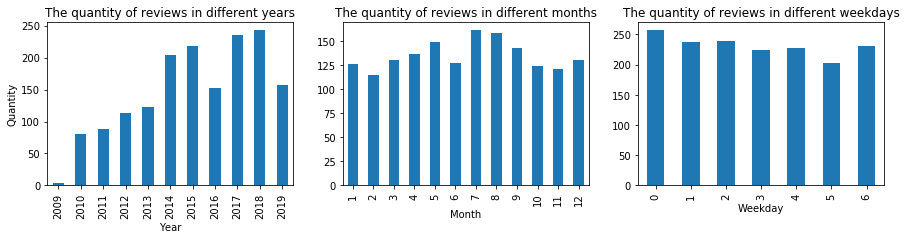

In [9]:
plt.subplot(131)
ax = data_review.groupby('year')['text'].count().plot.bar(figsize=(15,3))
plt.title('The quantity of reviews in different years');
plt.xlabel("Year");
plt.ylabel("Quantity");

plt.subplot(132)
ax = data_review.groupby('month')['text'].count().plot.bar()
plt.title('The quantity of reviews in different months');
plt.xlabel("Month");

plt.subplot(133)
ax = data_review.groupby('weekday')['text'].count().plot.bar()
plt.title('The quantity of reviews in different weekdays');
plt.xlabel("Weekday");

__Conclusion:__

There is an increasing trend in the quantities of review feedback per year. However, 2016 and 2019 not follow the trend pattern, especially considering the drop in number of reviews during 2019. 

__Does it mean the restaurant became less popular? This might be a potential problem.__

The visualizations above explain that there are more reviews given during the summertime (July and August) than wintertime (November, December, January or February), and more reviews are given on Sundays than any other days of the week.

Next, we want to have a look at how the mean star rating has changed over time during the past years:

In [10]:
print(data_review.groupby('year')['stars'].mean())

year
2009    3.250000
2010    3.975000
2011    4.193182
2012    4.175439
2013    4.065574
2014    4.098039
2015    4.174312
2016    4.117647
2017    4.131915
2018    4.279835
2019    4.006369
Name: stars, dtype: float64


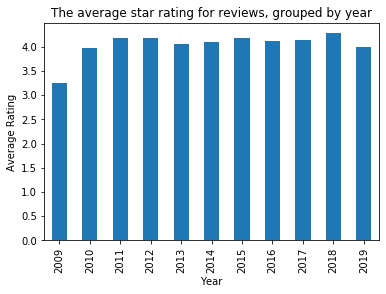

In [11]:
plt.subplot()
ax = data_review.groupby('year')['stars'].mean().plot.bar()
plt.title('The average star rating for reviews, grouped by year');
plt.xlabel("Year");
plt.ylabel("Average Rating");

__Conclusion:__

__In 2019, the average rating dropped to the lowest level since 2010.__

---

Next off, we plan to investigate the change in review quantities for each star-rating level, in order to see whether the positive reviews increased gradually or rapidly:

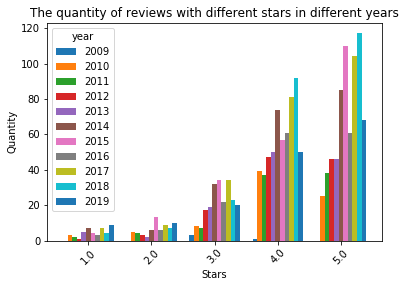

In [12]:
data_review.groupby(['year','stars'])['text'].count().unstack().T.plot.bar(width = 0.8)

plt.xticks(rotation = 45)
plt.xlabel("Stars")
plt.ylabel('Quantity')
plt.title('The quantity of reviews with different stars in different years');

__Conclusion:__

__The main bulk of reviews consist of reviews higher than 3.0 stars__, which is good for our business, but if look more closely, the total number of 4.0 and 5.0 star reviews has decreased significantly in 2019, which is a worrying trend to this restaurant's operation.

<a id='C2.1.2.'></a>
### 1.2. Analysis of the distribution of review counts given by Yelp elite-users

In [13]:
data_user['elite'] = data_user['elite'].astype(str)
data_user['elite years'] = data_user['elite'].apply(lambda x:len(x.split(',')))

In [14]:
data_user.head(2)

,Unnamed: 0,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,...,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,elite years
0,213,MFnXQb1R1IGLL_-W4oflJw,Angie,374,2009-05-06 05:16:01,941,275,542,"2009,2010,2011,2012,2013","djpMXOA1ic5wv3FPtubHNw, UOMSN12IGpju4sKwIJQE_Q...",...,4,18,0,43,63,84,84,57,17,5
1,255,LhFzr2vZDEc2KNHxuiHtIw,Cat,1639,2009-12-11 06:58:09,8349,3675,4590,"2010,2011,2012,2013,2014,2015,2016,2017,2018","zYlTuY9teqQOrrZq1pXcxw, LV0tWvAuDUkjNhfrhj5JFQ...",...,10,35,0,365,436,508,508,174,94,9


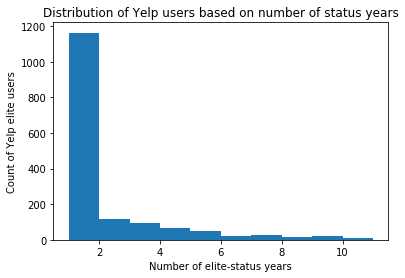

In [15]:
plt.hist(data_user['elite years']);

plt.title('Distribution of Yelp users based on number of status years');
plt.ylabel('Count of Yelp elite users');
plt.xlabel('Number of elite-status years');

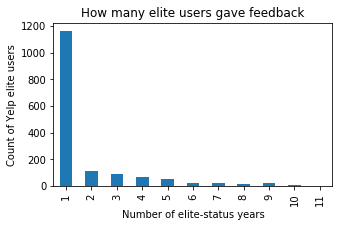

In [16]:
data_user.groupby('elite years')['elite'].count().plot.bar(figsize=(5,3));

plt.title('How many elite users gave feedback');
plt.ylabel('Count of Yelp elite users');
plt.xlabel('Number of elite-status years');

We can see that __most elite-user reviews are provided by newly-appointed elite users, and the amount of feedback received by our client is decreasing for higher-seniority elite users.__ This situation makes sense, because most Yelp users have not obtained elite status. 

Also, it is a positive development that the restaurant has attracted some high-seniority elite users in the past to provide reviews. Generally, high-level elite users will have bigger influences on social media platforms. Sometimes, they are powerful enough to become a business' word-of-mouth ambassadors. Therefore, reviews from the influencer group is highly important and beneficial for our client, and may requires more attention from the business side.

---
Lastly, we will investigate when the restaurant has received these elite users' reviews and what their sentiment was (i.e. positive or negative sentiment). 

Here, we define a user as a high-level elite user, if it has kept elite status for more than 5 years in the past.

In [17]:
elite = data_user[data_user['elite years'] > 4].user_id.astype(str)

In [18]:
data_review[data_review['user_id'].isin(elite)]['stars'].describe()

count    163.000000
mean       4.128834
std        0.762932
min        2.000000
25%        4.000000
50%        4.000000
75%        5.000000
max        5.000000
Name: stars, dtype: float64

We can see (from the data distribution) that most high-seniority elite user reviews are very positive, and only some are below 4. 

We would want to find out more about their content, and, therefore, we will apply text analysis to the negative reviews, in order to investigate the reasons behind the negative feedback.

In [19]:
data_review_bad_elite = data_review[(data_review['user_id'].isin(elite)) & (data_review['stars'] < 4)]

In [20]:
data_review_bad_elite.head(2)

,review_id,user_id,business_id,stars,useful,funny,cool,text,date,year,month,weekday
39037,YHslAkL2HE0ldFBm9XaK9g,MFnXQb1R1IGLL_-W4oflJw,RtUvSWO_UZ8V3Wpj0n077w,3.0,8,8,7,A Guu in Toronto! I can't quite believe it's f...,2010-01-08 20:53:18,2010,1,4
39442,OGR-oPrCdRwoJu5pFWzc4w,VHc1yqBhsE-l3JQFXuWydQ,RtUvSWO_UZ8V3Wpj0n077w,3.0,1,1,1,This place was cool for novelties sake. When y...,2012-11-08 11:01:13,2012,11,3


In [21]:
print("Negative reviews from top-elite users:", len(data_review_bad_elite))
print("Positive reviews from top-elite users:", len(data_review[(data_review['user_id'].isin(elite)) & (data_review['stars'] > 3)]))

Negative reviews from top-elite users: 34
Positive reviews from top-elite users: 129


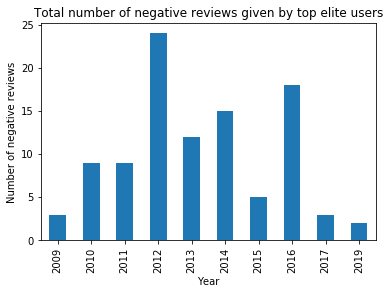

In [22]:
plt.subplot()
ax = data_review_bad_elite.groupby('year')['stars'].sum().plot.bar()
plt.title('Total number of negative reviews given by top elite users');
plt.xlabel("Year");
plt.ylabel("Number of negative reviews");

Fortunately, we can see that most of the negative restaurant client reviews are more than 3 years old, and in 2018, there was actually no negative review for the client within this user set.

In [23]:
def text_processing(text):
    lemmatizer = WordNetLemmatizer()
    
    # remove punctuation 
    text = "".join([c for c in text if c not in string.punctuation])
    
    # lowercase
    text = "".join([c.lower() for c in text])
    
    # remove stopwords
    text = " ".join([w for w in text.split() if w not in stop_words.ENGLISH_STOP_WORDS])
    
    # stemming / lematizing (optional)
    text = " ".join([lemmatizer.lemmatize(w) for w in text.split()])   
    
    return text

In [24]:
data_review_bad_elite.loc[:, 'text_clean'] = data_review_bad_elite['text'].apply(text_processing)

negative_elite = data_review_bad_elite['text_clean']

negative_wordcloud = ""
for i in negative_elite:
    negative_wordcloud = negative_wordcloud + str(i)

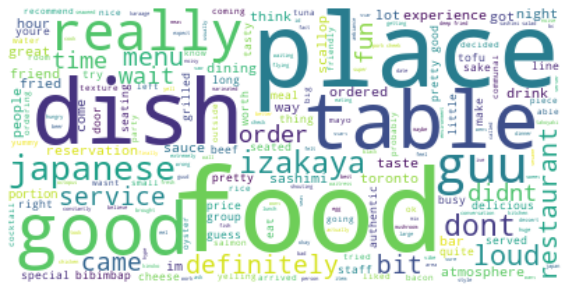

In [25]:
wordcloud = WordCloud(background_color = "white").generate(negative_wordcloud)
    
plt.figure(figsize = (10,10))
plt.imshow(wordcloud, interpolation = 'bilinear');
plt.axis("off")
plt.show();

Feedback from top elite users necessitates more attention, due to the fact that they are more active than regular Yelp users and could influence others easily because of their reputation through sharing a post or a review of the client business.

__Conclusion:__

__1)__ The wordcloud analysis shows some __possible problems in the client's atmosphere and service: for example, noisy environment, small dish portion and long waiting times.__ However, we can also notice that most of these negative feedbacks were given many years ago, with most of them being in 2012 and 2016. Therefore, we could deduce that the underlying problems discussed have been resolved throughout time, and will not threaten the present business operation of this restaurant. 

__2)__ Considering that __there are only 34 negative reviews from top elite users during the past 10 years, compared with 129 positive feedbacks__, we conclude this restaurant did well overall in gaining some positive feedback from top influencers. 

__3)__ One thing to address is that, from this analysis, it is shown that __the restaurant has not attracted a large number of top-elite users to write reviews for itself__. More focus could be put on targeting these specific customers, since top-elite Yelp users may become advertisement ambassadors while costing no advertisement fee, which could be of benefit to the client.

<a id='C2.1.3.'></a>
### 1.3. KPI analysis: Returning Feedback Provider Rate

Here, we will analyse and compute the number of users which have given feedback multiple times for our client, thus indicating their continued purchase from the client: 

In [26]:
print("Total amount of feedbacks:           ",len(data_review))
print("Feedbacks from different user IDs:   ",len(data_review['user_id'].unique()))
print()
print("KPI:\nReturning visitors rate =","{:.2%}".format(1-len(data_review['user_id'].unique())/len(data_review)))

Total amount of feedbacks:            1618
Feedbacks from different user IDs:    1592

KPI:
Returning visitors rate = 1.61%


__Conclusion:__

Unfortunately, the restaurant does not have many reviews from same user IDs. This may give a hint that __the restaurant could make marketing activities or discounts aimed at attracting returning customers__ and, implicitly, increasing their number of tips/checkins/reviews online. 

As an example, our client could issue special vouchers to recurring customers and encourage them to come back again. This is also a helpful way to increase brand loyalty.

<a id='C2.1.4.'></a>
### 1.4. Analysis of the distribution of Yelp seniority of all our reviewing users

In [27]:
data_user['yelping_since'] = data_user['yelping_since'].apply(pd.to_datetime)
data_user['yelp age'] = 2019 - data_user['yelping_since'].dt.year

In [28]:
data_user.head(2)

,Unnamed: 0,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,...,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,elite years,yelp age
0,213,MFnXQb1R1IGLL_-W4oflJw,Angie,374,2009-05-06 05:16:01,941,275,542,"2009,2010,2011,2012,2013","djpMXOA1ic5wv3FPtubHNw, UOMSN12IGpju4sKwIJQE_Q...",...,18,0,43,63,84,84,57,17,5,10
1,255,LhFzr2vZDEc2KNHxuiHtIw,Cat,1639,2009-12-11 06:58:09,8349,3675,4590,"2010,2011,2012,2013,2014,2015,2016,2017,2018","zYlTuY9teqQOrrZq1pXcxw, LV0tWvAuDUkjNhfrhj5JFQ...",...,35,0,365,436,508,508,174,94,9,10


We want to analyze the percentage of users with various Yelp seniority, and here we use an interactive visualization tool to show it:

In [29]:
user_agelevel = data_user['yelp age'].value_counts().reindex(range(len(data_user['yelp age'].unique())))
user_agelevel.index = ["Yelp age " + str(i) for i in range(len(data_user['yelp age'].unique()))]

In [30]:
user_agelevel

Yelp age 0      19
Yelp age 1      62
Yelp age 2     104
Yelp age 3     132
Yelp age 4     172
Yelp age 5     241
Yelp age 6     206
Yelp age 7     174
Yelp age 8     185
Yelp age 9     146
Yelp age 10     97
Yelp age 11     35
Yelp age 12     14
Yelp age 13      5
Name: yelp age, dtype: int64

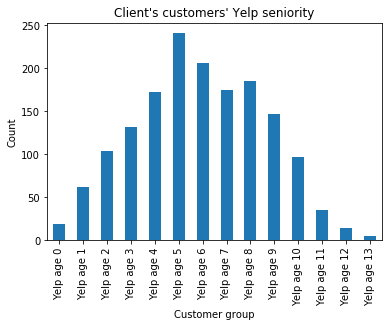

In [31]:
user_agelevel.plot.bar();
plt.title('Client\'s customers\' Yelp seniority');
plt.xlabel("Customer group");
plt.ylabel("Count");

__Conclusion:__

__Most customers of the restaurant have been using the Yelp platform for 5 to 8 years.__ One noticeable thing is that there are more Yelp customers with low Yelp seniority than mature Yelp customers (with high Yelp seniority), which means __the restaurant has done a good job to attract new Yelp users, however they have omitted to attract mature users as well.__

Therefore, we encourage this restaurant to have a closer cooperation with the influencers and exploit their satisfaction value in marketing events. 

___This conclusion has inspired us to perform the KPI measurement: influencer rate analysis below:___

<a id='C2.1.5.'></a>
### 1.5. KPI analysis: Influencer Rate

First, we will have a look of all of the users who have provided reviews for our client restaurant, and retrieve their user data.

In [32]:
user_list = data_review['user_id'].unique().astype(str)

data_user_related = data_user[data_user['user_id'].isin(user_list)].sort_values(by = ['fans'], ascending = False)
data_user_related = data_user_related.drop(["Unnamed: 0","name","friends","elite","elite years"], axis = 1)

In [33]:
data_user_related.head()

,user_id,review_count,yelping_since,useful,funny,cool,fans,average_stars,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,yelp age
36,jt49xjEjQisu6wTTGn6B3A,1727,2010-07-01 22:09:09,15962,5064,10936,857,4.25,463,80,45,70,34,828,4837,1273,1273,423,448,9
42,CxDOIDnH8gp9KXzpBHJYXw,6633,2009-11-09 20:44:45,22711,9242,14486,789,3.33,734,190,38,68,92,1366,3726,1653,1653,458,1543,10
1259,xQmm-eW-8jiMWbEZQN44tA,374,2011-10-01 07:23:45,7322,4116,5860,644,3.80,494,35,11,21,3,212,300,613,613,294,723,8
45,Q9mA60HnY87C1TW5kjAZ6Q,1376,2010-08-29 01:34:42,8888,5094,7545,562,4.11,424,58,42,48,21,588,2502,770,770,203,125,9
95,APoAugdz6nscL4HjF4Oryg,1312,2011-08-29 21:46:40,5018,1699,2835,460,3.76,176,28,17,16,4,118,143,269,269,175,118,8


Some users have accumulated a large base of fans on the Yelp social app platform. In the original user file, if we would have a look at all the users giving reviews for restaurants in Toronto, we have noticed that there are some users who have gathered more than 1000, 2000 and even more than 3000 fans. 

From looking at the filtered user dataframe above, for our client restaurant, __the influencer with highest number of fans has under 1000 (i.e. 857) fans.__ <br> However, based on life experience, we can argue that users who attract only a moderate amount of attention can also be considered as popular. As a reference, __we will assume that, if a user has more than 200 fans on a platform, then such a user can be considered popular.__

With this data found, we plan to see whether these popular users on Yelp have given negative feedback to our client:

In [34]:
print("Our client business has attracted", len(data_user_related[data_user_related['fans'] > 200]), 'influencers with over 200 fans.')

Our client business has attracted 12 influencers with over 200 fans.


In [35]:
user_list_2 = data_user_related[data_user_related['fans'] > 200]['user_id'].astype(str)

In [36]:
data_review[(data_review['user_id'].isin(user_list_2)) & (data_review['stars'] < 4)]

,review_id,user_id,business_id,stars,useful,funny,cool,text,date,year,month,weekday
40917,pMTmHVcf19C-yipd4IHmpw,Q9mA60HnY87C1TW5kjAZ6Q,RtUvSWO_UZ8V3Wpj0n077w,3.0,8,14,2,Grandma alert! Grandma alert!\n\nI remember ba...,2014-04-07 13:39:06,2014,4,0
44414,6kRTVF6MXgyfhukk_3GakA,JesJ-LaNfr3pKhL7gWhDrw,RtUvSWO_UZ8V3Wpj0n077w,3.0,8,1,2,"#1 best izakaya in the GTA apparently, and I c...",2014-10-16 02:46:59,2014,10,3
47085,N696UJmoL7H1kdBGOHy-QQ,2esyx8s04Vrde3Pn8GMNsQ,RtUvSWO_UZ8V3Wpj0n077w,2.0,6,8,3,GUU-dness gracious!!!! We made a reservation m...,2015-07-06 12:02:59,2015,7,0


There are 12 influencers which have reviewed our client restaurant, and three of them have given negative feedback. 

The business should care highly about how influencers write their feedbacks, since they have impact upon a large fan base and their reviews are more likely to be browsed by their network, which enlargens the effect of a negative feedback. The restaurant should try to always keep a good relationship with this group of users.

In [37]:
print("Out of all customers reviewing our client business, the influencer rate is:", "{:.2%}".format(len(data_user_related[data_user_related['fans'] > 200])/len(data_user_related)))

Out of all customers reviewing our client business, the influencer rate is: 0.75%


__Conclusion:__

The rate of influencer reviews for our business is very low.

__As we have explained before, our client does not seem to gain the attention of top influencers on the Yelp platform, hence, in the future, the restaurant should seek cooperation with more senior and popular users, and try to gain their recommendation as much as possible.__

<a id='C2.2.'></a>
## Part 2. Competitor Discovery

It is very important to know your own competition, and some of the most relevant examples of competitors are restaurants with similar or identical cuisine specific as our client has. These restaurants serve as direct competitors, no matter their size or location, since they attack the same customer market as our client does. 

In [38]:
# Let us print the categories of restaurant that the client is involved in:
print(client_row.categories)

category_list_client = client_row.categories.split(', ')

Restaurants, Tapas/Small Plates, Japanese, Bars, Pubs, Tapas Bars, Nightlife


<a id='C2.2.1.'></a>
### 2.1. Direct competitors with very similar business categories

We will find these competitors by looking at the number of common categories of business. Our client has 7 of them, and we will consider that if another business tackles at least 5 out of 7 of these same categories, they become our client's competitors. 

To ease our understanding of how close a business is competing with our client in terms of actual cuisine, we have considered 3 levels of direct competition:

* ___1st level competitors: businesses which tackle completely the same kind of customers (7/7 client categories match)___
* ___2nd level competitors: businesses which are very similar to our client's (6/7 client categories matched)___
* ___3rd level competitors: businesses which attack a large part of our client's customer market (5/7 client categories matched)___

In [39]:
competitor_common_categories_df = pd.DataFrame(columns = ['index', 'nr_common_categories', 'list_common_categories'])

# This for-loop iterates through all the list-format categories of every business in Toronto
for index, row in toronto_all_business_df.apply(lambda row: row.categories.split(', '), axis = 1).iteritems():

    # If the intersection between the client categories and the other business' categories is constituded of at least 1 category, then:
    if (len(set(row) & set(category_list_client)) > 0):
        
        # then append its dataframe index, the number of categories in common with the client and also their actual values to a new dataframe
        competitor_common_categories_df = competitor_common_categories_df.append({
                                               'index': index, 
                                               'nr_common_categories': len(set(row) & set(category_list_client)), 
                                               'list_common_categories': list(set(row) & set(category_list_client))
                                               }, ignore_index = True)

In [40]:
# Sort the values in the dataframe descendingly, by the number of common categories

competitor_common_categories_df = competitor_common_categories_df.sort_values(by = 'nr_common_categories', ascending = False)

In [41]:
# Show how many competitors have at least 5 out 7 common categories with our client business:

competitor_common_categories_df[competitor_common_categories_df.nr_common_categories >= 5] \
    .groupby('nr_common_categories') \
    .count() \
    .sort_index(ascending = False)[['index']] \
    .rename(columns = {'index': 'nr_of_businesses'})

,nr_of_businesses
nr_common_categories,
7,4
6,2
5,32


There are **38 main direct competitors of *Kinka Izakaya Original***, out of which __4__ are offering _exactly_ the same field of cuisine as our client (1st level: ___7/7 categories matched___), __2__ of them are almost identical in terms of business orientation (2nd level: ___6/7 categories matched___), and __32__ other restaurants are directly competing with a client by having a highly-overlapping set of business categories (3rd level: ___5/7 categories matched___)

In [42]:
competitor_common_categories_df

,index,nr_common_categories,list_common_categories
8489,18485,7,"[Tapas Bars, Japanese, Restaurants, Pubs, Nigh..."
8198,17836,7,"[Tapas Bars, Japanese, Restaurants, Pubs, Nigh..."
5371,11730,7,"[Tapas Bars, Japanese, Restaurants, Pubs, Nigh..."
491,1081,7,"[Tapas Bars, Japanese, Restaurants, Pubs, Nigh..."
1060,2353,6,"[Tapas Bars, Japanese, Restaurants, Nightlife,..."
...,...,...,...
3518,7610,1,[Restaurants]
3517,7608,1,[Restaurants]
3516,7606,1,[Restaurants]
3515,7603,1,[Restaurants]


Here, we will separate the businesses according to the 3 different levels of direct competition mentioned above, depending on how close their target market is compared to the client:

In [43]:
competitor_direct_1st_level = pd.DataFrame()
competitor_direct_2nd_level = pd.DataFrame()
competitor_direct_3rd_level = pd.DataFrame()

for index in competitor_common_categories_df[competitor_common_categories_df.nr_common_categories == 7]['index']:
    competitor_direct_1st_level = competitor_direct_1st_level.append(toronto_all_business_df[toronto_all_business_df.index == index])
    
for index in competitor_common_categories_df[competitor_common_categories_df.nr_common_categories == 6]['index']:
    competitor_direct_2nd_level = competitor_direct_2nd_level.append(toronto_all_business_df[toronto_all_business_df.index == index])
    
for index in competitor_common_categories_df[competitor_common_categories_df.nr_common_categories == 5]['index']:
    competitor_direct_3rd_level = competitor_direct_3rd_level.append(toronto_all_business_df[toronto_all_business_df.index == index])

In [44]:
competitor_direct_1st_level

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
18485,CN5nuUQod0f8g3oh99qq0w,KINKA IZAKAYA ANNEX,559 Bloor St W,Toronto,ON,M5S 1Y6,43.665157,-79.410658,4.0,461,1,"{""HasTV"": ""False"", ""BikeParking"": ""True"", ""Goo...","Tapas/Small Plates, Tapas Bars, Japanese, Loca...","{""Monday"": ""17:00-0:00"", ""Tuesday"": ""17:00-0:0..."
17836,RtUvSWO_UZ8V3Wpj0n077w,KINKA IZAKAYA ORIGINAL,398 Church St,Toronto,ON,M5B 2A2,43.660430,-79.378927,4.0,1592,1,"{""RestaurantsAttire"": ""casual"", ""BusinessParki...","Restaurants, Tapas/Small Plates, Japanese, Bar...","{""Monday"": ""17:00-0:00"", ""Tuesday"": ""17:00-0:0..."
11730,igo--IP_NBWIO_yGtBJ0Eg,Ogadang,41 Spring Garden Avenue,Toronto,ON,M2N 5N6,43.764552,-79.410009,4.0,18,1,"{""Ambience"": {""touristy"": ""False"", ""hipster"": ...","Restaurants, Japanese, Pubs, Tapas/Small Plate...","{""Tuesday"": ""17:30-2:30"", ""Wednesday"": ""17:30-..."
1081,CfxVkwEJk1NAqgqMSesLzA,KINKA IZAKAYA NORTH YORK,"4775 Yonge Street, Unit 114",Toronto,ON,M2N 5M5,43.760303,-79.409798,3.5,375,1,"{""WiFi"": ""no"", ""CoatCheck"": ""False"", ""OutdoorS...","Japanese, Restaurants, Tapas/Small Plates, Pub...","{""Monday"": ""17:00-0:00"", ""Tuesday"": ""17:00-0:0..."


At the first level of direct competition, we can see that the Kinka Izakaya Original restaurant is competing with its other two smaller branches __Kinka Izakaya Annex__ & __Kinka Izakaya North York__, all of which are in Toronto. Moreover, another sub-branch of the business is a second level competitor. Since they are not competing restaurant, but rather different branches, they should be analyzed separately and will thus be put into a separate dataset:

In [45]:
kinka_all_branches_df = toronto_all_business_df[toronto_all_business_df.name.str.contains('KINKA')]

competitor_direct_1st_level = competitor_direct_1st_level[competitor_direct_1st_level['name'].isin(kinka_all_branches_df['name'].values) == False]
competitor_direct_2nd_level = competitor_direct_2nd_level[competitor_direct_2nd_level['name'].isin(kinka_all_branches_df['name'].values) == False]
competitor_direct_3rd_level = competitor_direct_3rd_level[competitor_direct_3rd_level['name'].isin(kinka_all_branches_df['name'].values) == False]

Below, we can see that only 1 other restaurant in Toronto shares exactly the same business categories as our client's izakaya business model, and also happens to have the same average rating of 4 stars, albeit from a much smaller set of reviews. These considerations make ___Ogadang___ one of our clients most direct competitors.

In [46]:
competitor_direct_1st_level

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
11730,igo--IP_NBWIO_yGtBJ0Eg,Ogadang,41 Spring Garden Avenue,Toronto,ON,M2N 5N6,43.764552,-79.410009,4.0,18,1,"{""Ambience"": {""touristy"": ""False"", ""hipster"": ...","Restaurants, Japanese, Pubs, Tapas/Small Plate...","{""Tuesday"": ""17:30-2:30"", ""Wednesday"": ""17:30-..."


Here, at the 2nd level of direct competition, we only have one other restaurant which has 6/7 common categories with our client, however this restaurant also seems to be not only much less popular, but it is out-of-business as well.

In [47]:
competitor_direct_2nd_level

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
2353,996axDvF9P8zxB9MJA52Xg,Yuzu Izakaya,5582 Yonge Street,Toronto,ON,M2N,43.779041,-79.415528,4.0,26,0,"{""RestaurantsPriceRange2"": ""2"", ""GoodForKids"":...","Tapas/Small Plates, Tapas Bars, Nightlife, Res...","{""Monday"": ""17:30-2:30"", ""Tuesday"": ""17:30-2:3..."


In truth, after performing some investigations on the dataset, based on the address, the location & the types of categories that the restaurant used to approach, we have discovered that the restaurant has most likely __been rebranded__ into Hashi Izakaya, a level 3 competitor with our client. 

The change in competition level means that the restaurant has removed one of the similarities in the cuisine style that it used to approach customers with. Looking below at the comparison between the old and the new categories, we can actually see that it removed `Tapas/Small Plates`, which means that the restaurant now focuses on larger meals and full courses. Also, one more important thing to notice is that the new installment of this restaurant has added `Korean` to its list of cuisines, expanding its options and trying to reach for a broader audience. Indeed, it seems most likely that the change of name could have been done in order to create a new brand image of a mixed-Asian food restaurant, rather than just a Japanese-style one.

Still, with 5 out of 7 categories shared between our client and this restaurant, it is still considered as a strong direct competitor, as it attacks most of the same pool of customers as our client does.

In [48]:
toronto_all_business_df[toronto_all_business_df['name'].isin(['Yuzu Izakaya', 'Hashi Izakaya'])]

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
2353,996axDvF9P8zxB9MJA52Xg,Yuzu Izakaya,5582 Yonge Street,Toronto,ON,M2N,43.779041,-79.415528,4.0,26,0,"{""RestaurantsPriceRange2"": ""2"", ""GoodForKids"":...","Tapas/Small Plates, Tapas Bars, Nightlife, Res...","{""Monday"": ""17:30-2:30"", ""Tuesday"": ""17:30-2:3..."
4567,KxcQs2Lkm3FJiltVWXOz_Q,Hashi Izakaya,5582 Yonge Street,Toronto,ON,M2N 5S2,43.779256,-79.415713,3.5,61,1,"{""Smoking"": ""no"", ""Ambience"": {""touristy"": ""Fa...","Korean, Tapas Bars, Japanese, Restaurants, Bar...","{""Monday"": ""17:00-2:30"", ""Tuesday"": ""17:00-2:3..."


In [49]:
toronto_all_business_df[toronto_all_business_df['name'].isin(['Yuzu Izakaya', 'Hashi Izakaya'])].categories.to_dict()

{2353: 'Tapas/Small Plates, Tapas Bars, Nightlife, Restaurants, Bars, Japanese',
 4567: 'Korean, Tapas Bars, Japanese, Restaurants, Bars, Nightlife'}

In [50]:
toronto_all_business_df[toronto_all_business_df['name'].isin(['Yuzu Izakaya', 'Hashi Izakaya'])].hours.to_dict()

{2353: '{"Monday": "17:30-2:30", "Tuesday": "17:30-2:30", "Wednesday": "17:30-2:30", "Thursday": "17:30-2:30", "Friday": "17:30-2:30", "Saturday": "17:30-2:30", "Sunday": "17:30-2:30"}',
 4567: '{"Monday": "17:00-2:30", "Tuesday": "17:00-2:30", "Wednesday": "17:00-2:30", "Thursday": "17:00-2:30", "Friday": "17:00-2:30", "Saturday": "17:00-2:30", "Sunday": "17:00-2:30"}'}

---

At the third level of competition, we see that we have 32 other businesses with similar market pool as the client:

In [51]:
print('There are', competitor_direct_3rd_level.shape[0], 'restaurants with 5/7 common categories as the client.')

There are 32 restaurants with 5/7 common categories as the client.


---

Lastly here, we will also join the set of competitors found earlier into one common dataframe, in order to have all the competitors aggregated in one structure:

In [52]:
competitor_df = competitor_direct_1st_level.append(competitor_direct_2nd_level).append(competitor_direct_3rd_level)

In [53]:
competitor_df.shape[0]

34

<a id='C2.2.2.'></a>
### 2.2. Restaurant competitors within the same neigbourhood/the near vicinity of the client

From a further lookup and analysis of our client on Google Maps, we can see that the client is situated in the busy Willowdale area of North Toronto, on a restaurant-packed street situated next to a commercial center. Therefore, it seems reasonable to consider the area in which our client is located for finding more potential competitors to its business, regardless of the type of restaurant involved.

We make the argument that, on a busy shopping street, people can often decide to try out new experiences and swap one restaurant for another, since there is easy proximity for the customers to choose any nearby restaurant at any moment. Therefore, we will consider competitors to be **any kind of Japanese restaurant business** situated within the same vicinity as our client.

___Here, we define vicinity loosely based on the size of the neighbourhood in which the client is located. Since Willowdale is approximately 3 kilometers in radius (6 kilometers in diameter from one side to the other), we will consider any restaurant within 3 kilometers of the exact location of Kinka Izakaya to be a competitor.___ 

This will be measured using the Vincenty ellipsoidal distance between two sets of latitude/longitude coordinate points.

In [54]:
def compute_proximity_km(row1, row2):
    # Let us create a coordinate tuple for the client
    coord_tuple1 = (row1.latitude, row1.longitude)
    
    # We create a coordinate tuple for the business
    coord_tuple2 = (row2.latitude, row2.longitude)
    
    return geo_distance.distance(coord_tuple1, coord_tuple2).kilometers

In [55]:
import geopy.distance as geo_distance

competitor_proximity_1km_df = pd.DataFrame(columns = competitor_df.columns)
competitor_proximity_2km_df = pd.DataFrame(columns = competitor_df.columns)
competitor_proximity_3km_df = pd.DataFrame(columns = competitor_df.columns)


for _, business_row in toronto_japanese_business_df.iterrows():
    
    # Here, the distance in km between the business and the client is computed
    distance_to_client = compute_proximity_km(client_row, business_row)
    
    # If the computed distance is < 1km, then add it to a proximity dataframe
    if (distance_to_client <= 1):
        competitor_proximity_1km_df = competitor_proximity_1km_df.append(business_row)
        
    # Or if the computed distance is between 1 and 2 km, then add it to a proximity dataframe
    elif(distance_to_client > 1 and distance_to_client <= 2):
        competitor_proximity_2km_df = competitor_proximity_2km_df.append(business_row)
        
    # Or if the computed distance is between 2 and 3 km, then add it to a proximity dataframe
    elif(distance_to_client > 2 and distance_to_client <= 3):
        competitor_proximity_3km_df = competitor_proximity_3km_df.append(business_row)

In [56]:
competitor_proximity_1km_df = competitor_proximity_1km_df[competitor_proximity_1km_df['name'].isin(kinka_all_branches_df['name'].values) == False]
competitor_proximity_2km_df = competitor_proximity_2km_df[competitor_proximity_2km_df['name'].isin(kinka_all_branches_df['name'].values) == False]
competitor_proximity_3km_df = competitor_proximity_3km_df[competitor_proximity_3km_df['name'].isin(kinka_all_branches_df['name'].values) == False]

Finally, let's also, separately, append these competitors into the joint `competitor_df` and remove potential duplicates, for future use in predictive modelling.

In [57]:
print('The number of proximity competitors located within 1km is:', competitor_proximity_1km_df.shape[0])
print('The number of proximity competitors located between 1km and 2km is:',competitor_proximity_2km_df.shape[0])
print('The number of proximity competitors located between 2km and 3km is:',competitor_proximity_3km_df.shape[0])

The number of proximity competitors located within 1km is: 90
The number of proximity competitors located between 1km and 2km is: 146
The number of proximity competitors located between 2km and 3km is: 68


In [58]:
competitor_df = competitor_df.append(competitor_proximity_1km_df).append(competitor_proximity_2km_df).append(competitor_proximity_3km_df)
competitor_df = competitor_df[competitor_df.duplicated() == False]

In [59]:
competitor_df.shape[0]

332

<a id='C2.2.3.'></a>
### 2.3. Restaurant competitors with similar overall popularity as our client

Popularity is overall a difficult term to define, however it is essential to understand that a large-scale, business-class restaurant and a family-owned small-scale restaurant do not compete on the same terms, even if they tackle a similar customer market.

Therefore, for this analysis, we will consider popularity to be a metric that is measured by __the product between the overall rating of the business and the number of total reviews given to the business (i.e. $nr_{reviews} \cdot rating$)__. Since both of these variables indicate a positive aspect as they increase ascendingly, computing such a product will tell us that the higher this value is, the more is the business well-regarded across a wider variety of customers. The number of reviews alone is not enough, because perhaps a restaurant is well-known for its negative aspects or people have a strong opinion about it; the overall rating alone is also not enough, because this can be easily influenced statistically by the law of large numbers. Therefore, it is much easier to get a high rating when there are only very few ratings, but that is not conclusive. However, if there is a high score given by an equivalently high number of population, then that rating is rather stable and indicates good quality of the business.

In [60]:
def compute_popularity_score(row):
    return row.review_count * row.stars

In [61]:
compute_popularity_score(client_row)

6368.0

We can very clearly see that our client has an extremely high popularity score, computed according to the formula described above. 

In [62]:
i = 0 # This is the number of businesses (of any kind) in Toronto with higher popularity than our client

for _, business_row in toronto_all_business_df.iterrows():
    if (compute_popularity_score(business_row) > compute_popularity_score(client_row)):
        i += 1
        print(business_row)
        print()
        print(i)

business_id                                r_BrIgzYcwo1NAuG9dLbpg
name                                    Pai Northern Thai Kitchen
address                                          18 Duncan Street
city                                                      Toronto
state                                                          ON
postal_code                                               M5H 3G8
latitude                                                  43.6479
longitude                                                -79.3887
stars                                                         4.5
review_count                                                 2758
is_open                                                         1
attributes      {"RestaurantsTableService": "True", "BikeParki...
categories      Restaurants, Thai, Specialty Food, Food, Ethni...
hours           {"Monday": "11:30-22:00", "Tuesday": "11:30-22...
Name: 6288, dtype: object

1


Actually, in the whole city of Toronto, our client is the most popular out of all Japanese restaurants, and is 2nd in popularity across all businesses. The only single business which is more popular than our client is _Pai Northern Thai Kitchen_, which is a restaurant with Thai cuisine.

To see how large is the popularity of our client compared to the other Japanese restaurants, let us look at the average popularity score across Japanese restaurants in Toronto:

In [63]:
np.average(
    toronto_japanese_business_df
    .apply(lambda business_row: compute_popularity_score(business_row), 
           axis = 1)
)

303.1756097560976

The average is ~300, and our client's score is ~6300, which is __21 times higher__ than the average. Clearly, at the time of the collection of dataset, the client was achieving very good scores from a large amount of population, however perhaps there is still something to learn from other Japanese restaurants with slightly lower popularity.

Since the scoring average is 300, we will consider any Japanese restaurant __with a popularity score of over 1000__ to be a popularity competitor with our client, since this means that, on average, the restaurant must have had e.g. more than 250 reviews of 4.0 stars, or an equivalent number, in order to achieve this threshold. The number 1000 was selected since most of the Japanese restaurant businesses in Toronto are smaller-scale, family restaurants (according to the score calculation). 

In [64]:
competitor_popularity_df = pd.DataFrame(columns = competitor_df.columns)


for _, business_row in toronto_japanese_business_df.iterrows():
    
    # If the popularity score is higher than 1000, then add that business as a competitor
    if (compute_popularity_score(business_row) > 1000):
        competitor_popularity_df = competitor_popularity_df.append(business_row)

In [65]:
competitor_popularity_df = competitor_popularity_df[competitor_popularity_df['name'].isin(kinka_all_branches_df['name'].values) == False]

In [66]:
competitor_popularity_df.shape[0]

29

Finally, let's also, separately, append these competitors into the joint `competitor_df` and remove potential duplicates, for future use in predictive modelling.

In [67]:
competitor_df = competitor_df.append(competitor_popularity_df)
competitor_df = competitor_df[competitor_df.duplicated() == False]

In [68]:
competitor_df.shape[0]

337

<a id='C2.2.4.'></a>
### 2.4. Competitor data aggregation & conclusion

Now, we have finalized our competitor search, however, it is important to understand that not all competitors are equally important for the business, and there are some characteristics, such as tackling the same cuisine categories, which make competition fierce, while others, such as simple longer-distance proximity, which are of lesser importance (while still being important).

Therefore, it is important to be able to identify and classify competitors across the unified dataframe (`competitor_df`), in order for our analysis to be more consistent and feasible. At the same time, a classification of this sort will also help our prediction model later on to identify potential increased number of customers from adjusting opening hours.

Based on the business sense with which we have selected our competitors here, we will assign a `competitor_importance` variable, which will go from 0 to 7 in the following way:

* **7: Any direct competitors of the 1st level, with 7/7 client categories matching**
* **6: Any direct competitors of the 2nd level, with 6/7 client categories matching**
* **5: Any direct competitors of the 3rd level, with 5/7 client categories matching**
* **4: Any competitors with similar popularity score as our client (ie. > 1000)**
* **3: Any proximity competitors located within 1km radius of our client's business location**
* **2: Any proximity competitors located within a radius of between 1 and 2 km of our client's business location**
* **1: Any proximity competitors located within a radius of between 2 and 3 km of our client's business location**
* **0: Any businesses which are in neither of the competitor sections above, therefore are not direct or indirect competitors to our client**

If a competitor fits inside multiple levels, the highest level will be recorded. We have chosen not to add the levels together (for a competitor which can fit in multiple of these categories), because that will destroy the interpretability of the variable.

An important note to mention is that, for the following specific topics of our analysis, we have decided to consider as (former) competitors all of the businesses which are or were able to be placed under one of the above importance scores.

__We have not filtered out closed (`is_open = 0`) businesses in our competitor data for 3 reasons__ that we have carefully considered:

1. For Part 3 of our analysis, which refers to competitor text mining, we can learn from both the mistakes and successes of active, as well as former competitors. Since we are looking at an overall picture of topics on what strengths and weaknesses other similar restaurants have, it can be useful to look at former restaurants as well.
2. For Part 4 of our analysis, which deals with prediction of customer influx, we are highly dependent on the amount of data that we have available, since we will only take into consideration customer flow for Japanese restaurants in Toronto. Moreover, whether the business is closed or open will not affect our data modeling or prediction section, since our questions uses historical data anyway. 

Therefore, it is better to keep both active and closed businesses within our competitor data, since our specific analysis questions can make good use of the historical data, with no risk of biasing any part of our analysis.

In [69]:
def compute_competitor_importance(row):
    importance = 0
    
    # We do not use elif constructs here, since if a competitor fits in multiple importance levels, 
    # we want to overwrite the importance to be the highest value possible
    if (row.business_id in competitor_proximity_3km_df.business_id.to_list()):
        importance = 1
    if (row.business_id in competitor_proximity_2km_df.business_id.to_list()):
        importance = 2
    if (row.business_id in competitor_proximity_1km_df.business_id.to_list()):
        importance = 3
    if (row.business_id in competitor_popularity_df.business_id.to_list()):
        importance = 4
    if (row.business_id in competitor_direct_3rd_level.business_id.to_list()):
        importance = 5
    if (row.business_id in competitor_direct_2nd_level.business_id.to_list()):
        importance = 6
    if (row.business_id in competitor_direct_1st_level.business_id.to_list()):
        importance = 7
        
    return importance

In [70]:
competitor_df['competitor_importance'] = competitor_df.apply (
                                            lambda business_row: compute_competitor_importance(business_row),
                                            axis = 1
                                        )

Let us check the distribution of the importance levels of different competitors:

In [71]:
print(competitor_df.competitor_importance.value_counts().sort_index(ascending = False))

7      1
6      1
5     32
4     28
3     79
2    134
1     62
Name: competitor_importance, dtype: int64


It seems clear now that our competitor analysis is well-distributed, since the category with most competitors is the lower-level category where other Japanese restaurants are in a close proximity to our client, and as we increase the importance level up towards 7, the number of competitors decreases rapidly. This is normal, since the higher levels indicate a more fierce and direct competition.

In [72]:
print('Out of all the %d Japanese restaurants in Toronto, our client, %s, is competing directly or indirectly with %d of them.\nThis represents %.1f%% of the total number of Japanese restaurants.' 
      % (toronto_japanese_business_df.shape[0], 
         client_row['name'], 
         competitor_df.shape[0],
         competitor_df.shape[0] / toronto_japanese_business_df.shape[0] * 100))

Out of all the 615 Japanese restaurants in Toronto, our client, KINKA IZAKAYA ORIGINAL, is competing directly or indirectly with 337 of them.
This represents 54.8% of the total number of Japanese restaurants.


<a id='C2.3.'></a>
## Part 3. Text Analytics upon Client vs. Competitor reviews

From the previous section, we have identified a number of potential competitiors for the client. 

__In this section, we are interested in understanding in-depth the strengths and weaknesses of both our client and its most important competitors.__

Based on the reviews, the general topics of negative and positive reviews are identified, with the aim of determining competitive parameters, both for the client itself, as well as for the competitors.

In [73]:
reviews = pd.read_csv('yelp_dataset/toronto_restaurant_reviews.csv')

reviews.head(3)

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,mM8i91yWP1QbImEvz5ds0w,TZQSUDDcA4ek5gBd6BzcjA,qUWqjjjfpB2-4P3He5rsKw,4.0,0,0,0,"In the heart of Chinatown, I discovered it enr...",2017-06-06 19:04:10
1,nAm92_-WUQ084x9Uz9iFmA,iFEM16O5BeKvf_AHs6NzUQ,9Eghhu_LzEJgDKNgisf3rg,3.0,0,0,0,Was super excited to bring my boyfriend to thi...,2016-08-25 16:25:12
2,B_1HqrwINKkIEnekkxtpsA,1kNsEAhGU8d8xugMuXJGFA,cDoo0Pf1d_P79Rq3ZNk-Mw,3.0,1,0,0,"Sigh. This review was tough to give, as it cou...",2013-07-13 00:57:45


In this case, we are only interested in the `business_id` attribute, connecting the reviews to the corresponding business, as well as the review itself. All other attributes are unnecessary, and, therefore, dropped.

In [74]:
reviews = reviews.drop(['stars', 'review_id', 'user_id', 'useful', 'funny', 'cool', 'date'], axis = 1)

Furthermore, we are only interested in reviews belonging either to our client or one of its competitors. 

Therefore, reviews for any other resturant in our dataset is removed as well.

In [75]:
reviews = reviews[(reviews.business_id.isin(list(competitor_df.business_id))) | (reviews.business_id == client_row[0])]

Before text analysis is carried out, the words and sentences of the reviews should be normalized, for consistency reasons.

In [76]:
lemmatizer = WordNetLemmatizer()

# Removing punctuation
reviews.text = reviews.text.apply(lambda x: x.translate(str.maketrans('', '', string.punctuation)))
# Transfer to lower case:
reviews.text = reviews.text.apply(lambda x: x.lower())
# Removing stopwords
reviews.text = reviews.text.apply(lambda x: ' '.join([word for word in x.split() if word not in list(stop_words.ENGLISH_STOP_WORDS)]))
# Stemming or lemmatizing
reviews.text = reviews.text.apply(lambda x: ' '.join([lemmatizer.lemmatize(w) for w in x.split()]))

Even though review ratings (i.e. _stars_) are available to indicate the overall sentiment for the restaurant along with the reviews, different users have widely different scales of what they consider worthy of a certain star-rating, thus ratings are very subjective measurements. 

Therefore, we will initially perform a sentiment analysis upon the reviews, and disregard looking at overall the number of stars given to the reviews. Afterwards, we will perform sentiment analysis, built upon the sentiment scores defined in AFINN-111.

In [77]:
### The following function corresponds to the function by the same name made available in:
# Stanislav Borysov [stabo@dtu.dk], DTU Management. Part 1 - Twitter-solutions.html.
# https://cn.inside.dtu.dk/cnnet/filesharing/download/d565f514-4a33-4754-9570-d4fc785eef37

def build_sent_dictionary(sent_filename):
    # initialize an empty dictionary
    sent_dictionary = {} 
    
    afinnfile = open(sent_filename)
    for line in afinnfile:
            w, score = line.split("\t")
            sent_dictionary[w] = int(score)
    afinnfile.close()
    
    return sent_dictionary

In [78]:
AFINN = build_sent_dictionary("yelp_dataset/AFINN-111.txt")

In [79]:
def rate_sentiments(review, sent_dictionary):
    words = [word for word in review.split()]
    score = 0
    
    for word in words:
        s = sent_dictionary.get(word)
        if (s != None):
            score += sent_dictionary.get(word)
            
    return score

In [80]:
reviews['sentiment_score'] = reviews.text.apply(lambda l: rate_sentiments(l, AFINN))

<a id='C2.3.1.'></a>
### 3.1. Topic analysis of client reviews: KINKA IZAKAYA ORIGINAL

While the client have several local branches in Toronto (as found before in our analysis), only the main business will be included here, since this is the client of our business review, and there can be many local small differences to be discussed for the locations and clientelle of the sub-branches of the business.

In [81]:
reviews_client = reviews[reviews.business_id == client_row[0]]

In [82]:
reviews_positive_client = reviews_client[reviews_client.sentiment_score > 0]
reviews_negative_client = reviews_client[reviews_client.sentiment_score < 0]

print("Ogadang has {} reviews with a positive sentiment score".format(len(reviews_positive_client)))
print("Ogadang has {} reviews with a negative sentiment score".format(len(reviews_negative_client)))

Ogadang has 1528 reviews with a positive sentiment score
Ogadang has 55 reviews with a negative sentiment score


While the majority of reviews are positive, a few reviews also have negative sentiment score. We will start by analysing the positive reviews, to discover the strengths of the client.

We are not interested in individual words that are used to express a sentiment. In contrast, we are now interested in the topic of aggregated reviews. All words for which a sentiment score was provided in AFINN-111 are therefore removed from the reviews.

In [83]:
def remove_sentiment_words(review):
    review_without_sentiment = [word for word in review.split() if word not in AFINN.keys()]
    return (' '.join(review_without_sentiment))

Here, we discover the topics of the positive reviews of our client:

In [84]:
reviews_positive_client.update(reviews_positive_client.text.apply(lambda l: remove_sentiment_words(l)))

We are now ready transform the the reviews into a bag-of-words representation.

In [85]:
count_vect = CountVectorizer()
bow_client_positive = count_vect.fit_transform(reviews_positive_client['text'].values)

With the reviews represented in a bag-of-words format, we are now ready to investigate the topics of both positive and negative reviews. 

To do so, we will use LDA (___Latent Dirichlet Allocation___):

In [86]:
n_topics = 4
lda = LatentDirichletAllocation(n_components=n_topics, 
                                max_iter=15,
                                random_state=0)

LDA_client_positive = lda.fit(bow_client_positive)

In [87]:
## The following function was obtained from:
# Stanislav Borysov [stabo@dtu.dk], DTU Management. Part 1 - Spam Classification-solutions.ipynb.
# Made available at https://cn.inside.dtu.dk/cnnet/filesharing/Overview.aspx?folderId=1241342&elementId=611393.

def print_top_words(model, feature_names, n_top_words):
    norm = model.components_.sum(axis=1)[:, np.newaxis]
    
    for topic_idx, topic in enumerate(model.components_):
        print(80 * "-")
        print("Topic {}".format(topic_idx))
        
        for i in topic.argsort()[:-n_top_words - 1:-1]:
            print("{:.3f}".format(topic[i] / norm[topic_idx][0]) + '\t' + feature_names[i])

In [88]:
print("\nTopics for positive reviews of KINKA IZAKAYA ORIGINAL:")

counts_feature_names = count_vect.get_feature_names()
n_top_words = 5

print_top_words(LDA_client_positive, counts_feature_names, n_top_words)


Topics for positive reviews of KINKA IZAKAYA ORIGINAL:
--------------------------------------------------------------------------------
Topic 0
0.016	dish
0.016	fried
0.011	cheese
0.010	sauce
0.007	sashimi
--------------------------------------------------------------------------------
Topic 1
0.006	service
0.003	consistently
0.003	la
0.003	et
0.003	creme
--------------------------------------------------------------------------------
Topic 2
0.012	food
0.011	japanese
0.011	dish
0.009	salmon
0.009	fried
--------------------------------------------------------------------------------
Topic 3
0.031	food
0.025	place
0.014	time
0.011	loud
0.010	atmosphere


__Topic 3 appears to focus on the atmosphere of the resturant, while topic 1 is focusing upon the customer service. As for topic 2 and topic 0, these appear to be focusing on the food quality.__

While the client's cuisine menu is not known to us and the specific dishes are therefore not easily relatable to the available items, it can be understood from the topic analysis that sashimi, salmon and fried food appears popular with the client's customers.

Next, we will take a look at the negative reviews for the client:

In [89]:
reviews_negative_client.update(reviews_negative_client.text.apply(lambda l: remove_sentiment_words(l)))

In [90]:
count_vect = CountVectorizer()
bow_client_negative = count_vect.fit_transform(reviews_negative_client['text'].values)

In [91]:
n_topics = 4
lda = LatentDirichletAllocation(n_components=n_topics, 
                                max_iter=15,
                                random_state=0)

LDA_client_negative = lda.fit(bow_client_negative)

In [92]:
print("\n Topics for negative reviews of KINKA IZAKAYA ORIGINAL")

counts_feature_names = count_vect.get_feature_names()
n_top_words = 5

print_top_words(LDA_client_negative, counts_feature_names, n_top_words)


 Topics for negative reviews of KINKA IZAKAYA ORIGINAL
--------------------------------------------------------------------------------
Topic 0
0.012	vous
0.012	le
0.010	food
0.009	ça
0.009	une
--------------------------------------------------------------------------------
Topic 1
0.021	place
0.016	food
0.012	service
0.010	just
0.009	toronto
--------------------------------------------------------------------------------
Topic 2
0.017	food
0.011	ordered
0.011	loud
0.009	restaurant
0.009	japanese
--------------------------------------------------------------------------------
Topic 3
0.018	food
0.013	loud
0.013	service
0.011	place
0.010	atmosphere


Our client's negative review topics appear meaningful and easy-to-understand. 

While topic 1 is referring to the service, topic 2 is picking on the ordered food and topic 3 on the noise level. 
However, topic 0 appears to be identifying reviews given in French more than any specific topic. This also highlights another aspect: not all reviews are given in English.

Therefore, __it seems that our client's main potential points of improvement refer to the loudness of the atmosphere, and eventually the food servings.__

<a id='C2.3.2.'></a>
### 3.2. Topic analysis of level 7 competitor reviews: Ogadang

Having looked at the topics that characterize our client's strengths and weaknesses, we have indicated its competitive advantages. 

Now, a similar analysis will be performed upon the reviews of the main competitor of our client. As the only competitor with an importance score of 7, Ogadang is the most important competitor for our client, and will be the focus of this part.

In [93]:
competitor_df[competitor_df.competitor_importance == 7]

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,competitor_importance
11730,igo--IP_NBWIO_yGtBJ0Eg,Ogadang,41 Spring Garden Avenue,Toronto,ON,M2N 5N6,43.764552,-79.410009,4.0,18,1,"{""Ambience"": {""touristy"": ""False"", ""hipster"": ...","Restaurants, Japanese, Pubs, Tapas/Small Plate...","{""Tuesday"": ""17:30-2:30"", ""Wednesday"": ""17:30-...",7


In [94]:
businesID_level7 = list(competitor_df[competitor_df.competitor_importance == 7].business_id)

reviews_level7 = reviews[reviews.business_id.isin(businesID_level7)]

Based on the sentiment scores, the reviews are divided into negative and positive reviews.

In [95]:
reviews_positive_level7 = reviews_level7[reviews_level7.sentiment_score > 0]
reviews_negative_level7 = reviews_level7[reviews_level7.sentiment_score < 0]

print("Ogadang has {} reviews with a positive sentiment score".format(len(reviews_positive_level7)))
print("Ogadang has {} reviews with a negative sentiment score".format(len(reviews_negative_level7)))

Ogadang has 17 reviews with a positive sentiment score
Ogadang has 0 reviews with a negative sentiment score


Here, we see that __Ogadang has no reviews with negative sentiment scores, indicating that it is indeed a strong competitor for our client.__<br>

We will identify the topics of the positive reviews of this competitor, as this will allow us to investigate what the customers consider positive about the resturant, and, consequently, what Ogadangs' competetive parameters are.<br>

In [96]:
reviews_positive_level7.update(reviews_positive_level7.text.apply(lambda l: remove_sentiment_words(l)))

In [97]:
count_vect = CountVectorizer()
bow_l7_positive = count_vect.fit_transform(reviews_positive_level7['text'].values)

In [98]:
n_topics = 3
lda = LatentDirichletAllocation(n_components = n_topics, 
                                max_iter = 15,
                                random_state = 0)

LDA_7_positive = lda.fit(bow_l7_positive)

In [99]:
print("Topics in positive reviews of Ogadang:")

counts_feature_names = count_vect.get_feature_names()
n_top_words = 5

print_top_words(LDA_7_positive, counts_feature_names, n_top_words)

Topics in positive reviews of Ogadang:
--------------------------------------------------------------------------------
Topic 0
0.017	yakitori
0.012	bit
0.010	really
0.010	area
0.010	overall
--------------------------------------------------------------------------------
Topic 1
0.013	menu
0.013	food
0.011	drink
0.011	ogadang
0.011	yakitori
--------------------------------------------------------------------------------
Topic 2
0.025	food
0.017	really
0.016	skewer
0.014	ordered
0.014	chicken


For the topics identified using LDA, there seems to be an overall trend of referring to their chicken-related good food. 

Since `yakitori` is being mentioned for 2 out of 3 of the topics, and `chicken` and `skewer` being represented in topic 3, __fried chicken skewers appear to be a popular positive topic for the reviews of Ogadang, and probably one of their staple meal options.__

<a id='C2.3.3.'></a>
### 3.3. Topic analysis of level 6 competitor reviews: Yuzu Izakaya

As the only competitor with an importance score of 6, Yuzu Izakaya could have also represented an important competitor for our client if the business would not have been closed. 

Since we can still learn much from the experience of other businesses, regardless of their closure status or not, a similar analysis is also carried out for Yuzu Izakaya to investigate its previous competitive parameters.

In [100]:
competitor_df[competitor_df.competitor_importance == 6]

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,competitor_importance
2353,996axDvF9P8zxB9MJA52Xg,Yuzu Izakaya,5582 Yonge Street,Toronto,ON,M2N,43.779041,-79.415528,4.0,26,0,"{""RestaurantsPriceRange2"": ""2"", ""GoodForKids"":...","Tapas/Small Plates, Tapas Bars, Nightlife, Res...","{""Monday"": ""17:30-2:30"", ""Tuesday"": ""17:30-2:3...",6


In [101]:
businesID_level6 = list(competitor_df[competitor_df.competitor_importance == 6].business_id)
reviews_level6 = reviews[reviews.business_id.isin(businesID_level6)]

In [102]:
reviews_positive_level6 = reviews_level6[reviews_level6.sentiment_score > 0]
reviews_negative_level6 = reviews_level6[reviews_level6.sentiment_score < 0]

print("Yuzu Izakaya had {} reviews with a positive sentiment score".format(len(reviews_positive_level6)))
print("Yuzu Izakaya had {} reviews with a negative sentiment score".format(len(reviews_negative_level6)))

Yuzu Izakaya had 26 reviews with a positive sentiment score
Yuzu Izakaya had 1 reviews with a negative sentiment score


With only one negative review on the Yelp website, a more in-depth text analysis upon the negative attributes of the competitor is not meaningful. 

When quickly having a look at the only negative review available (shown below), after the initial normalization, it appears that the reviewer found __Yuzu Izakaya to have overpriced cuisine__.

In [103]:
reviews_negative_level6.text

46804    cheated nome came pricing bit hefty izakaya en...
Name: text, dtype: object

For its positive reviews, it is posible to look for overall topics to try and identify previous strengths of the restaurant, since there are 26 positive reviews available.

In [104]:
reviews_positive_level6.update(reviews_positive_level6.text.apply(lambda l: remove_sentiment_words(l)))

In [105]:
count_vect = CountVectorizer()

bow_level6_positive = count_vect.fit_transform(reviews_positive_level6['text'].values)

In [106]:
n_topics = 4
lda = LatentDirichletAllocation(n_components=n_topics, 
                                max_iter=15,
                                random_state=0)

LDA_level6_positive = lda.fit(bow_level6_positive)

In [107]:
print("\nTopics for positive reviews of Yuzu Izakaya:")

counts_feature_names = count_vect.get_feature_names()
n_top_words = 5

print_top_words(LDA_level6_positive, counts_feature_names, n_top_words)


Topics for positive reviews of Yuzu Izakaya:
--------------------------------------------------------------------------------
Topic 0
0.031	izakaya
0.019	food
0.012	fried
0.012	menu
0.011	salad
--------------------------------------------------------------------------------
Topic 1
0.016	come
0.015	salmon
0.013	time
0.011	order
0.011	sauce
--------------------------------------------------------------------------------
Topic 2
0.012	really
0.012	dish
0.010	portion
0.010	soup
0.010	skewer
--------------------------------------------------------------------------------
Topic 3
0.019	place
0.016	drink
0.014	izakaya
0.013	food
0.012	really


For this competitor, the food appears to be the main, defining topic of the positive reviews for Yuzu Izakaya, with an overwhelming number of words directly related at their cuisine. 

Salad and soup options are being mentioned here, which has not been mentioned for any of the previously-investigated resturants. Salmon also appears to also be a popular for Yuzu Izakaya, just as for our competitor.

__Overall, this restaurant seems to be praised for its food options: chicken, salads and fish.__

<a id='C2.3.4.'></a>
### 3.4. Topic analysis of level 5 competitor reviews: general topics

Previously in our analysis, 32 competitors were identified for the client with an importance score of 5. 

These are interesting for the client to be aware of, however, due to their large number, we are more interested in a holistic and general level of understanding, compared to our analysis for competitors of importance levels 6 and 7, where we dived into each restaurant's strengths and weaknesses in part. 

Therefore, here __we will identify general characteristics which show what parts of the business these resturants are doing well on, and what challenges them as well.__

In [108]:
print('There are', str(len(competitor_df[competitor_df.competitor_importance==5])), 'level 5 competitors for our business.')

There are 32 level 5 competitors for our business.


In [109]:
businesID_level5 = list(competitor_df[competitor_df.competitor_importance == 5].business_id)
reviews_level5 = reviews[reviews.business_id.isin(businesID_level5)]

In [110]:
reviews_positive_level5 = reviews_level5[reviews_level5.sentiment_score > 0]
reviews_negative_level5 = reviews_level5[reviews_level5.sentiment_score < 0]

print("For competitors of importance 5 there are {} reviews with a positive sentiment score".format(len(reviews_positive_level5)))
print("For competitors of importance 5 there are {} reviews with a negative sentiment score".format(len(reviews_negative_level5)))

For competitors of importance 5 there are 2742 reviews with a positive sentiment score
For competitors of importance 5 there are 195 reviews with a negative sentiment score


We will start by looking into the positive reviews:

In [111]:
reviews_positive_level5.update(reviews_positive_level5.text.apply(lambda l: remove_sentiment_words(l)))

In [112]:
count_vect = CountVectorizer()
bow_level5_positive = count_vect.fit_transform(reviews_positive_level5['text'].values)

In [113]:
n_topics = 4
lda = LatentDirichletAllocation(n_components=n_topics, 
                                max_iter=15,
                                random_state=0)

LDA_level5_positive = lda.fit(bow_level5_positive)

In [114]:
print("\nTopics for positive reviews of competitors of importance 5:")

counts_feature_names = count_vect.get_feature_names()
n_top_words = 5

print_top_words(LDA_level5_positive, counts_feature_names, n_top_words)


Topics for positive reviews of competitors of importance 5:
--------------------------------------------------------------------------------
Topic 0
0.013	food
0.011	place
0.010	really
0.009	ordered
0.009	dish
--------------------------------------------------------------------------------
Topic 1
0.022	food
0.018	place
0.016	oyster
0.012	time
0.011	service
--------------------------------------------------------------------------------
Topic 2
0.019	taco
0.014	fry
0.012	food
0.011	kimchi
0.010	drink
--------------------------------------------------------------------------------
Topic 3
0.016	bar
0.015	place
0.013	food
0.010	drink
0.009	wine


__It appears that topic 3 seems to focus on the good drinks of restaurants with similar business categories as our client, while topic 2 appears to be focused on international-level cuisine, with Taco (Mexican) and Kimchi (Korean) being mentioned.__

Because of more resturants being included here, it is expected that the topics become more general, and it is therefore not suprising that the reviews are identifying, first and foremost, keywords referring to the general business type of the restaurant competitors.

Lastly, let us take a look at the negative reviews of these 32 competitors:

In [115]:
reviews_negative_level5.update(reviews_negative_level5.text.apply(lambda l: remove_sentiment_words(l)))

In [116]:
count_vect = CountVectorizer()
bow_level5_negative = count_vect.fit_transform(reviews_negative_level5['text'].values)

In [117]:
n_topics = 2
lda = LatentDirichletAllocation(n_components=n_topics, 
                                max_iter=15,
                                random_state=0)

LDA_level5_negative = lda.fit(bow_level5_negative)

In [118]:
print("\nTopics of negative reviews for competitors with an importance 5:")

counts_feature_names = count_vect.get_feature_names()
n_top_words = 5

print_top_words(LDA_level5_negative, counts_feature_names, n_top_words)


Topics of negative reviews for competitors with an importance 5:
--------------------------------------------------------------------------------
Topic 0
0.013	food
0.009	time
0.008	place
0.008	just
0.007	oyster
--------------------------------------------------------------------------------
Topic 1
0.018	food
0.014	service
0.010	restaurant
0.009	place
0.008	time


It appears that, overall, __the negative reviews are about the customer service or the location of the restaurants__, while some general food-related words, not suprisingly, still appear to be part of some negative reviews as well.

<a id='C2.4.'></a>
## Part 4. Prediction of possible customer increase by increasing opening hours

<a id='C2.4.1.'></a>
### 4.1. Data Modeling & Augmentation

Even though our client is distinguishing itself from many evening-open restaurants through its unique Japanese concept, the hours of its operation are placing it in a heavily competitive situation, since the vast majority of restaurants (of any kind) is open during the evening hours of 17:00 to 00:00, since that is when most people are off-work and able to enjoy their own leisure time.

In [119]:
client_row.hours

'{"Monday": "17:00-0:00", "Tuesday": "17:00-0:00", "Wednesday": "17:00-0:00", "Thursday": "17:00-0:00", "Friday": "17:00-1:00", "Saturday": "17:00-1:00", "Sunday": "17:00-0:00"}'

However, there are many restaurant businesses to choose from during those hours, which can disperse out the mass of customers across the many restaurant that are both open and in short vicinity to our client. There are many ways in which our client could change its business operation to capture more customers, and, ___as a key point, it may be insightful to look into what kind of effect would increased opening hours have upon customers influx.___

Specifically, we can see that our client opens the business operations at __17.00__, with undergoing preparations for dinner servings probably taking place starting 1-2 hours before that. The opening hours of our client must be taken into consideration with respect to a KPI suggesting that the flux of customers available per hour which is enough for breaking-even or profit-making starts at 17.00. However, we are interested in studying the customer influx from other restaurants during earlier hours of operation, and come up with a predicition of whether it is a profitable idea for our client to start the business operations earlier.

__In this business analysis, we are going to create and provide a prediction model which investgates the total proportion of customers per weekday that our client can recieve by increasing their business hours and starting their operations one hour earlier, namely, at 16:00.__

For this predictive model, we will need to make some strict assumptions related to the data available, we will need to model the data to a high degree to prepare it for ingestion into a prediction model, and finally, we will use __Deep Learning__ to perform a _regression task_ upon the customer influx. All of these steps will be detailed clearly below, as we progress.

### Before we delve into the steps necessary for proper data modelling and augmentation to achieve predictions, it is essential that we discuss the assumptions upon which the model will be built on:

* We are trying to predict a measure of customer influx between a specific time-frame (in our case, between 16:00 and 17:00). This means that, to achieve this task, we need data about previous customer influx in the restaurants of Toronto. There is no specific dataset which tackles this problem, however ___Yelp has provided us with a list of checkins which have been done through their platform.___

* These checkins are a measure of customer influx, however there are by far much fewer checkins recorded through the Yelp service than there are actual customers in a day. At the same time, the checkins span the whole timespan of the restaurant, from the opening day up until the current date. __Therefore, we will make the assumption that the total number of checkins distributed across each _weekday_ in part (e.g. Monday, Tuesday, etc.) is _directly proportional_ with the actual total number of customers that have visited the shop.__

* Therefore, it is clear that we do not have the necessary data to predict an exact number of customers that might visit the restaurant between certain hours, since this data has not been recorded. __However, using the assumption above, we can aggregate the total number of checkins per each weekday, and divide the total number of checkins between a certain hour in a certain weekday, (e.g. Monday) to the total number of checkins during such a weekday (e.g. the total number of all checkins made on a Monday).__ This will give us a proportion that indicates what percentage of customers on a weekday come between the specific hours (out of all the customers which have come on that type of weekday, at any hour).

* __In order for the above assumption to work, we assume that every weekday will always keep the same customer influx pattern, and therefore, we disregard time-series seasonality patters and trend differences.__ This is because, if the checkin data is not aggregated according to each weekday, there is not enough data to find the seasonality trends from the checkins alone, since the checkin data is very sparse, due to its nature of being a completely voluntary action within the Yelp ecosystem.

* One final consideration that we do address in our modeling is that: each restaurant may have different opening hours for each weekday. Therefore, __the customer proportion which comes during certain hours will of course be dependent on the opening hours of the restaurant. That is why we will separate and consider the checkin data for each weekday in part, and we will compute a different customer proportion depending each of the 7 weekdays, for every restaurant, in order to account for such differences.__

Therefore, once again, our model will not be able to provide an exact number of customers that would be visiting the client during increased opening hours, instead it will output the proportion of customers that would visit our client during the specified extra hour of opening time, out of an aggregated number of all the customers that visit the izakaya during such a weekday. We will then compute how many customers that would approximately represent, based on the total aggregated number of customers for each weekday in part.

First, let us define the dataset that we are working with: for the prediction deep learning model, we will need as much relevant data as possible about the customer influx across the _Japanese restaurants_ of Toronto. That is why, for this task, we will include and work with any of the Japanese restaurants that we have available in our data (not only the direct/indirect competitors described earlier in the notebook):

In [120]:
augmented_japanese_data = toronto_japanese_business_df.copy()

However, competitors will be distinguished through applying upon this Toronto data the same data modeling steps as for the competitor dataframe: an importance score, a proximity calculation and a popularity score. Japanese restaurants which have not been featured previously as competitors will be present in this dataset with an importance score of 0 (as programmed earlier as well).

#### 4.1.1. Augmentation with business importance, proximity and popularity scores:

In [121]:
augmented_japanese_data['importance'] = augmented_japanese_data.apply(
                                            lambda business_row: compute_competitor_importance(business_row), axis = 1
                                        )

augmented_japanese_data['proximity'] = augmented_japanese_data.apply(
                                            lambda business_row: compute_proximity_km(business_row, client_row), axis = 1
                                       )

augmented_japanese_data['popularity'] = augmented_japanese_data.apply(
                                            lambda business_row: compute_popularity_score(business_row), axis = 1
                                        )

In [122]:
augmented_japanese_data.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,importance,proximity,popularity
0,TKKX9bllRBMzp0NYr441PQ,Mi'Hito Sushi Laboratory,285 College Street,Toronto,ON,M5T 1S2,43.657621,-79.400885,4.0,51,1,"{""Caters"": ""False"", ""HasTV"": ""True"", ""Restaura...","Food, Poke, Fast Food, Sushi Bars, Restaurants...","{""Monday"": ""11:30-22:00"", ""Tuesday"": ""11:30-22...",2,1.798516,204.0
1,5JW08_RL9K60Ubo8-8lyVg,Skippa,379 Harbord Street,Toronto,ON,M6G 1H8,43.658741,-79.422842,4.0,71,1,"{""GoodForMeal"": {""dessert"": ""False"", ""latenigh...","Japanese, Sushi Bars, Restaurants","{""Monday"": ""17:30-23:30"", ""Thursday"": ""17:30-2...",0,3.547277,284.0


In [123]:
print('The total number of Japanese restaurants in Toronto, all of which will be used for prediction modeling, is:', augmented_japanese_data.shape[0] - 1) # excluding our client

The total number of Japanese restaurants in Toronto, all of which will be used for prediction modeling, is: 614


It is good to know the total amount of data available to us for this challenging task, and it looks like there are 614 restaurants (excluding our client) from which we can create training and testing data for our Neural Network regression model.

Our current amount of variables is rather limited, since most of the variables in the dataset are related to general business features, such as name and address, which have no predictive power and will not be introduced in the regression model.

#### 4.1.2. Augmentation with nearby amenities from OpenStreetMaps API - sources of customer influx:

__Therefore, in order to increase the chances that we have relevant attributes in our dataset which can be good predictors of the proportion of customers coming between the hours of 16:00 and 17:00 for a business, we will use the power of _OpenStreetMaps_ in order to collect data about places of interest (POI) near and around the business on a radius of ~3 kilometers, a proximity which should provide clients easy access from these amenities.__

We will use __Web Data Mining__ in order to extract data from an OpenStreetMaps API regarding the total number of amenities that one can find within a radius of 3km of each restarant in our dataset. ___In total, for each restaurant, we collect data about 20 amenities which we have carefully considered to be relevant for the influx of customers, among which we have the number of universities, libraries, arts centres, cafes, bars, other restaurants (of any kind), cinemas, and more.___ Our logic behind selecting these amenities is that: e.g. libraries and cinemas are strong sources of potential customers which are anyway in the proximity and might decide to stop by.

We will use a radius of 0.011 units, which corresponds to approximatively 3.02 km as the circular area surrounding the businesses, within which we will perform our search for amenities.

In [124]:
### This is a printed example of the JSON data output from the Overpass API:

r = 0.011
# Constructing the special String query
obj = 'node["amenity" = "%s"]'%('library')

overpass_url = "http://overpass-api.de/api/interpreter"
overpass_query = """
                    [out:json];
                    {0}({1},{2},{3},{4});
                    out center;
                 """.format(obj, client_row.latitude - r, client_row.longitude - r, client_row.latitude + r, client_row.longitude + r)

# Use Python's RESTful API to retrieve data in json format, as it is written the query parameter
response = requests.get(overpass_url, params={'data': overpass_query})
response_json = response.json()
pprint(response_json)

{'elements': [{'id': 380027517,
               'lat': 43.6673836,
               'lon': -79.3742632,
               'tags': {'addr:city': 'Toronto',
                        'addr:housenumber': '495',
                        'addr:street': 'Sherbourne Street',
                        'amenity': 'library',
                        'internet_access': 'wlan',
                        'internet_access:fee': 'no',
                        'name': "Toronto Public Library - St. James' Town",
                        'opening_hours': 'Tu,Th 12:30-20:30; Mo,Fr '
                                         '10:00-18:00; Sa 10:00-17:00',
                        'operator': 'Toronto Public Library',
                        'phone': '+1-416-393-7744'},
               'type': 'node'},
              {'id': 380040875,
               'lat': 43.6499639,
               'lon': -79.3684534,
               'tags': {'addr:city': 'Toronto',
                        'addr:housenumber': '171',
                        'a

In [125]:
r = 0.011 # the radius is approximately 3.02 km from the circular center

def find_amenity_count(amenity_str, lat, long):
    
    # Constructing the special String query
    obj = 'node["amenity" = "%s"]'%(amenity_str)
    
    overpass_url = "http://overpass-api.de/api/interpreter"
    overpass_query = """
                        [out:json];
                        {0}({1},{2},{3},{4});
                        out center;
                     """.format(obj, lat - r, long - r, lat + r, long + r)
    
    # Use Python's RESTful API to retrieve data in json format, as it is written the query parameter
    response = requests.get(overpass_url, params={'data': overpass_query})
    response_json = response.json()
    
    return len(response_json['elements'])

In [126]:
def create_amenity_count_columns(row, row_index):
    try:
        row['osm_restaurant'] = find_amenity_count('restaurant', row.latitude, row.longitude)
    except:
        row['osm_restaurant'] = 0
#     print('Row ', row_index, ', Finished 1/20 amenities')
    try:
        row['osm_bar'] = find_amenity_count('bar', row.latitude, row.longitude)
    except:
        row['osm_bar'] = 0
#     print('Row ', row_index, ', Finished 2/20 amenities')
    try:
        row['osm_cafe'] = find_amenity_count('cafe', row.latitude, row.longitude)
    except:
        row['osm_cafe'] = 0
#     print('Row ', row_index, ', Finished 3/20 amenities')
    try:
        row['osm_fast_food'] = find_amenity_count('fast_food', row.latitude, row.longitude)
    except:
        row['osm_fast_food'] = 0
#     print('Row ', row_index, ', Finished 4/20 amenities')
    try:
        row['osm_college'] = find_amenity_count('college', row.latitude, row.longitude)
    except:
        row['osm_college'] = 0
#     print('Row ', row_index, ', Finished 5/20 amenities')
    try:
        row['osm_library'] = find_amenity_count('library', row.latitude, row.longitude)
    except:
        row['osm_library'] = 0
#     print('Row ', row_index, ', Finished 6/20 amenities')
    try:
        row['osm_school'] = find_amenity_count('school', row.latitude, row.longitude)
    except:
        row['osm_school'] = 0
#     print('Row ', row_index, ', Finished 7/20 amenities')
    try:
        row['osm_university'] = find_amenity_count('university', row.latitude, row.longitude)
    except:
        row['osm_university'] = 0
#     print('Row ', row_index, ', Finished 8/20 amenities')
    try:
        row['osm_bus_station'] = find_amenity_count('bus_station', row.latitude, row.longitude)
    except:
        row['osm_bus_station'] = 0
#     print('Row ', row_index, ', Finished 9/20 amenities')
    try:
        row['osm_parking'] = find_amenity_count('parking', row.latitude, row.longitude)
    except:
        row['osm_parking'] = 0
#     print('Row ', row_index, ', Finished 10/20 amenities')
    try:
        row['osm_taxi'] = find_amenity_count('taxi', row.latitude, row.longitude)
    except:
        row['osm_taxi'] = 0
#     print('Row ', row_index, ', Finished 11/20 amenities')
    try:
        row['osm_bank'] = find_amenity_count('bank', row.latitude, row.longitude)
    except:
        row['osm_bank'] = 0
#     print('Row ', row_index, ', Finished 12/20 amenities')
    try:
        row['osm_hospital'] = find_amenity_count('hospital', row.latitude, row.longitude)
    except:
        row['osm_hospital'] = 0
#     print('Row ', row_index, ', Finished 13/20 amenities')
    try:
        row['osm_social_facility'] = find_amenity_count('social_facility', row.latitude, row.longitude)
    except:
        row['osm_social_facility'] = 0
#     print('Row ', row_index, ', Finished 14/20 amenities')
    try:
        row['osm_arts_centre'] = find_amenity_count('arts_centre', row.latitude, row.longitude)
    except:
        row['osm_arts_centre'] = 0
#     print('Row ', row_index, ', Finished 15/20 amenities')
    try:
        row['osm_cinema'] = find_amenity_count('cinema', row.latitude, row.longitude)
    except:
        row['osm_cinema'] = 0
#     print('Row ', row_index, ', Finished 16/20 amenities')
    try:
        row['osm_casino'] = find_amenity_count('casino', row.latitude, row.longitude)
    except:
        row['osm_casino'] = 0
#     print('Row ', row_index, ', Finished 17/20 amenities')
    try:
        row['osm_theatre'] = find_amenity_count('theatre', row.latitude, row.longitude)
    except:
        row['osm_theatre'] = 0
#     print('Row ', row_index, ', Finished 18/20 amenities')
    try:
        row['osm_place_of_worship'] = find_amenity_count('place_of_worship', row.latitude, row.longitude)
    except:
        row['osm_place_of_worship'] = 0
#     print('Row ', row_index, ', Finished 19/20 amenities')
    try:
        row['osm_police'] = find_amenity_count('police', row.latitude, row.longitude)
    except:
        row['osm_police'] = 0
#     print('Row ', row_index, ', Finished 20/20 amenities')
#     print()
    
    return row

The data collection script using the Overpass API has required a total collection time of ~8 hours. Therefore, in order to facilitate swift running of this script, we have executed the script once, after which we have saved the resulting dataset (together will all the augmentation performed previously) into our data folder, and we will load it from there:

In [127]:
### This data collection function takes ~ 8 hours to collect all the data from our API into our dataframe
# DO NOT EXECUTE AGAIN UNNECESSARILY
# augmented_japanese_data = augmented_japanese_data.apply(lambda row: create_amenity_count_columns(row, row.name), axis = 1)

# Therefore, we have saved our resulting CSV file, and we will load it here
augmented_japanese_data = pd.read_csv('yelp_dataset/augm_japanese_restaurants_osm.csv')
augmented_japanese_data.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,osm_taxi,osm_bank,osm_hospital,osm_social_facility,osm_arts_centre,osm_cinema,osm_casino,osm_theatre,osm_place_of_worship,osm_police
0,TKKX9bllRBMzp0NYr441PQ,Mi'Hito Sushi Laboratory,285 College Street,Toronto,ON,M5T 1S2,43.657621,-79.400885,4.0,51,...,2,16,0,5,1,2,0,11,14,1
1,5JW08_RL9K60Ubo8-8lyVg,Skippa,379 Harbord Street,Toronto,ON,M6G 1H8,43.658741,-79.422842,4.0,71,...,0,14,0,4,0,0,0,0,9,0


The data we have collected is part of the augmentation and feature engineering necessary for having higher chances at detecting patterns within the data with our predictive model later on.

#### 4.1.3. Augmentation with categorization of `category` column:

Moreover, we can see that each Japanese restaurant within our dataset has a set of categories which indicate what kind of cuisine they tackle, and this is a major deciding factor for customers. Therefore, we consider it relevant to include the individual categories within the regression data model. However, since the categories are saved as a list for each row, we will create dummy/categorical columns for each unique possible cuisine category. This is especially helpful since a restaurant often has two or more categories, therefore some data patterns may arise from having them in our model. We expect that the number of customers visiting in the early evening will be influenced by the kind of cuisine and speciality that the restaurant has.

As per _source: [UCLA Stats](https://stats.idre.ucla.edu/spss/faq/coding-systems-for-categorical-variables-in-regression-analysis-2)_: "categorical variables require special attention in regression analysis because, unlike dichotomous or continuous variables, they cannot by entered into the regression equation just as they are.  Instead, they need to be recoded into a series of variables which can then be entered into the regression model.  There are a variety of coding systems that can be used when recoding categorical variables."

From here on, we will use categorical encoding for representing cuisine categories, attributes of the restaurant, and, later on, for categorizing each weekday in its own column.

Here, we create categorical variables for each unique category by first finding the set of unique categories, wrangling the names so that they fit proper column naming styles, and then updating their values in the dataset:

In [128]:
unique_category_set = set()

# Here, we iterate over the list of categories from each Japanese business row, 
# and save the unique set of categories used by our businesses
for _, row in augmented_japanese_data.iterrows():
    row_category_list = row.categories.split(', ')
    unique_category_set = (set(unique_category_set) | set(row_category_list))
    
unique_category_list = list(unique_category_set)

# Finally, we perform string wrangling to write the column names in an appropriate format
for i in range(0, len(unique_category_list)):
    unique_category_list[i] = unique_category_list[i].lower().replace(' ', '_').replace('(', '').replace(')', '').replace('/', '_').replace('-', '_').replace('&', 'and')

print(list(unique_category_list))

['vegetarian', 'patisserie_cake_shop', 'pasta_shops', 'breakfast_and_brunch', 'beer', 'noodles', 'music_venues', 'hungarian', 'comfort_food', 'arts_and_entertainment', 'poke', 'pan_asian', 'wine_and_spirits', 'pubs', 'delis', 'bars', 'hawaiian', 'caterers', 'food', 'seafood', 'lounges', 'arts_and_crafts', 'grocery', 'event_planning_and_services', 'peruvian', 'specialty_food', 'hot_pot', 'american_new', 'tapas_bars', 'salad', 'fish_and_chips', 'french', 'diners', 'dim_sum', 'restaurants', 'canadian_new', 'dance_clubs', 'juice_bars_and_smoothies', 'creperies', 'sandwiches', 'public_markets', 'ramen', 'burgers', 'buffets', 'food_delivery_services', 'kosher', 'desserts', 'ethnic_food', 'asian_fusion', 'chinese', 'ice_cream_and_frozen_yogurt', 'bakeries', 'food_stands', 'cocktail_bars', 'international', 'donuts', 'cheese_shops', 'malaysian', 'fast_food', 'bubble_tea', 'chicken_shop', 'soul_food', 'korean', 'food_court', 'nightlife', 'dive_bars', 'shopping', 'american_traditional', 'wine_bar

With the previous category set, we need to initialize all new dummy columns in the augmented dataset, which will be having value 0 for absence of the category or 1 for the presence of the category:

In [129]:
def mark_categories(row):
    row_categories = row.categories.split(', ')
    
    for category in row_categories:
        # We perform the same string wrangling upon the categories to write the column names in an appropriate format
        category = category.lower().replace(' ', '_').replace('(', '').replace(')', '').replace('/', '_').replace('-', '_').replace('&', 'and')
        row[category] = 1
    
    return row

In [130]:
# We initialize new categorical columns inside our augmented dataframe with 0
for category in unique_category_list:
    augmented_japanese_data[category] = 0

# Using the 'mark_categories' function, we mark each row's categories with 1 where it is appropriate
augmented_japanese_data = augmented_japanese_data.apply(lambda row: mark_categories(row), axis = 1)

In [131]:
augmented_japanese_data.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,thai,do_it_yourself_food,imported_food,steakhouses,mexican,cards_and_stationery,filipino,cafes,tapas_small_plates,italian
0,TKKX9bllRBMzp0NYr441PQ,Mi'Hito Sushi Laboratory,285 College Street,Toronto,ON,M5T 1S2,43.657621,-79.400885,4.0,51,...,0,0,0,0,0,0,0,0,0,0
1,5JW08_RL9K60Ubo8-8lyVg,Skippa,379 Harbord Street,Toronto,ON,M6G 1H8,43.658741,-79.422842,4.0,71,...,0,0,0,0,0,0,0,0,0,0


Now that the cuisine categories have been transformed into dummy variables, let us remove the redundant `category` variable:

In [132]:
augmented_japanese_data = augmented_japanese_data.drop(columns = 'categories')

#### 4.1.4. Augmentation with categorization of `attributes` column:

The `attributes` column holds relevant information about each business in part, such as its facilities, atmosphere and properties. It may be very helpful to encode these string attributes into categorical columns, yet, some of these attributes, in turn, contain more attributes as well. 

Therefore, we need to be careful and create these columns using Python wrangling upon the attribute values:

In [133]:
# We will want to create categorical columns for each attribute value possible
attributes_column_names = set()

# Here, we iterate over every row, retrieve its attributes as a dictionary, 
# and then link the key and value of the attributes together into one column name

for entry in augmented_japanese_data.attributes.to_list():
    entry = json.loads(entry)
    
    for key, value in entry.items():
        # If the value is a dictionary (a set of more properties),
        if (isinstance(value, dict)):
            for k, v in value.items():
                attributes_column_names.add(str(key + '_' + k + '_' + v))
        # Otherwise, the value is a string
        else:
            attributes_column_names.add(str(key + '_' + value))

Once we have all the new categorical column names, let us join our augmented data with an empty dataframe, after which we initialize all these new categorical column values with 0 as a starting point.

In [134]:
# let us join our augmented data with an empty dataframe, 
# after which we initialize all these new categorical column values with 0 as a starting point

augmented_japanese_data = augmented_japanese_data.join(pd.DataFrame(columns = attributes_column_names)).replace(np.nan, 0)

In [135]:
augmented_japanese_data.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,RestaurantsGoodForGroups_False,BestNights_wednesday_False,HasTV_True,BikeParking_True,BestNights_friday_False,GoodForMeal_lunch_False,Ambience_None,RestaurantsReservations_True,HappyHour_True,OutdoorSeating_True
0,TKKX9bllRBMzp0NYr441PQ,Mi'Hito Sushi Laboratory,285 College Street,Toronto,ON,M5T 1S2,43.657621,-79.400885,4.0,51,...,0,0,0,0,0,0,0,0,0,0
1,5JW08_RL9K60Ubo8-8lyVg,Skippa,379 Harbord Street,Toronto,ON,M6G 1H8,43.658741,-79.422842,4.0,71,...,0,0,0,0,0,0,0,0,0,0


Now, we need to parse each row and find the attributes and values that are present for our business, and using this, we will update the corresponding columns to indicate presence of that category (i.e. updating the column value to 1):

In [136]:
# An example of how the 'attributes' feature is presented for a row
client_row.attributes

'{"RestaurantsAttire": "casual", "BusinessParking": {"garage": "False", "street": "True", "validated": "False", "lot": "False", "valet": "False"}, "OutdoorSeating": "True", "HasTV": "False", "RestaurantsDelivery": "False", "RestaurantsGoodForGroups": "True", "RestaurantsTakeOut": "True", "Alcohol": "full_bar", "GoodForKids": "False", "RestaurantsReservations": "True", "BikeParking": "True", "RestaurantsPriceRange2": "2", "Caters": "False", "Music": {"dj": "False", "background_music": "False", "no_music": "False", "jukebox": "False", "live": "False", "video": "False", "karaoke": "False"}, "WiFi": "no", "GoodForMeal": {"dessert": "False", "latenight": "False", "lunch": "False", "dinner": "True", "brunch": "False", "breakfast": "False"}, "BestNights": {"monday": "False", "tuesday": "False", "friday": "True", "wednesday": "False", "thursday": "False", "sunday": "True", "saturday": "True"}, "GoodForDancing": "False", "HappyHour": "True", "Smoking": "no", "RestaurantsTableService": "True", "

In [137]:
def update_attribute_column_values(row):
    # Load the JSON dictionary for the row attributes
    entry = json.loads(row.attributes)

    for key, value in entry.items():
        # If the value is a dictionary (a set of more properties),
        if (isinstance(value, dict)):
            for k, v in value.items():
                row[str(key + '_' + k + '_' + v)] = 1
        # Otherwise, if the value is just a string,
        else:
            row[str(key + '_' + value)] = 1
            
    # Return the updated row (with attribute category columns updated)
    return row

In [138]:
augmented_japanese_data = augmented_japanese_data.apply(lambda row: update_attribute_column_values(row), axis = 1)
augmented_japanese_data.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,RestaurantsGoodForGroups_False,BestNights_wednesday_False,HasTV_True,BikeParking_True,BestNights_friday_False,GoodForMeal_lunch_False,Ambience_None,RestaurantsReservations_True,HappyHour_True,OutdoorSeating_True
0,TKKX9bllRBMzp0NYr441PQ,Mi'Hito Sushi Laboratory,285 College Street,Toronto,ON,M5T 1S2,43.657621,-79.400885,4.0,51,...,0,0,1,0,0,0,0,0,0,0
1,5JW08_RL9K60Ubo8-8lyVg,Skippa,379 Harbord Street,Toronto,ON,M6G 1H8,43.658741,-79.422842,4.0,71,...,0,0,0,1,0,1,0,1,0,1


#### 4.1.5. Augmentation with categorization of _importance score_:

Since the importance score is actually a categorical interpretation of the different competitor categories, we will need to encode such a variable using one-hot-encoding:

In [139]:
# Categorize the 'importance' column, and join that to our augmented dataset
augmented_japanese_data = augmented_japanese_data.join(pd.get_dummies(augmented_japanese_data.importance, prefix = 'importance_score'))

In [140]:
augmented_japanese_data.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,HappyHour_True,OutdoorSeating_True,importance_score_0,importance_score_1,importance_score_2,importance_score_3,importance_score_4,importance_score_5,importance_score_6,importance_score_7
0,TKKX9bllRBMzp0NYr441PQ,Mi'Hito Sushi Laboratory,285 College Street,Toronto,ON,M5T 1S2,43.657621,-79.400885,4.0,51,...,0,0,0,0,1,0,0,0,0,0
1,5JW08_RL9K60Ubo8-8lyVg,Skippa,379 Harbord Street,Toronto,ON,M6G 1H8,43.658741,-79.422842,4.0,71,...,0,1,1,0,0,0,0,0,0,0


Now that the importance score has been transformed into categories, let us remove the redundant `importance` variable:

In [141]:
augmented_japanese_data = augmented_japanese_data.drop(columns = 'importance')

#### 4.1.6. Augmentation with creating the proportion of customers visiting the business during specific hours (i.e. 16:00-17:00), separated per weekday

As a final step of our data augmentation, we are interesting in finding out the proportion of customers which came during the hours of 16:00 and 17:00, for each day of the week aggregated across the whole "checkins" dataset. We have chosen these specific hours as our reference point, as we are trying to find out whether our client would gain significant increased customer flow and presence if the client were to open its business one hour earlier. Since the data is separated per weekday, and since our client opens every single day at 17:00, we will answer this question by giving a prediction for each weekday independently, in order to see what days of the week does it make sense that our client might open the restaurant earlier.

First, to compute this proportion for every Japanese restaurant we have in our dataset, we need to perform an __`INNER JOIN`__ between the augmented data and the checkins for all japanese restaurants, joining by the `business_id` attribute.

In [142]:
toronto_japanese_checkins_df = pd.read_csv('yelp_dataset/toronto_japanese_checkins.csv')

augmented_japanese_data = pd.merge(augmented_japanese_data, 
                                   toronto_japanese_checkins_df, 
                                   on = 'business_id', 
                                   how = 'inner'
                                  )
augmented_japanese_data = augmented_japanese_data.rename(columns = {'date': 'checkins'})

Afterwards, we havev created a function which reads-in every restaurant row of the dataset, checks every one of their checkin times, converts that checkin to a date, and then checks to see if that checkin date is also relevant to the time-slot that we are searching for (16:00-17:00). This function will finally compute the proportion of checkins within the searched timeslot as __the number of checkins within that timeslot for a weekday divided by the total aggregated number of checkins for that weekday.__

In [143]:
def retrieve_customer_proportion_for_hour_and_day(row, hour_string):
    desired_hour = datetime.strptime(hour_string, '%H:%M')
    
    # We will represent the days of the week as the list positions from 1 to 7 (therefore, position 0 is not used)
    checkins_desired_hour_list = [0, 0, 0, 0, 0, 0, 0, 0]
    total_checkins_list = [0, 0, 0, 0, 0, 0, 0, 0]
    
#     # Create columns corresponding to the days of the week (1 being Monday, up to 7, being Sunday)
    weekday_name_list = ['', 'mon', 'tues', 'wed', 'thur', 'fri', 'sat', 'sun']
#     for i in range(1, 8):
#         row[str(i)] = 0
        
    checkin_date_list = row.checkins.split(', ')
    for date in checkin_date_list:
        date = datetime.strptime(date, '%Y-%m-%d %H:%M:%S')
        
        # Let's increment the total number of checkins for the found weekday
        # date.isoweekday() returns the day of week in which the checkin was done, from 1 to 7
        total_checkins_list[date.isoweekday()] += 1
        
        # let us increment the checkin counter for the day of the week during which a checkin was done, 
        # if the checkin was done during the desired hour of the day
        if ((date.hour == desired_hour.hour) and (date.minute >= desired_hour.minute)):
            checkins_desired_hour_list[date.isoweekday()] += 1
            
    # Now, we have the total number of checkins per weekday, and the total number of checkins during the desired hour, per weekday
    
    # We can compute, for each day, what is the proportion of the total checkins that would happen during the desired hour, per weekday
    # This result (the proportion) will be saved in the dataframe row, with a column name corresponding to the integer of the corresponding weekday (e.g. column "1" for monday)
    
    for i in range(1, 8):
        if (total_checkins_list[i] != 0):
            row[weekday_name_list[i]] = (checkins_desired_hour_list[i] / total_checkins_list[i])
        else:
            row[weekday_name_list[i]] = 0
        
    return row

In [144]:
augmented_japanese_data = augmented_japanese_data.apply(lambda row: retrieve_customer_proportion_for_hour_and_day(row, '16:00'), axis = 1)
augmented_japanese_data.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,importance_score_6,importance_score_7,checkins,mon,tues,wed,thur,fri,sat,sun
0,TKKX9bllRBMzp0NYr441PQ,Mi'Hito Sushi Laboratory,285 College Street,Toronto,ON,M5T 1S2,43.657621,-79.400885,4.0,51,...,0,0,"2017-05-09 22:56:13, 2017-05-09 23:12:42, 2017...",0.142857,0.076923,0.0,0.153846,0.136364,0.0,0.0
1,5JW08_RL9K60Ubo8-8lyVg,Skippa,379 Harbord Street,Toronto,ON,M6G 1H8,43.658741,-79.422842,4.0,71,...,0,0,"2017-08-12 01:41:27, 2017-08-13 23:28:40, 2017...",0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0


This format is correct in terms of the calculation, however our model needs to compute one single proportion out of 1 dataset row, and here, we can see that we have all 7 proportions (for all 7 days of the week) in the same row. 

Therefore, let us apply a pivoting function which ___converts the dataset from a wide format to a long format___ by melting the weekday variables:

In [145]:
# Let us pivot the augmented data into long format, with one row for each weekday for each restaurant
augmented_japanese_data = augmented_japanese_data.melt(id_vars = augmented_japanese_data.columns[0:-7], 
                                                       value_vars = ['mon', 'tues', 'wed', 'thur', 'fri', 'sat', 'sun'], 
                                                       var_name = 'weekday', 
                                                       value_name = 'prop')

In [146]:
augmented_japanese_data.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,importance_score_1,importance_score_2,importance_score_3,importance_score_4,importance_score_5,importance_score_6,importance_score_7,checkins,weekday,prop
0,TKKX9bllRBMzp0NYr441PQ,Mi'Hito Sushi Laboratory,285 College Street,Toronto,ON,M5T 1S2,43.657621,-79.400885,4.0,51,...,0,1,0,0,0,0,0,"2017-05-09 22:56:13, 2017-05-09 23:12:42, 2017...",mon,0.142857
1,5JW08_RL9K60Ubo8-8lyVg,Skippa,379 Harbord Street,Toronto,ON,M6G 1H8,43.658741,-79.422842,4.0,71,...,0,0,0,0,0,0,0,"2017-08-12 01:41:27, 2017-08-13 23:28:40, 2017...",mon,0.000000


Much better. Now, the total number of observations has multiplied by 7, since each restaurant will have one row in the dataset for each day of the week. 

However, now the weekdays have been encoded as a separate column, with string values corresponding to the weekday name. Since this is not the right format for a variable to be included in a regression model, we will create "dummy" categorical variables representing which of the weekdays each row has data about.

In [147]:
# Let us create categorical variables for each day of the week (so that they are not considered)
augmented_japanese_data = augmented_japanese_data.join(
                              pd.get_dummies(augmented_japanese_data['weekday'])[['mon', 'tues', 'wed', 'thur', 'fri', 'sat', 'sun']]
                          )

In [148]:
augmented_japanese_data.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,checkins,weekday,prop,mon,tues,wed,thur,fri,sat,sun
0,TKKX9bllRBMzp0NYr441PQ,Mi'Hito Sushi Laboratory,285 College Street,Toronto,ON,M5T 1S2,43.657621,-79.400885,4.0,51,...,"2017-05-09 22:56:13, 2017-05-09 23:12:42, 2017...",mon,0.142857,1,0,0,0,0,0,0
1,5JW08_RL9K60Ubo8-8lyVg,Skippa,379 Harbord Street,Toronto,ON,M6G 1H8,43.658741,-79.422842,4.0,71,...,"2017-08-12 01:41:27, 2017-08-13 23:28:40, 2017...",mon,0.000000,1,0,0,0,0,0,0


Finally, let us 'clean up' and remove the old `checkins` and `weekday` variables, which we have used in the process of creating the proportion of customers:

In [149]:
augmented_japanese_data = augmented_japanese_data.drop(columns = ['checkins', 'weekday'])

In [150]:
augmented_japanese_data.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,importance_score_6,importance_score_7,prop,mon,tues,wed,thur,fri,sat,sun
0,TKKX9bllRBMzp0NYr441PQ,Mi'Hito Sushi Laboratory,285 College Street,Toronto,ON,M5T 1S2,43.657621,-79.400885,4.0,51,...,0,0,0.142857,1,0,0,0,0,0,0
1,5JW08_RL9K60Ubo8-8lyVg,Skippa,379 Harbord Street,Toronto,ON,M6G 1H8,43.658741,-79.422842,4.0,71,...,0,0,0.000000,1,0,0,0,0,0,0


#### 4.1.7. Non-relevant attribute removal & correlation matrix visualization

We have now fully augmented the dataset with as many relevant new data attributes as we could think about, and it is time to create the prediction model. One of the last steps before doing that is to remove some irrelevant attributes that are kept in the dataset, such as `state` or `name`. We could have removed such attributes at any moment in the augmentation process, however we decided not to do so until now, since it was important to check, at every step of the way, that the data was augmented properly for different restaurants, and some of those attributes allowed easy visualization that different data was indeed correctly inputted to different restaurant rows. 

Let us now first separate our client's augmented data rows from the rest of the business data, and afterwards, drop the unnecessary string-type attributes:

In [151]:
client_df = augmented_japanese_data[augmented_japanese_data['name'] == client_row['name']]
model_df = augmented_japanese_data[augmented_japanese_data['name'] != client_row['name']]

In [152]:
model_df = model_df.drop(columns = ['business_id', 'name', 'address', 'city', 'state', 'postal_code', 'latitude', 'longitude', 'is_open', 'attributes', 'hours'])

# For client_df, we will also drop the proportion, since we are sure that, because the client does not have open between those hours, the proportion will be 0.0 
# (that's actually what we're trying to predict)
client_df = client_df.drop(columns = ['business_id', 'name', 'address', 'city', 'state', 'postal_code', 'latitude', 'longitude', 'is_open', 'attributes', 'hours', 'prop'])

As we can see below from the `info()` function of `pandas`, our dataset now has only __`int`__ and __`float`__ attributes, which is exactly how the data should be prepared for a Machine Learning model:

In [153]:
model_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4200 entries, 0 to 4206
Columns: 275 entries, stars to sun
dtypes: float64(4), int64(264), uint8(7)
memory usage: 8.6 MB


In [154]:
client_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7 entries, 521 to 4127
Columns: 274 entries, stars to sun
dtypes: float64(3), int64(264), uint8(7)
memory usage: 14.7 KB


It's important to remember that some of the restaurants in our data do not have open during our specified time (16:00-17:00), for some days of the week. This is probably due to a wide variety of life and business factors, something which is not quantified in the dataset. Therefore, these rows will give a proportion of __0.0__, which will bias the model into thinking that the attribute collinearity may have caused a proportion of 0.0, while this is most likely not true. __This is a good example of a situation where correlation does not imply causation, and in order to not bias the model, we will only keep and consider the data rows for the restaurants and the weekdays where the restaurant actually is open (where the proportion is > 0.0).__

In [155]:
model_df = model_df[model_df.prop > 0.0]

In [156]:
print('The total number of rows for our modeling dataset is:', model_df.shape[0])

The total number of rows for our modeling dataset is: 1756


One last thing before moving on to Machine Learning: we would like to understand how do the variables in our augmented model dataset correlate with each other. Even though multicollinearity should be well-handled by Neural Networks, it would still be best if our model would have most variables be independent of each other, in hopes that at least some of them will explain the variance in the dependent variable (`prop`).

We will use a correlation heatmap using the `seaborn` visualization package. Since there are many attributes to be displayed, please zoom in to see the individual correlation pixels:

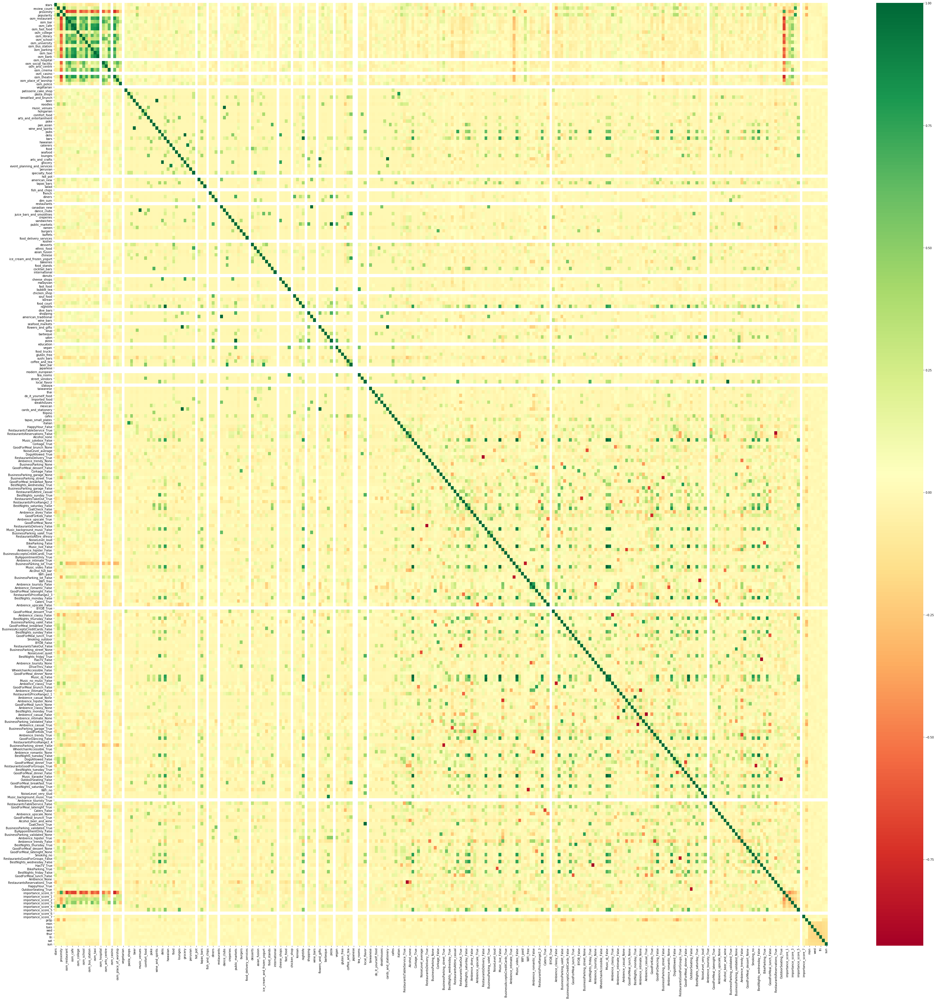

In [157]:
plt.figure(figsize = [60, 60])
sb.heatmap(model_df.corr(), cmap = 'RdYlGn');

There are 2 main observations that we can discover from the correlation heatmap above:

* It seems that our dataset is, for the most part, uncorrelated, with a few subsets of the data having moderate or high correlations due to their nature. The OpenStreetMaps-collected data is one such example of a correlated data subset, since it is reasonable that, if there is more of a type of amenity, there likely are more of multiple types of amenities, since restaurants, bars, cafes and other attractions tend to flock together. Also, some of the encoded business attributes seem to be correlated with each other, and that may be because they are subattribtes coming from the same parent attribute.

* There are some attributes for which the correlation matrix indicates vertical/horizontal __white lines__. This represents a __correlation of 0.00 for that variable with any other variable in the dataset, which is only possible if the variable in question is always having the same value for each row of the whole dataset.__ In that case, there is no variance at all for the variable, and, naturally, computing a correlation coefficient against any other variable will give its value as 0.0, since no other variables can influence its singular value. 

If a variable determines a white line within the correlation matrix, it means that it cannot explain any of the variance of the other variables, therefore it's a good idea to remove these variables from the final modeling data:

In [158]:
model_df = model_df.drop(columns = ['osm_hospital', 'osm_casino', 'donuts', 'fish_and_chips', 'izakaya', 'chicken_shop', 'restaurants', 'dive_bars', 'education', 'vegetarian', 'seafood_markets', 'kosher', 'hot_pot', 'modern_european', 'japanese', 'BYOB_True', 'Ambience_touristy_True', 'importance_score_6'])
client_df = client_df.drop(columns = ['osm_hospital', 'osm_casino', 'donuts', 'fish_and_chips', 'izakaya', 'chicken_shop', 'restaurants', 'dive_bars', 'education', 'vegetarian', 'seafood_markets', 'kosher', 'hot_pot', 'modern_european', 'japanese', 'BYOB_True', 'Ambience_touristy_True', 'importance_score_6'])

Here is the final model dataset:

In [159]:
model_df.head(2)

,stars,review_count,proximity,popularity,osm_restaurant,osm_bar,osm_cafe,osm_fast_food,osm_college,osm_library,...,importance_score_5,importance_score_7,prop,mon,tues,wed,thur,fri,sat,sun
0,4.0,51,1.798516,204.0,233,0,96,147,0,0,...,0,0,0.142857,1,0,0,0,0,0,0
7,3.0,275,21.090297,825.0,2,0,1,2,0,0,...,0,0,0.046154,1,0,0,0,0,0,0


And here is the dataset containing the client data, which will be used in the very last part of our analysis, after we have established which model is most relevant to answer our prediction question:

In [160]:
client_df

,stars,review_count,proximity,popularity,osm_restaurant,osm_bar,osm_cafe,osm_fast_food,osm_college,osm_library,...,importance_score_4,importance_score_5,importance_score_7,mon,tues,wed,thur,fri,sat,sun
521,4.0,1592,0.0,6368.0,292,18,170,265,0,7,...,0,0,0,1,0,0,0,0,0,0
1122,4.0,1592,0.0,6368.0,292,18,170,265,0,7,...,0,0,0,0,1,0,0,0,0,0
1723,4.0,1592,0.0,6368.0,292,18,170,265,0,7,...,0,0,0,0,0,1,0,0,0,0
2324,4.0,1592,0.0,6368.0,292,18,170,265,0,7,...,0,0,0,0,0,0,1,0,0,0
2925,4.0,1592,0.0,6368.0,292,18,170,265,0,7,...,0,0,0,0,0,0,0,1,0,0
3526,4.0,1592,0.0,6368.0,292,18,170,265,0,7,...,0,0,0,0,0,0,0,0,1,0
4127,4.0,1592,0.0,6368.0,292,18,170,265,0,7,...,0,0,0,0,0,0,0,0,0,1


Now, we will move on to preparing the model data for ingestion into the prediction algorithms.

<a id='C2.4.2.'></a>
### 4.2. Preparation of data for Model Ingestion

The first step for achieving regression predictions upon the variable _`prop`_ is to transform our dataset from a Pandas dataframe into matrixes of attributes `X` and `y`:

In [161]:
X = model_df.drop(columns = 'prop').to_numpy()
y = model_df['prop'].to_numpy().reshape((-1, 1))

X_client = client_df.to_numpy()

This is the only step needed to be done to have the model ready for ingestion. Later, we will make use of `sklearn`'s custom Regressors which automatically scale and inverse-scale the data at fitting, respectively at prediction times.

Here are the two error measures that we will use for computing the efficiency of the model. Since we are working with measurable __proportions, which take values between 0.00 and 1.00__, MAE (Mean Absolute Error) is a better loss function to interpret than the RMSE. However, we will keep both for consistency reasons.

In [162]:
def RMSE(y_pred, y_true):
    return np.sqrt(np.mean((y_pred - y_true)**2))

def MAE(y_pred, y_true):
    return np.mean(np.abs(y_pred - y_true))

Since some of our attributes have a widely different scale (e.g. `review_count`) than others (e.g. any categorical encoded variable), we draw the attention upon the problem of __feature scaling__. Scaling may be important for the correct updating of the weights in the stochastic gradient descent algorithm for Neural Networks, as well as for the coefficients/weights of the linear regression model.

For our dataset, we will use a Robust Scaler to scaler our data accordingly, since RobustScaler uses the IQR (interquartile range) of a variable, therefore working best in situations where we have skewed distributions which may contain outliers.

_It is extremely important to note the correct way of doing feature scaling: our augmented dataset is our training data, and our client data is our final testing data. Since we consider to only have the training data available to us for usage and modeling, __we will fit a feature scaler on the training data, and use the training scaler upon the testing set to scale the data__. This is very important, as we cannot include our test data in the training scaler, nor should we have a separate scaler for testing and another for training data, since they probably don't transform the data with exactly the same parameters._

For this transformation, we are using a `TransformedTargetRegressor()`, which takes in the regressor that we are fitting (_i.e. our regression model_) and a transformer (_i.e. the RobustScaler_) which scales the data before fitting, and inverse-transforms it after predicting. For our case scenario of proportion regression, returning back the linear model output in the original scale is essential, in order to easily interpret the predicted proportion data from the linear model.

The `random_state` variable is set within the CV fold splitting object, in order to create reproducibility in the context of our findings.

In [163]:
# Create a cross-validation fold object which will give CV folds
KFold_CV = KFold(n_splits = 10, shuffle = True, random_state = 42)

<a id='C2.4.3.'></a>
### 4.3. Prediction Model: _Dummy (Mean) Regression_ baseline model

In order to have a clear comparison of the actual improvement in performance of our linear/deep learning models compared to simple guessing, we will use the `DummyRegressor` model as our "worst" baseline. This regresson is set to compute the MAE for each data point by taking the mean of all the proportions in the dataset, and using that mean as its prediction, constantly.

The following setup uses __K-fold cross-validation__, with 10 folds, in order to compute a mean of RMSE and MAE errors for __two dummy models__: 

* one trained upon the scaled data (`tt_baseline_model`), and 
* one trained upon the non-scaled data (`baseline_model`), 

in order to see whether there is any real improvement for our specific dataset whether we scale the data or not.

The CV object `KFold_CV` has been previously set with a random state, so that we will achieve the same splits both for this test, as well as for the next models we will test.

In [164]:
# Create vectors to store the computed errors for each CV fold, both training and test errors
scaled_RMSE_train_values_baseline = []
scaled_MAE_train_values_baseline = []
scaled_RMSE_test_values_baseline = []
scaled_MAE_test_values_baseline = []

non_scaled_RMSE_train_values_baseline = []
non_scaled_MAE_train_values_baseline = []
non_scaled_RMSE_test_values_baseline = []
non_scaled_MAE_test_values_baseline = []

# From our full data matrix X, we create training and test data using cross-validation
for train_index, test_index in KFold_CV.split(X):
    
    # Create the training set from the CV training indexes
    X_train, y_train = X[train_index, :], y[train_index]
    
    # Create the test set from the CV test indexes
    X_test, y_test = X[test_index, :], y[test_index]
    
    # This is our baseline model which works automatically upon SCALED data
    tt_baseline_model = TransformedTargetRegressor(regressor   = DummyRegressor(strategy = 'mean'), 
                                                   transformer = RobustScaler())
    
    # This is the baseline model which fits on NON-SCALED data
    baseline_model = DummyRegressor(strategy = 'mean')
    
    # We train both our models on the non-scaled data, and the TransformedTargetRegressor will automatically use its transformer to scale the data
    tt_baseline_model.fit(X_train, y_train)
    baseline_model.fit(X_train, y_train)
    
    non_scaled_RMSE_train_values_baseline.append(RMSE(baseline_model.predict(X_train), y_train))
    non_scaled_MAE_train_values_baseline.append(MAE(baseline_model.predict(X_train), y_train))
    #--------------------------------------------------------------------------------------------#
    non_scaled_RMSE_test_values_baseline.append(RMSE(baseline_model.predict(X_test), y_test))
    non_scaled_MAE_test_values_baseline.append(MAE(baseline_model.predict(X_test), y_test))
    
    scaled_RMSE_train_values_baseline.append(RMSE(tt_baseline_model.predict(X_train), y_train))
    scaled_MAE_train_values_baseline.append(MAE(tt_baseline_model.predict(X_train), y_train))
    #-------------------------------------------------------------------------------------------#
    scaled_RMSE_test_values_baseline.append(RMSE(tt_baseline_model.predict(X_test), y_test))
    scaled_MAE_test_values_baseline.append(MAE(tt_baseline_model.predict(X_test), y_test))

    
print('TRAIN SET RMSE:')
print('(Mean: Train RMSE - NON-SCALED data) for baseline regressor upon the japanese business dataset: ', str(np.mean(non_scaled_RMSE_train_values_baseline)))
print('(Std:  Train RMSE - NON-SCALED data) for baseline regressor upon the japanese business dataset: ', str(np.std(non_scaled_RMSE_train_values_baseline)))
print('(Mean: Train RMSE - SCALED data) for baseline regressor upon the japanese business dataset:     ', str(np.mean(scaled_RMSE_train_values_baseline)))
print('(Std:  Train RMSE - SCALED data) for baseline regressor upon the japanese business dataset:     ', str(np.std(scaled_RMSE_train_values_baseline)))
print()
print('TEST SET RMSE:')
print('(Mean: Test RMSE - NON-SCALED data) for baseline regressor upon the japanese business dataset:  ', str(np.mean(non_scaled_RMSE_test_values_baseline)))
print('(Std:  Test RMSE - NON-SCALED data) for baseline regressor upon the japanese business dataset:  ', str(np.std(non_scaled_RMSE_test_values_baseline)))
print('(Mean: Test RMSE - SCALED data) for baseline regressor upon the japanese business dataset:      ', str(np.mean(scaled_RMSE_test_values_baseline)))
print('(Std:  Test RMSE - SCALED data) for baseline regressor upon the japanese business dataset:      ', str(np.std(scaled_RMSE_test_values_baseline)))
print('----------------------------------------------------------------------------------------------------------------------')
print('TRAIN SET MAE:')
print('(Mean: Train MAE - NON-SCALED data) for baseline regressor upon the japanese business dataset:  ', str(np.mean(non_scaled_MAE_train_values_baseline)))
print('(Std:  Train MAE - NON-SCALED data) for baseline regressor upon the japanese business dataset:  ', str(np.std(non_scaled_MAE_train_values_baseline)))
print('(Mean: Train MAE - SCALED data) for baseline regressor upon the japanese business dataset:      ', str(np.mean(scaled_MAE_train_values_baseline)))
print('(Std:  Train MAE - SCALED data) for baseline regressor upon the japanese business dataset:      ', str(np.std(scaled_MAE_train_values_baseline)))
print()
print('TEST SET MAE:')
print('(Mean: Test MAE - NON-SCALED data) for baseline regressor upon the japanese business dataset:   ', str(np.mean(non_scaled_MAE_test_values_baseline)))
print('(Std:  Test MAE - NON-SCALED data) for baseline regressor upon the japanese business dataset:   ', str(np.std(non_scaled_MAE_test_values_baseline)))
print('(Mean: Test MAE - SCALED data) for baseline regressor upon the japanese business dataset:       ', str(np.mean(scaled_MAE_test_values_baseline)))
print('(Std:  Test MAE - SCALED data) for baseline regressor upon the japanese business dataset:       ', str(np.std(scaled_MAE_test_values_baseline)))

TRAIN SET RMSE:
(Mean: Train RMSE - NON-SCALED data) for baseline regressor upon the japanese business dataset:  0.177920133682552
(Std:  Train RMSE - NON-SCALED data) for baseline regressor upon the japanese business dataset:  0.0024684654489831996
(Mean: Train RMSE - SCALED data) for baseline regressor upon the japanese business dataset:      0.177920133682552
(Std:  Train RMSE - SCALED data) for baseline regressor upon the japanese business dataset:      0.0024684654489832035

TEST SET RMSE:
(Mean: Test RMSE - NON-SCALED data) for baseline regressor upon the japanese business dataset:   0.17633203844197445
(Std:  Test RMSE - NON-SCALED data) for baseline regressor upon the japanese business dataset:   0.02405033419889897
(Mean: Test RMSE - SCALED data) for baseline regressor upon the japanese business dataset:       0.17633203844197443
(Std:  Test RMSE - SCALED data) for baseline regressor upon the japanese business dataset:       0.024050334198898963
-------------------------------

---
The results from the baseline regressor seem stable across both scaled & non-scaled scenarios. 

__For this worst-case baseline scenario, our test set MAE average error (upon scaled data, of course) has been found to be $\mu = $ 0.113 (_11.3%_), with a standard deviation $\sigma = $ 0.009 (_0.9%_).__

Using the margin of error of $(X -\mu -3\sigma, X +\mu +3\sigma)$, this means that, _if we blindly predict only based on the mean proportion of other Japanese restaurants_, when using this model's estimate for predicting the average proportion of customers $P$ (in %) (coming between 16:00 and 17:00), __our client's true proportion value will be, with 99.7% confidence, inside the interval $(P - 14\%, P + 14\%)$__, where $P$ is the predicted estimate given by this model.

This assumes that the data about the client comes from the same distribution as the data which we trained our Dummy Regressor upon, which is the data for all other Japanese restaurants in Toronto.

_The same considerations for calculating the true value of the proportion will apply equivalently for the linear regression and the neural network estimates._

---

<a id='C2.4.4.'></a>
### 4.4. Prediction Model: _Linear Regression_ model

In the following scenario, we will take a step up from our dummy regressor and try to __use a Linear Regression model__ fitted upon the same data folds as previously.

The following setup uses __K-fold cross-validation__, with 10 folds, in order to compute a mean of RMSE and MAE errors for __two linear models__: 

* one which performs regression on the scaled data (`tt_lr_model`), and 
* one which computes on non-scaled data (`lr_model`), 

in order to see whether there is any real improvement for our specific dataset whether we scale the data or not.

The same CV object, `KFold_CV`, is used as for the previous baseline model, in order to maintain accuracy of our error comparisons.

In [165]:
# Create vectors to store the computed errors for each CV fold, both training and test errors
scaled_RMSE_train_values_LR = []
scaled_MAE_train_values_LR = []
scaled_RMSE_test_values_LR = []
scaled_MAE_test_values_LR = []

non_scaled_RMSE_train_values_LR = []
non_scaled_MAE_train_values_LR = []
non_scaled_RMSE_test_values_LR = []
non_scaled_MAE_test_values_LR = []

# From our full data matrix X, we create training and test data using cross-validation
for train_index, test_index in KFold_CV.split(X):
    
    # Create the training set from the CV training indexes
    X_train, y_train = X[train_index, :], y[train_index]
    
    # Create the test set from the CV test indexes
    X_test, y_test = X[test_index, :], y[test_index]
    
    # This is our linear model which works automatically upon SCALED data
    tt_lr_model = TransformedTargetRegressor(regressor   = LinearRegression(fit_intercept = True, n_jobs = -1), 
                                             transformer = RobustScaler())
    
    # This is the linear regression model which fits on NON-SCALED data
    lr_model = LinearRegression(fit_intercept = True, n_jobs = -1)
    
    # We train both our models on the non-scaled data, and the TransformedTargetRegressor will automatically use its transformer to scale the data
    tt_lr_model.fit(X_train, y_train)
    lr_model.fit(X_train, y_train)
    
    non_scaled_RMSE_train_values_LR.append(RMSE(lr_model.predict(X_train), y_train))
    non_scaled_MAE_train_values_LR.append(MAE(lr_model.predict(X_train), y_train))
    #---------------------------------------------------------------------------#
    non_scaled_RMSE_test_values_LR.append(RMSE(lr_model.predict(X_test), y_test))
    non_scaled_MAE_test_values_LR.append(MAE(lr_model.predict(X_test), y_test))
    
    scaled_RMSE_train_values_LR.append(RMSE(tt_lr_model.predict(X_train), y_train))
    scaled_MAE_train_values_LR.append(MAE(tt_lr_model.predict(X_train), y_train))
    #--------------------------------------------------------------------------#
    scaled_RMSE_test_values_LR.append(RMSE(tt_lr_model.predict(X_test), y_test))
    scaled_MAE_test_values_LR.append(MAE(tt_lr_model.predict(X_test), y_test))

    
print('TRAIN SET RMSE:')
print('(Mean: Train RMSE - NON-SCALED data) for linear regression upon the japanese business dataset: ', str(np.mean(non_scaled_RMSE_train_values_LR)))
print('(Std:  Train RMSE - NON-SCALED data) for linear regression upon the japanese business dataset: ', str(np.std(non_scaled_RMSE_train_values_LR)))
print('(Mean: Train RMSE - SCALED data) for linear regression upon the japanese business dataset:     ', str(np.mean(scaled_RMSE_train_values_LR)))
print('(Std:  Train RMSE - SCALED data) for linear regression upon the japanese business dataset:     ', str(np.std(scaled_RMSE_train_values_LR)))
print()
print('TEST SET RMSE:')
print('(Mean: Test RMSE - NON-SCALED data) for linear regression upon the japanese business dataset:  ', str(np.mean(non_scaled_RMSE_test_values_LR)))
print('(Std:  Test RMSE - NON-SCALED data) for linear regression upon the japanese business dataset:  ', str(np.std(non_scaled_RMSE_test_values_LR)))
print('(Mean: Test RMSE - SCALED data) for linear regression upon the japanese business dataset:      ', str(np.mean(scaled_RMSE_test_values_LR)))
print('(Std:  Test RMSE - SCALED data) for linear regression upon the japanese business dataset:      ', str(np.std(scaled_RMSE_test_values_LR)))
print('----------------------------------------------------------------------------------------------------------------------')
print('TRAIN SET MAE:')
print('(Mean: Train MAE - NON-SCALED data) for linear regression upon the japanese business dataset:  ', str(np.mean(non_scaled_MAE_train_values_LR)))
print('(Std:  Train MAE - NON-SCALED data) for linear regression upon the japanese business dataset:  ', str(np.std(non_scaled_MAE_train_values_LR)))
print('(Mean: Train MAE - SCALED data) for linear regression upon the japanese business dataset:      ', str(np.mean(scaled_MAE_train_values_LR)))
print('(Std:  Train MAE - SCALED data) for linear regression upon the japanese business dataset:      ', str(np.std(scaled_MAE_train_values_LR)))
print()
print('TEST SET MAE:')
print('(Mean: Test MAE - NON-SCALED data) for linear regression upon the japanese business dataset:   ', str(np.mean(non_scaled_MAE_test_values_LR)))
print('(Std:  Test MAE - NON-SCALED data) for linear regression upon the japanese business dataset:   ', str(np.std(non_scaled_MAE_test_values_LR)))
print('(Mean: Test MAE - SCALED data) for linear regression upon the japanese business dataset:       ', str(np.mean(scaled_MAE_test_values_LR)))
print('(Std:  Test MAE - SCALED data) for linear regression upon the japanese business dataset:       ', str(np.std(scaled_MAE_test_values_LR)))

TRAIN SET RMSE:
(Mean: Train RMSE - NON-SCALED data) for linear regression upon the japanese business dataset:  0.11861660574975486
(Std:  Train RMSE - NON-SCALED data) for linear regression upon the japanese business dataset:  0.0013426029004006725
(Mean: Train RMSE - SCALED data) for linear regression upon the japanese business dataset:      0.11861660574975486
(Std:  Train RMSE - SCALED data) for linear regression upon the japanese business dataset:      0.0013426029004006733

TEST SET RMSE:
(Mean: Test RMSE - NON-SCALED data) for linear regression upon the japanese business dataset:   0.14356933116309992
(Std:  Test RMSE - NON-SCALED data) for linear regression upon the japanese business dataset:   0.008711245303801615
(Mean: Test RMSE - SCALED data) for linear regression upon the japanese business dataset:       0.14356933116309978
(Std:  Test RMSE - SCALED data) for linear regression upon the japanese business dataset:       0.008711245303801537
----------------------------------

---

The results from the linear model prediction seem to be reliable, because, __in both scaled & non-scaled scenarios, across 10 CV folds, the training error and testing error are very close to each other. This indicates that the model is not doing large amounts of overfitting__.

Moreover, if we look at the testing set difference in errors between scaled and non-scaled data, both RMSE and MAE coincide perfectly until the 15th decimal! <br> This shows that, using a linear model for our data, the model does not seem to take into account the features with large scale differences compared to our categorical variables (having values between 0 and 1).

__Lastly, it is important to understand that our test set MAE average error of $\mu = $ 0.093 (_9.3%_), with a standard deviation $\sigma = $ 0.003 (_0.3%_) means that, when using this model's estimate $P$ to predict for our client the average proportion of customers that would come between 16:00 and 17:00, the true (actual) value of the proportion will lie within the interval $(P - 10.2\%, P + 10.2\%)$ with 99.7% confidence.__ 

This error marging would surely decrease, given more data to be fed into the model, since reaching a low MAE from only 4000 entries (_i.e. our number of data rows fed into the model_) is an expected challenge.

---

<a id='C2.4.5.'></a>
### 4.5. Prediction Model: _Neural Network_ model

Lastly, we want to try to use the power of __Neural Networks__, which are ___universal approximators___, in order to detect whether this problem can be better approximated by a set of non-linear transformations rather than using simple linear regression.

For this challenge, we will use Keras to perform the NN modeling steps, since Keras is a powerful and functional front-end to Tensorflow, which also has the possibility of being integrated with `sklearn` through defining our own model creation function. Having the ability to pipe a Neural Network model into sklearn direcly will come in handy when scaling our data using the same technique as before (i.e. through a `TransformedTargetRegressor` having a `RobustScaler` as transformer).

The __neural network architecture__ can be seen below:
* an ___input layer___ of 256 neurons, corresponding to the number of initial features present in our dataset;
* ___one or more hidden layers___ (configurable, default: 1), each with an equal number of ___hidden nodes___ (configurable, default: 1) and using the `ReLU` activation function;
* a ___dropout percentage___ is used at each hidden layer, which helps minimize overfitting by randomly deactivating a certain number of neurons from the hidden layer;
* an ___output layer___ with 1 linear output neuron (appropriate, because this is a regression problem);

The loss function that we choose to minimize at each epoch is the __MAE__, since it is our primary error comparison function and is slighly better suited for proportion comparison than RMSE because it does not exaggerate outlier prediction errors by squaring them.

In [166]:
# Here is the function that creates a Neural Network model using the parameters given to the function
def create_model(num_layers = 1, num_hidden_nodes = 1, dropout_perc = 0.0):
    model = Sequential()
    
    model.add(Dense(units = num_hidden_nodes, input_dim = 256, activation = 'relu'))
    model.add(Dropout(rate = dropout_perc))
    
    for i in range(1, num_layers):
        model.add(Dense(units = num_hidden_nodes, activation = 'relu'))
        model.add(Dropout(rate = dropout_perc))
        
    model.add(Dense(units = 1, activation = 'linear'))

    model.compile(loss = 'mae', optimizer = 'adam', metrics = ['mae'])
    return model

Below, we will use the model creation function defined above, in order to fit a regression Neural Network upon the same data folds as used for the previous two models.

The setup uses, once again, K-fold cross-validation, with 10 folds and the same CV object, `KFold_CV`, in order to compute a mean of RMSE and MAE errors for __two regression Deep Learning models__: 

* one which performs regression on the scaled data (`tt_nn_model`), and 
* one which computes on non-scaled data (`nn_model`), 

as previously done for the other two models.

__There are five main parameters that can be tuned for our Neural Networks:__ the number of hidden layers (`num_layers`), the number of hidden nodes used for each hidden layer of the network (`num_hidden_nodes`), the dropout percentage for regularization (`dropout_perc`), the batch size of data to be used at each iteration (`batch_size`) and the number of full iterations upon the training data, also known as epochs (`epochs`). 

The __parameter space__ tested for our problem (outside of this notebook) has been:
* ___num_layers___: &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<u>[1, 2, 3, 4, __5__]</u>
* ___num_hidden_nodes___: &nbsp;<u>[1, 5, 10, 50, __75__, 100]</u>
* ___dropout_perc___: &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<u>[0.00, __0.25__, 0.40]</u>
* ___batch_size___: &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<u>[512, __1024__]</u>
* ___epochs___: &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<u>[250, 500, __750__]</u>

In order to find an optimal set of parameters for our network, outside of this notebook, we have created a separate temporary analysis script that has used `GridSearchCV` with an __inner 2-fold Cross-Validation set__ to compute the best set of parameters, which gives the minimum MAE loss out of all the combinations tried. __The script had a runtime of more than _48_ hours to iterate over a set of $5 \cdot 6 \cdot 3 \cdot 2 \cdot 3 = 540$ parameter combinations.__

The bolded parameters above construct __the optimal parameter space for our model, tested using the inner 2-CV layer.__

_Because this notebook is meant to be an easily-runnable one, which can be executed from top to bottom with reasonable runtime, we have not included the script in this final analysis notebook, instead opting for directly saving the best parameters below into variables which will create our best-estimator model directly._

In [167]:
# Create vectors to store the computed errors for each CV fold, both training and test errors
scaled_RMSE_train_values_NN = []
scaled_MAE_train_values_NN = []
scaled_RMSE_test_values_NN = []
scaled_MAE_test_values_NN = []

non_scaled_RMSE_train_values_NN = []
non_scaled_MAE_train_values_NN = []
non_scaled_RMSE_test_values_NN = []
non_scaled_MAE_test_values_NN = []

# We have separately performed GridSearchCV tests beforehand (with 2-fold CV for internal model selection),
# and have discovered the best parameters for our NN model

# Here, in this code, we have removed the GridSearchCV from this version of the notebook easily-runnable from start to finish, 
# due to the fact that one KFold_CV iteration for testing a full set of grid parameters took between 2-10 minutes, 
# making the GridSearchCV take a total of more than 48 hours for a full search

num_layers       = 5
num_hidden_nodes = 75
dropout_perc     = 0.25
batch_size       = 1024
epochs           = 750

# From our full data matrix X, we create training and test data using cross-validation
# We use the SAME KFold CV splitter as before, in order to have directly-comparable results
for train_index, test_index in KFold_CV.split(X):
    
    # Create the training set from the CV training indexes
    X_train, y_train = X[train_index, :], y[train_index]
    
    # Create the test set from the CV test indexes
    X_test, y_test = X[test_index, :], y[test_index]

    # Some hosts will run Keras on GPU, therefore, for compatibility reasons, let us run the Keras training on the host CPU instead
    with tf.device('/cpu:0'):

        # This is our neural network model which works automatically upon SCALED data, piped into a TransformedTargetRegressor which scales the data appropriately
        tt_nn_model = TransformedTargetRegressor(regressor = KerasRegressor(build_fn = create_model, 
                                                                            verbose = 0, 
                                                                            num_layers = num_layers, 
                                                                            num_hidden_nodes = num_hidden_nodes, 
                                                                            dropout_perc = dropout_perc, 
                                                                            epochs = epochs, 
                                                                            batch_size = batch_size), 
                                                 transformer = RobustScaler())
        tt_nn_model.fit(X_train, y_train)
        
        
        # This is our neural network model which works upon the NON-SCALED data
        nn_model = create_model(num_layers = num_layers, num_hidden_nodes = num_hidden_nodes, dropout_perc = dropout_perc)
        nn_model.fit(X_train, y_train, epochs = epochs, batch_size = batch_size, verbose = 0)
        
        
        non_scaled_RMSE_train_values_NN.append(RMSE(nn_model.predict(X_train), y_train))
        non_scaled_MAE_train_values_NN.append(MAE(nn_model.predict(X_train), y_train))
        #-------------------------------------------------------------------------------#
        non_scaled_RMSE_test_values_NN.append(RMSE(nn_model.predict(X_test), y_test))
        non_scaled_MAE_test_values_NN.append(MAE(nn_model.predict(X_test), y_test))
        
        scaled_RMSE_train_values_NN.append(RMSE(tt_nn_model.predict(X_train), y_train))
        scaled_MAE_train_values_NN.append(MAE(tt_nn_model.predict(X_train), y_train))
        #------------------------------------------------------------------------------#
        scaled_RMSE_test_values_NN.append(RMSE(tt_nn_model.predict(X_test), y_test))
        scaled_MAE_test_values_NN.append(MAE(tt_nn_model.predict(X_test), y_test))
        
        
print('TRAIN SET RMSE:')
print('(Mean: Train RMSE - NON-SCALED data) for Neural Network Regression upon the japanese business dataset: ', str(np.mean(non_scaled_RMSE_train_values_NN)))
print('(Std:  Train RMSE - NON-SCALED data) for Neural Network Regression upon the japanese business dataset: ', str(np.std(non_scaled_RMSE_train_values_NN)))
print('(Mean: Train RMSE - SCALED data) for Neural Network Regression upon the japanese business dataset:     ', str(np.mean(scaled_RMSE_train_values_NN)))
print('(Std:  Train RMSE - SCALED data) for Neural Network Regression upon the japanese business dataset:     ', str(np.std(scaled_RMSE_train_values_NN)))
print()
print('TEST SET RMSE:')
print('(Mean: Test RMSE - NON-SCALED data) for Neural Network Regression upon the japanese business dataset:  ', str(np.mean(non_scaled_RMSE_test_values_NN)))
print('(Std:  Test RMSE - NON-SCALED data) for Neural Network Regression upon the japanese business dataset:  ', str(np.std(non_scaled_RMSE_test_values_NN)))
print('(Mean: Test RMSE - SCALED data) for  Neural Network Regression upon the japanese business dataset:     ', str(np.mean(scaled_RMSE_test_values_NN)))
print('(Std:  Test RMSE - SCALED data) for  Neural Network Regression upon the japanese business dataset:     ', str(np.std(scaled_RMSE_test_values_NN)))
print('----------------------------------------------------------------------------------------------------------------------------')
print('TRAIN SET MAE:')
print('(Mean: Train MAE - NON-SCALED data) for Neural Network Regression upon the japanese business dataset:  ', str(np.mean(non_scaled_MAE_train_values_NN)))
print('(Std:  Train MAE - NON-SCALED data) for Neural Network Regression upon the japanese business dataset:  ', str(np.std(non_scaled_MAE_train_values_NN)))
print('(Mean: Train MAE - SCALED data) for Neural Network Regression upon the japanese business dataset:      ', str(np.mean(scaled_MAE_train_values_NN)))
print('(Std:  Train MAE - SCALED data) for Neural Network Regression upon the japanese business dataset:      ', str(np.std(scaled_MAE_train_values_NN)))
print()
print('TEST SET MAE:')
print('(Mean: Test MAE - NON-SCALED data) for Neural Network Regression upon the japanese business dataset:   ', str(np.mean(non_scaled_MAE_test_values_NN)))
print('(Std:  Test MAE - NON-SCALED data) for Neural Network Regression upon the japanese business dataset:   ', str(np.std(non_scaled_MAE_test_values_NN)))
print('(Mean: Test MAE - SCALED data) for Neural Network Regression upon the japanese business dataset:       ', str(np.mean(scaled_MAE_test_values_NN)))
print('(Std:  Test MAE - SCALED data) for Neural Network Regression upon the japanese business dataset:       ', str(np.std(scaled_MAE_test_values_NN)))

TRAIN SET RMSE:
(Mean: Train RMSE - NON-SCALED data) for Neural Network Regression upon the japanese business dataset:  0.13721284698065564
(Std:  Train RMSE - NON-SCALED data) for Neural Network Regression upon the japanese business dataset:  0.007960552187364257
(Mean: Train RMSE - SCALED data) for Neural Network Regression upon the japanese business dataset:      0.11881899409056132
(Std:  Train RMSE - SCALED data) for Neural Network Regression upon the japanese business dataset:      0.008601983463527566

TEST SET RMSE:
(Mean: Test RMSE - NON-SCALED data) for Neural Network Regression upon the japanese business dataset:   0.14440490389697672
(Std:  Test RMSE - NON-SCALED data) for Neural Network Regression upon the japanese business dataset:   0.01945700666692172
(Mean: Test RMSE - SCALED data) for  Neural Network Regression upon the japanese business dataset:      0.13726168432112437
(Std:  Test RMSE - SCALED data) for  Neural Network Regression upon the japanese business dataset:

---

The error function results, once again, have minimal error difference between training and test sets.

__Our test set mean MAE error of $\mu = $ 0.080 (_8.0%_), with a standard deviation $\sigma = $ 0.006 (_0.6%_) means that, when using the neural network's proportion estimate $P$ for prediction, the true value of the proportion will lie within the interval $(P - 9.8\%, P + 9.8\%)$ with 99.7% confidence.__

Once again, the error differences between scaled and non-scaled models are arguably non-existent. We argue that, anyway, the best practice is to always standardize your dataset before feeding the data into a neural network model, and our particular dataset seemed to be balanced in terms of the scaling of different attributes. This is a nonstandard-case situation and one should be aware of it.

Neural Networks are particularly sensitive to the amount of data fed into the model, since more data allows them to fine-tune and find better non-linear patterns across its hidden layers. They are also extremely sensitive to overfitting when given small amounts of data. Therefore, it can be that, with more data, our neural network will decrease the maximum margin of error even further.

__With this result seen above, it appears that the neural network model has been most effective at minimizing the Mean Absolute Error loss function, out of the three models tested.__ 

_However, is the difference between their means significant enough to be able to generalize, or is it perhaps due to randomness in the whole process? To find out the answer, we will perform statistical analysis using credibility intervals upon the error results of all three models in the next section._

---

<a id='C2.4.6.'></a>
### 4.6. Model performance comparison using credibility intervals

Now that we have created, trained and tested our three prediction models upon 10 cross-validated subsets of the data, we have stored the MAE loss errors at each cross-validation fold, for each of the models.

Previously, we have discussed the mean and standard deviation of the errors that each model is achieving, however an important question that we need to ask is: __how can we reliably demonstrate that one model's average MAE error is significanly lower than another's__, so as to consider one model better than another at minimizing predictive errors?

We will solve this through using ___statistical analysis upon the credibility intervals___ of the model errors.

---

___Short Mathematical Explanation behind the method:___

Suppose we are given two models: A and B. We can estimate the generalization error of both of these models using K-fold cross-validation (which we have already done), and then compute the
difference between estimated error means: 

$$\hat{E}^{MAE}_{B} - \hat{E}^{MAE}_{A} = \hat{z}$$

We will use the cumulative distribution function $cdf(\theta)$ for representing the estimated probablity of the true error ($\theta$) within a specific interval $[\theta_{lower}, \theta_{upper}]$. <br>From explicitating the formula for $cdf(\theta_{lower})$ and $cdf(\theta_{upper})$, we will arrive at the result: 

$$cdf(\theta_{lower}) = \frac{\alpha}{2}; cdf(\theta_{upper}) = 1 - \frac{\alpha}{2}$$

For a credibility interval with $\alpha = 0.05$, we can easily find $\theta_{lower}$ and $\theta_{upper}$, __which are the boundaries of the interval within which the true difference between the error means of the two models is situated.__

---

In short, we will compute the boundaries of the credibility interval. Afterwards:
* If the boundaries are both strictly positive or strictly negative (i.e. __the interval does not pass through/contain the value 0__ inside itself), this will mean that, for our set confidence rating of 95%, __the models' mean error prediction are strictly different from each other__, with one model performing better than other, and this result is generalizable across any number of re-trainings. 

* __If the credibility interval does contain 0, then it means that we cannot be sure whether the true difference in mean errors will generalize__, and therefore the models are not certain to be significantly better than each other.

In the following code paragraph, we will compute these credibility intervals, print out their boundaries and the conclusion upon model significance, as well as create a boxplot for each model's error functions, and compared the models' boxplot ranges two-by-two.

___As an intuitive rule of thumb, if, for any two-by-two boxplot comparison, the models' boxplot whiskers overlap, then the credibility interval contains 0 and the models' MAE error difference is not statistically significant.___



Credibility interval has z-scores: (-0.02, -0.01)
The regression ANN model and linear regression model ARE significantly different.


Credibility interval has z-scores: (-0.04, -0.03)
The regression ANN model and the baseline dummy regressor ARE significantly different.


Credibility interval has z-scores: (-0.03, -0.02)
The linear regression model and the baseline dummy regressor ARE significantly different.




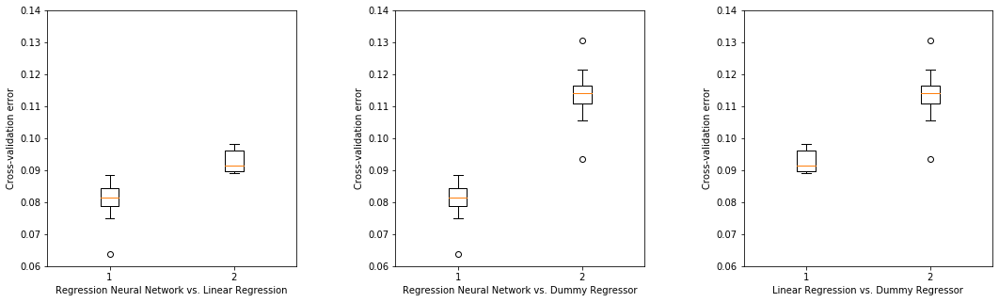

In [192]:
plt.figure(figsize = [18, 5])
plt.subplots_adjust(wspace = 0.4)

scaled_MAE_test_values_NN = np.array(scaled_MAE_test_values_NN)
scaled_MAE_test_values_LR = np.array(scaled_MAE_test_values_LR)
scaled_MAE_test_values_baseline = np.array(scaled_MAE_test_values_baseline)

z = (scaled_MAE_test_values_NN - scaled_MAE_test_values_LR)
z_mean = z.mean()
deg_f = KFold_CV.n_splits-1
sig = (z - z_mean).std() / np.sqrt(deg_f)
alpha = 0.05

zL = z_mean + sig * stats.t.ppf(alpha/2, deg_f);
zH = z_mean + sig * stats.t.ppf(1-alpha/2, deg_f);

plt.subplot(1, 3, 1)
plt.boxplot(np.concatenate((scaled_MAE_test_values_NN.reshape((len(scaled_MAE_test_values_NN), 1)), scaled_MAE_test_values_LR.reshape((len(scaled_MAE_test_values_LR), 1))), axis = 1))
plt.xlabel('Regression Neural Network vs. Linear Regression')
plt.ylabel('Cross-validation error')
plt.ylim(0.06, 0.14)

print()
print()

print('Credibility interval has z-scores: ({0}, {1})'.format(np.round(zL, decimals = 2), np.round(zH, decimals = 2)))
if zL <= 0 and zH >= 0 :
    print('The regression ANN model and linear regression model are NOT significantly different')        
else:
    print('The regression ANN model and linear regression model ARE significantly different.')
print()
print()


z = (scaled_MAE_test_values_NN - scaled_MAE_test_values_baseline)
z_mean = z.mean()
deg_f = KFold_CV.n_splits-1
sig =  (z - z_mean).std() / np.sqrt(deg_f)
alpha = 0.05

zL = z_mean + sig * stats.t.ppf(alpha/2, deg_f);
zH = z_mean + sig * stats.t.ppf(1-alpha/2, deg_f);

plt.subplot(1, 3, 2)
plt.boxplot(np.concatenate((scaled_MAE_test_values_NN.reshape((len(scaled_MAE_test_values_NN), 1)), scaled_MAE_test_values_baseline.reshape((len(scaled_MAE_test_values_baseline), 1))), axis = 1))
plt.xlabel('Regression Neural Network vs. Dummy Regressor')
plt.ylabel('Cross-validation error')
plt.ylim(0.06, 0.14)

print('Credibility interval has z-scores: ({0}, {1})'.format(np.round(zL, decimals = 2), np.round(zH, decimals = 2)))
if zL <= 0 and zH >= 0 :
    print('The regression ANN model and the baseline dummy regressor are NOT significantly different')        
else:
    print('The regression ANN model and the baseline dummy regressor ARE significantly different.')
print()
print()


z = (scaled_MAE_test_values_LR - scaled_MAE_test_values_baseline)
z_mean = z.mean()
deg_f = KFold_CV.n_splits-1
sig =  (z - z_mean).std() / np.sqrt(deg_f)
alpha = 0.05

zL = z_mean + sig * stats.t.ppf(alpha/2, deg_f);
zH = z_mean + sig * stats.t.ppf(1-alpha/2, deg_f);

plt.subplot(1, 3, 3)
plt.boxplot(np.concatenate((scaled_MAE_test_values_LR.reshape((len(scaled_MAE_test_values_LR), 1)), scaled_MAE_test_values_baseline.reshape((len(scaled_MAE_test_values_baseline), 1))), axis = 1))
plt.xlabel('Linear Regression vs. Dummy Regressor')
plt.ylabel('Cross-validation error')
plt.ylim(0.06, 0.14)

print('Credibility interval has z-scores: ({0}, {1})'.format(np.round(zL, decimals = 2), np.round(zH, decimals = 2)))
if zL <= 0 and zH >= 0 :
    print('The linear regression model and the baseline dummy regressor are NOT significantly different')        
else:
    print('The linear regression model and the baseline dummy regressor ARE significantly different.')
print()
print()

Looking at the results of this section, we can see each model's error ranges in the boxplots above. 

__Even though they are very close from overlapping, the Neural Network's errors were consistently smaller than for the linear regression model, and the credibility interval result shows that this difference is indeed significant, although by a very small margin.__ Moreover, the difference is even more significant between the Neural Network and the dummy regressor. 

__Statistically, all models are performing significantly different from each other, with Neural Network achieving lowest MAE scores, afterwards the linear regression, and finally the baseline dummy regressor.__

<a id='C2.4.7.'></a>
### 4.7. Predicting upon the business client data

Now that we have created, fitted and compared our three prediction models, we have a clear idea of their ranges and limitations.

It is now time to use all these insights in order to determine the answer to our starting question: <br> ___If the client were to increase their opening hours by opening one hour earlier, what is the percentage of customers that would come during that time interval, per each week day?___

As it has been seen, we have never used the business client data before, neither in training nor in testing our models. At the same time, we do not have an actual answer to compare the predictions against, therefore we must rely on the margin-of-error intervals computed for each model, in order to find the error boundaries that we can expect from our prediction.

__Starting with the baseline dummy regressor, its predictions upon the client data are:__

In [169]:
day_range = ['Mondays    ', 
             'Tuesdays   ', 
             'Wednesdays ', 
             'Thursdays  ', 
             'Fridays    ', 
             'Saturdays  ', 
             'Sundays    ']

In [170]:
# This is our DummyRegressor model:
tt_baseline_model.fit(X, y)

TransformedTargetRegressor(check_inverse=True, func=None, inverse_func=None,
                           regressor=DummyRegressor(constant=None,
                                                    quantile=None,
                                                    strategy='mean'),
                           transformer=RobustScaler(copy=True,
                                                    quantile_range=(25.0, 75.0),
                                                    with_centering=True,
                                                    with_scaling=True))

In [171]:
prediction_array = tt_baseline_model.predict(X_client)

print('According to the Dummy Regressor model, ')
print('The proportion of customers that would come between 16:00-17:00 on each weekday is:')
print()
for i in range(0, 7):
    print('On %s: %.2f%%' % (day_range[i], prediction_array[i] * 100))

According to the Dummy Regressor model, 
The proportion of customers that would come between 16:00-17:00 on each weekday is:

On Mondays    : 17.06%
On Tuesdays   : 17.06%
On Wednesdays : 17.06%
On Thursdays  : 17.06%
On Fridays    : 17.06%
On Saturdays  : 17.06%
On Sundays    : 17.06%


These predictions are the same, regardless of the day of the week, as expected. The dummy regressor has used the mean of all the proportions in our `X` restaurant dataset to give out this prediction, which means that our average number of customers coming during those hours, across all week days, is _17.06%_.

Looking back at the dummy baseline model's margin of error for estimated values, which is $(P - 14\%, P + 14\%)$, we can thus say with extremely high confidence (_considering that our data would be enough to make such a statement_) that __our business client's number of customers within the specified hours will be between $3.06\%$ and $31.06\%$ of the total number of customers coming on a weekday__.

Continuing on, __the linear regression's predictions are:__

In [172]:
tt_lr_model.fit(X, y)

TransformedTargetRegressor(check_inverse=True, func=None, inverse_func=None,
                           regressor=LinearRegression(copy_X=True,
                                                      fit_intercept=True,
                                                      n_jobs=-1,
                                                      normalize=False),
                           transformer=RobustScaler(copy=True,
                                                    quantile_range=(25.0, 75.0),
                                                    with_centering=True,
                                                    with_scaling=True))

In [173]:
prediction_array = tt_lr_model.predict(X_client)

print('According to the Linear Regression model, ')
print('The proportion of customers that would come between 16:00-17:00 on each weekday is:')
print()
for i in range(0, 7):
    print('On %s: %.2f%%' % (day_range[i], prediction_array[i] * 100))

According to the Linear Regression model, 
The proportion of customers that would come between 16:00-17:00 on each weekday is:

On Mondays    : 18.31%
On Tuesdays   : 16.64%
On Wednesdays : 16.92%
On Thursdays  : 16.36%
On Fridays    : 16.39%
On Saturdays  : 12.35%
On Sundays    : 13.38%


__The linear regression model seems to make predictions that take into account the weekday variability, and appears to give higher customer estimated on Mondays during the late-afternoon hour, and less so, in contrast, on Saturdays and Sundays.__

__This matches well with real-life observations__, where, during weekends, less clients are out dining during late afternoon and nighttime is more favored, while in the weekdays, this trend changes due to people getting off work exactly at those times (between 4PM and 5PM). 

Moreso, we would guess that the higher amount of customers received on Mondays may be due to the business meetings that may be extended over a dinner, especially since, at the beginning of the week, there is much to plan ahead with partner colleagues. This is just a guess based on real-life experience, not something we can discover directly from the data itself.

Looking back at the linear baseline model's margin of error for estimated values, which is $(P - 10.2\%, P + 10.2\%)$, we can thus say with extremely high confidence (_considering that our data would be enough to make such a statement_), for each day of the week in part, that __our business client's customer proportion within the specified hours will be between the following percentages__:

* For Mondays, &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; $8.11\%$ and $28.51\%$ of the total number of customers
* For Tuesdays, &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; $6.44\%$ and $26.84\%$ of the total number of customers
* For Wednesdays, &nbsp; $6.72\%$ and $27.12\%$ of the total number of customers
* For Thursdays, &nbsp;&nbsp;&nbsp;&nbsp;&nbsp; $6.16\%$ and $26.56\%$ of the total number of customers
* For Fridays, &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; $6.19\%$ and $26.59\%$ of the total number of customers
* For Saturdays, &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;$2.15\%$ and $22.55\%$ of the total number of customers
* For Sundays, &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; $3.18\%$ and $23.58\%$ of the total number of customers

Based on these predictions, it seems that, even in the worst case scenario, Mondays might be most profitable for the business to open earlier, with a minimum of 8% of the total customers coming to visit during those late-afternoon hours. At the same time, weekends seem the best candidate to keep the current strategy of opening later, as there is a significant decrease in the predicted customers that would come during that time.

__However, let us remember that, out of 256 variables for each client row, 249 of them are fixed and only 7 (the categorical days of the week) are changing their value across the 7 data rows in the `X_client`. The linear model has managed to fluctuate the client proportions by as much as $5\%$ during Mondays, Saturdays and Sundays, only because of the changes in the weekday of the data.__ 

This means that the linear model has attributed large weights to the days of Monday, Saturday and Sunday, and is sensitive and highly influenced by these variables, therefore we must be careful in this aspect.

Let us compare these predictions against our neural network regression model. 

__The Deep Learning network's predictions are:__

In [187]:
tt_nn_model.fit(X, y)

TransformedTargetRegressor(check_inverse=True, func=None, inverse_func=None,
                           regressor=<keras.wrappers.scikit_learn.KerasRegressor object at 0x000001FE29DABFC8>,
                           transformer=RobustScaler(copy=True,
                                                    quantile_range=(25.0, 75.0),
                                                    with_centering=True,
                                                    with_scaling=True))

In [188]:
prediction_array = tt_nn_model.predict(X_client)

print('According to the Neural Network model, ')
print('The proportion of customers that would come between 16:00-17:00 on each weekday is:')
print()
for i in range(0, 7):
    print('On %s: %.2f%%' % (day_range[i], prediction_array[i] * 100))

According to the Neural Network model, 
The proportion of customers that would come between 16:00-17:00 on each weekday is:

On Mondays    : 5.95%
On Tuesdays   : 5.94%
On Wednesdays : 5.94%
On Thursdays  : 5.94%
On Fridays    : 5.93%
On Saturdays  : 5.92%
On Sundays    : 5.92%


__The results are quite surprising:__

First of all, we can see the same customer trend as for the linear regression model, __although at a much smaller scale:__ on Mondays, the estimated proportion of customers is 0.1% higher than the rest of the days, and on weekends, it is 0.1% lower.

Second of all, it is obvious that the predictions are very rigid and stable across every day of the week. __The rigidity can either be a sign of overfitting or a sign of predictive strength.__ However, again, we mention that all the 249 parameters of the client data are the same regardless of the weekday, and only the last 7 parameters (the categorical week days) change their value. 

__The neural network model seems to very stable in taking into account the business client properties, rather than putting a lot of emphasis on time-series weekly fluctuations.__

Moreover, we argue that, in this case, the rigidity of the predictions comes from a deep understanding of the interconnection between the many variables of the client data, rather than overfitting, since, as we remember, the training and testing error of the NN model was very similar with each other, and also it had achieved less error margins overall, across 10 cross-validation folds, than even the linear regression model.

Considering the neural network's margin of error interval of $(P - 9.8\%, P + 9.8\%)$, this would mean that, if the client to open business one hour earlier, __he may receive between $0.00\%$ and $15.75\%$ of the total daily customers within the selected hour__ (note: _5.95% - 9.8% is negative, however a proportion may never be negative, therefore it is approximated to 0.00%_). 

<a id='C2.4.8.'></a>
### 4.8. Conclusion upon the prediction results

In this section, we have used the data of all the Japanese restaurants in Toronto in order to assess the proportion of customers that our client may welcome by increasing business operation hours through starting the business one hour earlier.

The results of the prediction and model analysis show that __the Neural Network should be the model giving the most accurate results, followed closely (yet significanly far apart) by the linear regression model.__

The Neural Network's predictions are much lower than the Linear Regression's, and more consistent across week days, giving very little fluctuation depending on the day of the week. In constrast, the Linear Regression seems to be highly influenced by weekday variability, and also generated predictions which were closer to the mean average of the data, compared to the neural network. 

Looking at the models' behavior, we have found that, given a prediction, the true value of the proportion lies within an error interval which could be calculated. <br>
__Therefore, the true predictions for our business client lie within the following proportion intervals:__

* the Dummy Regressor is giving predictions which lie in the interval between $3.06\%$ and $31.06\%$
* the Linear Regressor gives predictions which are, with maximum confidence, between $2.15\%$ and $28.51\%$, with some variablity depending on the weekday
* the Neural Network gives predictions which are estimating the true proportion between $0.00\%$ and $15.75\%$

As we can see, the models do not agree much with each other, and that is likely because of differences in weights given to the certain data parameters, on which one model may give more emphasis than another.

__Taking the linear regression and neural network considerations into account, we have learned that Monday is likely the most promising day to open earlier, the client being likely to invite $5\%$ - $8\%$ of its total daily customers during those increased hours. At the same time, it is most likely a good idea to refrain from opening business earlier on Saturdays and Sundays due to lack of potential customer influx.__

---

<a id='C3.'></a>
## _Chapter 3: Business-oriented predictive analysis upon factors influencing business success, popularity or closure_
---

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [1]:
from math import sqrt

import numpy as np
import pandas as pd

import json
import re
import os
import string
import datetime

import matplotlib.pyplot as plt
import seaborn as sns

import folium
from folium import plugins

In [1]:
import geopandas as gpd
import gmplot
import geopy
import geopy.distance

In [1]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

from sklearn.dummy import DummyClassifier
from sklearn.metrics import recall_score, accuracy_score, precision_score, f1_score, mean_squared_error
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix, plot_confusion_matrix

import tensorflow
import keras
from keras import backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import RMSprop, SGD, Adam
from sklearn.multioutput import MultiOutputClassifier

import xgboost as xgb

import shap

from IPython.display import clear_output
from IPython.display import display, IFrame, Image

%matplotlib inline

<a id='C3.1.'></a>
## Part 1: Prediction of popularity class

In this part of the analysis, our main goal is to predict which popularity class a restaurant belongs to, based on either all the parameters we have or solely on the location(distance).

First of all, we will create a popularity class according to some reasonable assumptions. Then, the prediction will be done sequentially by a dummy classifier (as a baseline), a logistic regression (white-box method) and XGBoost (tree-based black-box method). 

Lastly, we will implement feature importance analysis upon the overall perspective and use partial dependence plots in terms of one single parameter to gain interpretability into our models.

In [2]:
sns.set(rc={'figure.figsize':(12,8)})

In [3]:
path_business_toronto_rest = 'yelp_dataset/toronto_restaurant_business.csv'
df_business_toronto_rest = pd.read_csv(path_business_toronto_rest, encoding = 'utf8')

<a id='C3.1.1.'></a>
### 1.1. Visualize Toronto restaurant distribution

In [4]:
lat_toronto = np.median(df_business_toronto_rest['latitude'])
lon_toronto = np.median(df_business_toronto_rest['longitude'])
map_toronto = folium.Map([lat_toronto, lon_toronto], zoom_start=20)  

#### 1.1.1. Heatmap to show density of restaurants distribution

First of all, we will take a look at the distribution of all the restaurants in Toronto in order to spot any geographical trend.

In [5]:
heat = plugins.HeatMap(list(df_business_toronto_rest[['latitude', 'longitude']].values), radius=20)
heatmap_toronto = map_toronto.add_child(heat)

In [6]:
heatmap_toronto.save('heatmap_toronto.html')

In [7]:
display(IFrame(src = 'heatmap_toronto.html', width=1600, height=800))

In case HTML will not show the dynamic map properly, a screenshot is used here.

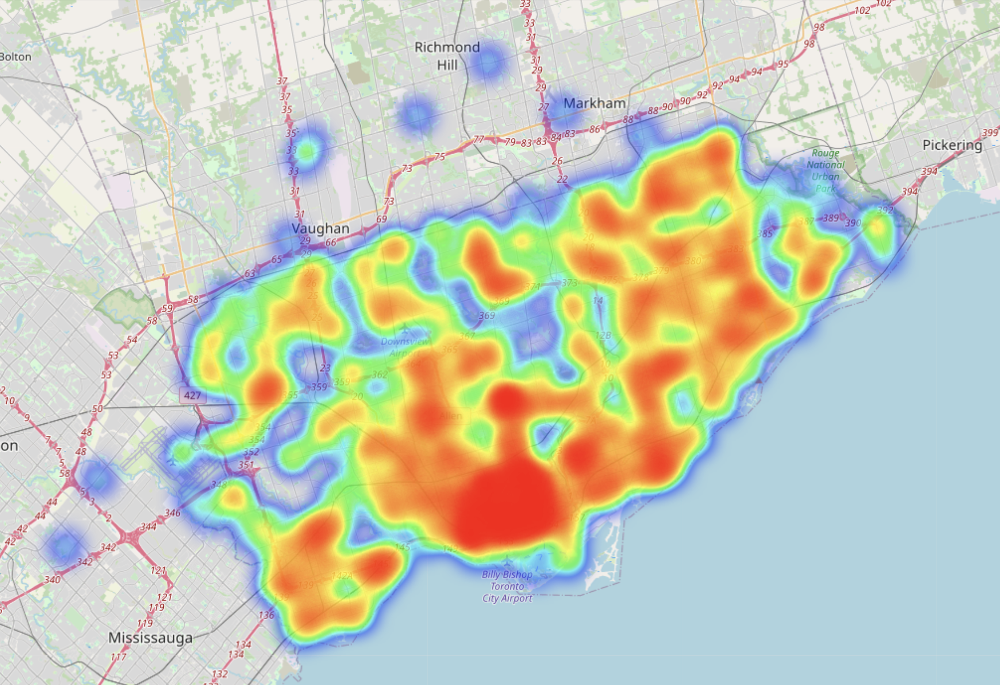

In [8]:
Image(filename = 'heat_map_toronto.png')

From the heatmap above, the restaurants seem to spread quite uniformly while the density close to the seashore(airport and university of toronto) is higher than other places. Then let us glance at the distribution of open and closed restaurants separately.

#### 1.1.2. Map of open restaurants and closed restaurants

In [9]:
df_business_toronto_rest_open = df_business_toronto_rest[df_business_toronto_rest['is_open']==1]

In [10]:
df_business_toronto_rest_closed = df_business_toronto_rest[df_business_toronto_rest['is_open']==0]

In [11]:
map_toronto_open_closed = folium.Map([lat_toronto, lon_toronto], zoom_start=20) 

for index, row in df_business_toronto_rest_open.iterrows():
    folium.CircleMarker([row['latitude'], row['longitude']], 
                        radius=4,
                        color="red", fill_color="red", 
                        ).add_to(map_toronto_open_closed)

for index, row in df_business_toronto_rest_closed.iterrows():
    folium.CircleMarker([row['latitude'], row['longitude']], 
                        radius=4,
                        color="blue"
                        ).add_to(map_toronto_open_closed)

In [12]:
map_toronto_open_closed.save('map_toronto_open_closed.html')

In [13]:
display(IFrame(src='map_toronto_open_closed.html', width=1600, height=800))

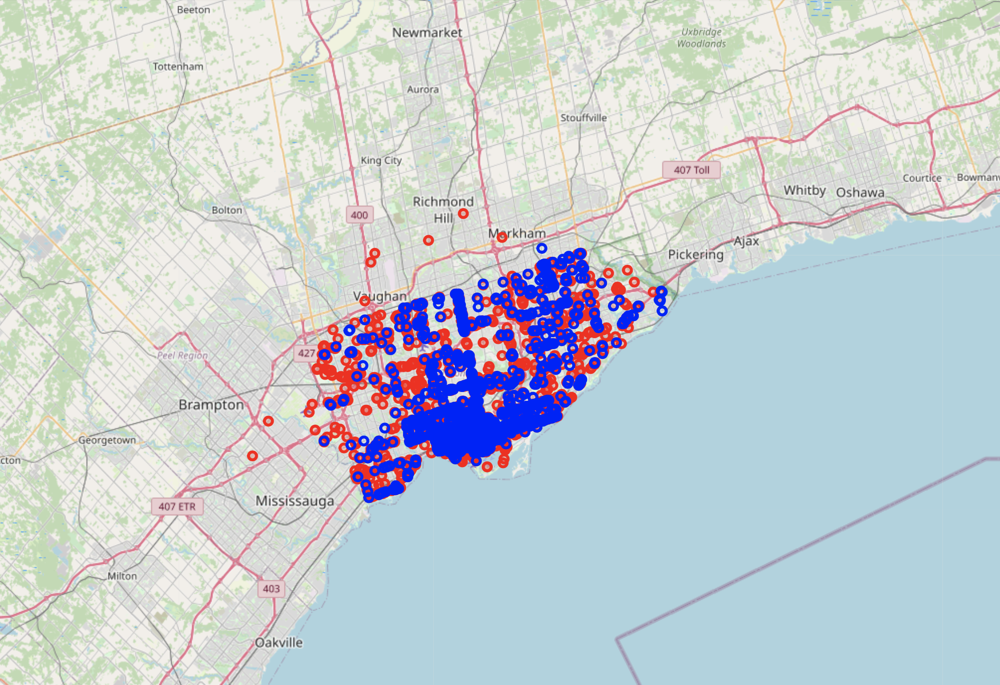

In [14]:
Image(filename='open_closed_map_toronto.png')

There is no obvious clustering of either closed or open restaurants at certian location, however, we do notice that in dense area, the amounts of both types are larger than other spots, which is reasonable because restaurants can thrive but they may also close down from the intense competence in the popular areas. 

<a id='C3.1.2.'></a>
### 1.2. Data Augmentation for popularity metrics

The popularity of a restaurant is related to the amount of reviews it received and the stars it's been rated. Since it is difficult to determine the proportion of each parameter, so instead of turning popularity into the numerical measurement to predict a regression problem, we create an additional class according to reviews counts and stars to classify the popularity in this way.

#### 1.2.1. Generate classes of popularity using reviews counts and stars

In [15]:
dummy = pd.DataFrame(columns=['popularity'])

> Pick `top 15%` quantile as popular bound for both review counts and stars

In [16]:
top_stars = df_business_toronto_rest.quantile(0.85).stars
top_review_counts = df_business_toronto_rest.quantile(0.85).review_count

In [17]:
df_business_toronto_rest_popular = pd.concat([df_business_toronto_rest, dummy])

> 0 in popularity: `high_rating & high_review_counts`

In [18]:
df_business_toronto_rest_popular.loc[:, 'popularity'][(df_business_toronto_rest['stars']>=top_stars) & (df_business_toronto_rest['review_count']>=top_review_counts)] = 0

> 1 in popularity: `low_rating & high_review_counts`

In [19]:
df_business_toronto_rest_popular.loc[:, 'popularity'][(df_business_toronto_rest['stars']<top_stars) & (df_business_toronto_rest['review_count']>=top_review_counts)] = 1

> 2 in popularity: `high_rating & low_review_counts`

In [20]:
df_business_toronto_rest_popular.loc[:, 'popularity'][(df_business_toronto_rest['stars']>=top_stars) & (df_business_toronto_rest['review_count']<top_review_counts)] = 2

> 3 in popularity: `low_rating & low_review_counts`

In [21]:
df_business_toronto_rest_popular.loc[:, 'popularity'][(df_business_toronto_rest['stars']<top_stars) & (df_business_toronto_rest['review_count']<top_review_counts)] = 3

#### 1.2.2. Data preprocessing for prediction

> Drop all the parameters which are irrelevant to prediction of popularity

In [22]:
df_business_toronto_rest_popular.drop(['business_id','name','address','city','state','postal_code','stars','review_count'], axis=1, inplace=True)

* **Categories**

In [23]:
df_business_toronto_rest_popular.categories = df_business_toronto_rest_popular.categories.apply(lambda x : x.split(','))

In [24]:
categories = set()
for c in df_business_toronto_rest_popular.categories:
    categories = categories.union(set(c))

categories1 = set()
for category in categories:
    category = category.strip().lower()
    categories1.add(category)

We can easily notice that some of categories are overlapping, for example, `Coffee & Tea` and `Coffee & Tea Supplies` are quite similar. However, it is difficult to determine which to drop and which to use, so we keep them all.

In [25]:
for category in categories1:
    df_business_toronto_rest_popular['categories_'+category] = df_business_toronto_rest_popular.categories.apply(lambda c : int(bool(category in c)))
df_business_toronto_rest_popular.drop(['categories'], axis=1, inplace=True)

* **Attributes**

We will keep all the attributes as well, even some of them are rarely shown.

> Function of generating new columns out of original nested columns

In [26]:
def column_augmentation(df, columns, column_name):
    for entry in df.to_list():
        entry = json.loads(entry)
    
        for key, value in entry.items():

            if (isinstance(value, dict)):
                for k, v in value.items():
                    columns.add(str(column_name + '_' + key.lower() + '_' + k.lower() + '_' + v.lower()))
            else:
                columns.add(str(column_name + '_' + key.lower() + '_' + value.lower()))
            
    return columns

> Function of updating the new columns by filling values

In [27]:
def update_column_values(row, column_name):
    entry = json.loads(row[column_name])

    for key, value in entry.items():
        if (isinstance(value, dict)):
            for k, v in value.items():
                row[str(column_name + '_' + key.lower() + '_' + k.lower() + '_' + v.lower())] = 1
        else:
            row[str(column_name + '_' + key.lower() + '_' + value.lower())] = 1
            
    return row

In [28]:
attributes = set()
attributes = column_augmentation(df=df_business_toronto_rest_popular.attributes, columns=attributes, column_name='attributes')
df_business_toronto_rest_popular = df_business_toronto_rest_popular.join(pd.DataFrame(columns=attributes)).replace(np.nan, 0)

> Find attributes that are present for each restaurant and update the columns to show the corresponding presence

In [29]:
df_business_toronto_rest_popular = df_business_toronto_rest_popular.apply(lambda row: update_column_values(row=row, column_name='attributes'), axis=1)
df_business_toronto_rest_popular.drop(['attributes'], axis=1, inplace=True)

* **Hours**

In [30]:
df_business_toronto_rest_popular.hours = df_business_toronto_rest_popular.hours.apply(lambda h: eval(h))

> Get all the new columns of opening hours

In [31]:
days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
hours = []
for i in range (24):
    hours.append(datetime.time(i,0,0))
for day in days:
    for hour in hours:
        df_business_toronto_rest_popular['open_'+day+'_'+str(hour)]=0

In [32]:
for index, resturant in df_business_toronto_rest_popular.iterrows():
    if resturant.hours != {}:
        for day in days:
            if day in resturant.hours.keys():
                opening_hours = resturant.hours[day].split("-")
                open_hour = pd.to_datetime(opening_hours[0]).time()
                close_hour = pd.to_datetime(opening_hours[1]).time()
                for hour in hours:
                    if open_hour<=hour and hour<close_hour:
                        df_business_toronto_rest_popular['open_'+day+"_"+str(hour)][index] = 1

> Update the empty values with most frequent opening hours in each day as we can assume most restaurants follow the similar opening time in real life

In [33]:
resturants_with_openhours = df_business_toronto_rest_popular[df_business_toronto_rest_popular.hours != {}]
for index, resturant in df_business_toronto_rest_popular.iterrows():
    if resturant.hours == {}:
        for day in days:
            for hour in hours:
                df_business_toronto_rest_popular['open_'+day+"_"+str(hour)][index] = resturants_with_openhours['open_'+day+"_"+str(hour)].value_counts().idxmax()
df_business_toronto_rest_popular.drop(['hours'], axis=1, inplace=True)

<a id='C3.1.3.'></a>
### 1.3. Prediction of restaurants' popularity class

In [34]:
df_business_toronto_rest_popular.iloc[:, 2] = df_business_toronto_rest_popular.iloc[:, 2].astype('int')

#### 1.3.1 Build training and test datasets

> Scale data using `RobustScaler` since we have both numerical and categorical data

In [35]:
scaler = RobustScaler()
scaled_df = scaler.fit_transform(df_business_toronto_rest_popular.iloc[:, 0:2])
scaled_df = pd.DataFrame(scaled_df, columns=['latitude', 'longitude'])
scaled_df = pd.concat([scaled_df, df_business_toronto_rest_popular.iloc[:, 2:]], axis=1)

In [36]:
y = (scaled_df[['popularity']])
X = (scaled_df.drop(columns=y))
# X = df_business_toronto_rest_popular.drop(columns=['latitude', 'longitude'])

> Split the original dataset into training and test sets

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

#### 1.3.2. Baseline-dummy classifier

In [38]:
dummy_clf = DummyClassifier(strategy='stratified', random_state=42)
dummy_clf.fit(X_train, y_train)
y_pred_dummy_clf = dummy_clf.predict(X_test)

Since our dataset is highly imbalanced with very sparse parameters, we will focusing on using `F1 score` instead of `Accuracy` to interpret it more appropriately.

In [39]:
print('Accuracy of Dummy Classifier:', dummy_clf.score(X_test, y_test))
print('F1 score of Dummy Classifier:', f1_score(y_test, y_pred_dummy_clf, average='macro'))

Accuracy of Dummy Classifier: 0.39001919385796546
F1 score of Dummy Classifier: 0.23625041527040402


#### 1.3.3. Logistic regression

Dummy classfier performs badly, then we try to use a "white-box" method logistic regression with one-vs-rest approach to do the prediciton.

In [40]:
log_reg = LogisticRegression(solver='sag', max_iter=500, random_state=42,
                             multi_class='ovr')
log_reg.fit(X_train, y_train)
y_pred_log_reg = log_reg.predict(X_test)

In [41]:
print('Accuracy of Logistic Regression:', log_reg.score(X_test, y_test))
print('F1 score of Logistic Regression:', f1_score(y_test, y_pred_log_reg, average='macro'))

Accuracy of Logistic Regression: 0.617658349328215
F1 score of Logistic Regression: 0.4960222054395864


> Confusion matrix

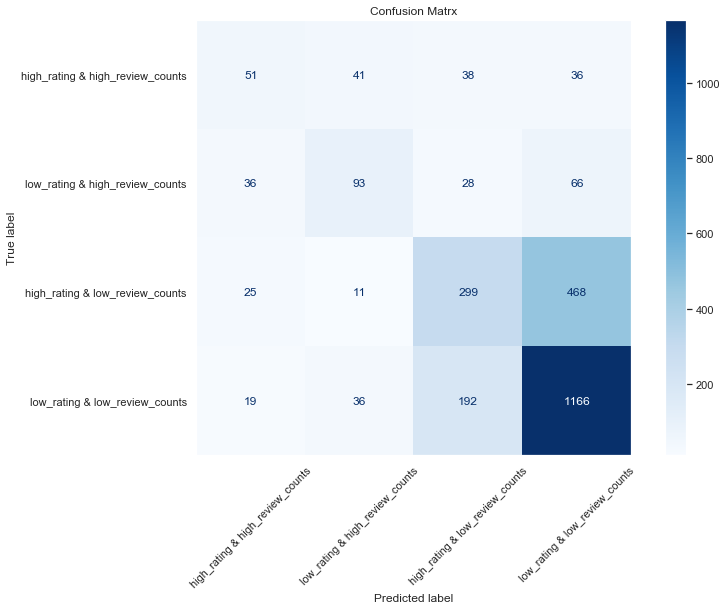

In [42]:
plot = plot_confusion_matrix(log_reg, 
                             X_test, 
                             y_test, 
                             display_labels=['high_rating & high_review_counts',
                                             'low_rating & high_review_counts',
                                             'high_rating & low_review_counts',
                                             'low_rating & low_review_counts'], 
                             cmap=plt.cm.Blues,
                             values_format='d')
plt.title('Confusion Matrx')
plt.xticks(rotation='45')
plt.grid(False)
plt.show()

#### 1.3.4. XGBoost

Finally we select XGBoost which is based on tree methods to solve the prediction, and try to interpret it using `SAHP` afterwards.

In [46]:
xgb_clf = xgb.XGBClassifier(
    learning_rate=0.1,
    n_estimators=500,
    max_depth=5,
    objective='multi:softmax',
    nthread=4,
    random_state=42,
    num_class=4)

In [48]:
xgb_param = xgb_clf.get_xgb_params()
xgtrain = xgb.DMatrix(X_train.values, label=y_train.values)
cvresult = xgb.cv(xgb_param, xgtrain, num_boost_round=500, nfold=5,
                  metrics='merror', early_stopping_rounds=50)

In [49]:
xgb_clf.set_params(n_estimators=cvresult.shape[0])
print(cvresult)

     train-merror-mean  train-merror-std  test-merror-mean  test-merror-std
0             0.350107          0.004459          0.414744         0.009195
1             0.342865          0.003918          0.406516         0.007472
2             0.337188          0.005428          0.406516         0.007198
3             0.333526          0.005336          0.404046         0.010582
4             0.329164          0.005669          0.402565         0.009293
..                 ...               ...               ...              ...
113           0.168820          0.001912          0.367017         0.008119
114           0.167956          0.002103          0.366852         0.007984
115           0.167421          0.002102          0.366687         0.008253
116           0.166722          0.002190          0.366193         0.009024
117           0.166434          0.001870          0.365535         0.008548

[118 rows x 4 columns]


In [50]:
xgb_clf.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=118, n_jobs=4, nthread=4, num_class=4,
              num_parallel_tree=1, objective='multi:softprob', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [51]:
y_pred_xgb_clf = xgb_clf.predict(X_test)

In [52]:
print('Accuracy of XGBoost:', xgb_clf.score(X_test, y_test))
print('F1 score of XGBoost:', f1_score(y_test, y_pred_xgb_clf, average='macro'))

Accuracy of XGBoost: 0.6395393474088292
F1 score of XGBoost: 0.5241083818389123


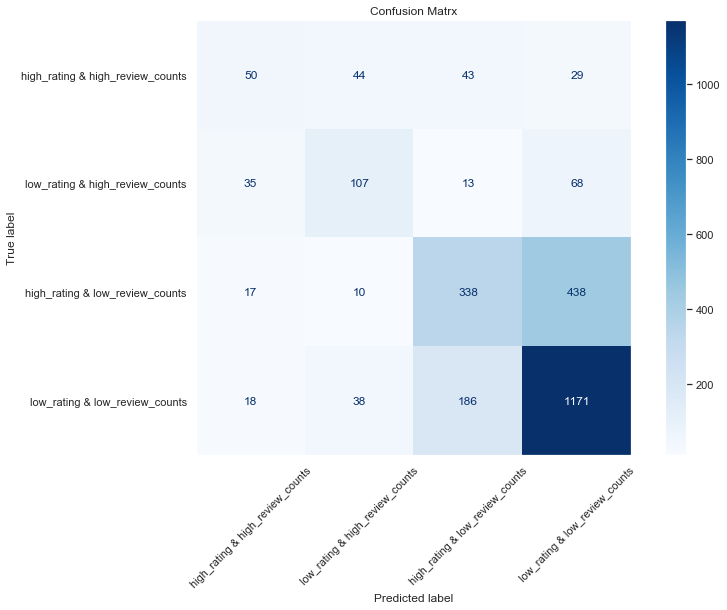

In [53]:
plot = plot_confusion_matrix(xgb_clf, 
                             X_test, 
                             y_test, 
                             display_labels=['high_rating & high_review_counts',
                                             'low_rating & high_review_counts',
                                             'high_rating & low_review_counts',
                                             'low_rating & low_review_counts'], 
                             cmap=plt.cm.Blues,
                             values_format='d')
plt.title('Confusion Matrx')
plt.xticks(rotation='45')
plt.grid(False)
plt.show()

XGBoost does not perform much better than logistic regression probably due to manual definiation of the popularity class and the highly imbalanced data, but both of them are much better than a random guess. Therefore we can assume the model is useful. 

<a id='C3.1.4.'></a>
### 1.4. Feature analysis

In [54]:
explainer = shap.TreeExplainer(xgb_clf)
shap_values = explainer.shap_values(X_test)

> Overview of importance for most several important features

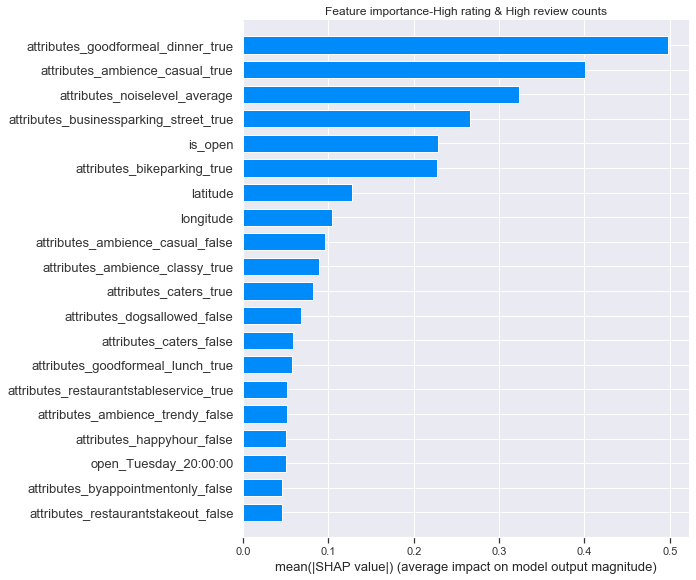

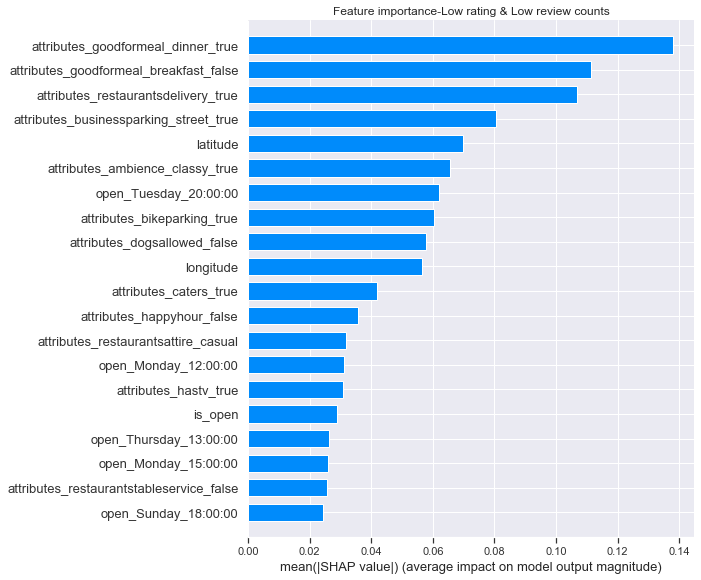

In [71]:
plt.title('Feature importance-High rating & High review counts')
shap.summary_plot(shap_values[0], X_test, plot_type='bar')

plt.title('Feature importance-Low rating & Low review counts')
shap.summary_plot(shap_values[3], X_test, plot_type='bar')

The importance for prediction of features are ordered from top to bottom(high to low), so the summary plots enable us to get a general view about what are the most important features for predicting different popularity classes. Here we will only show `High rating & High review counts` and `Low rating & Low review counts` to compare the importance sharply.

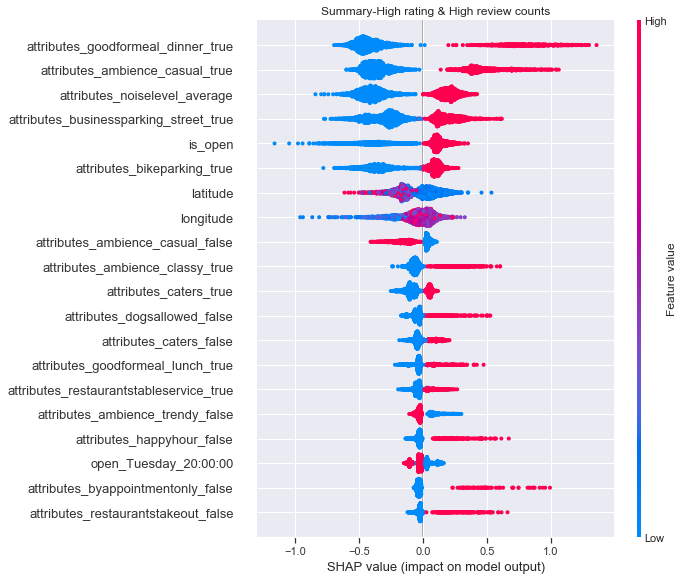

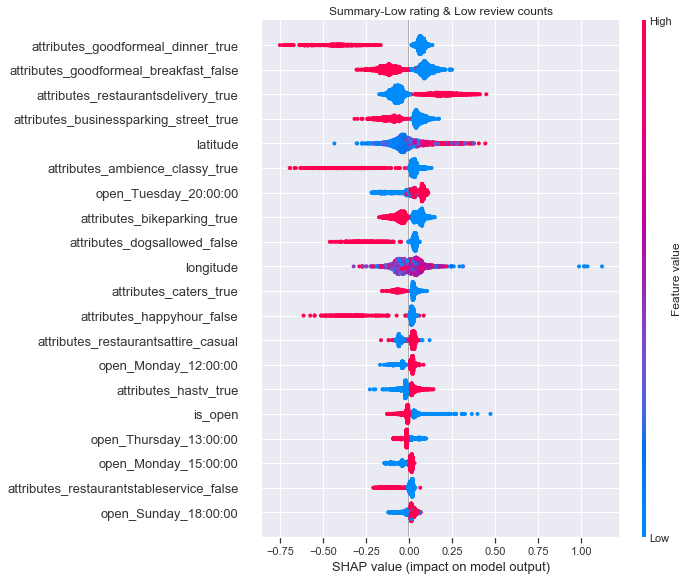

In [73]:
plt.title('Summary-High rating & High review counts')
shap.summary_plot(shap_values[0], X_test)
plt.title('Summary-Low rating & Low review counts')
shap.summary_plot(shap_values[3], X_test)

All the parameters are binary except `latitude` and  `longitude`, hence from the summary plots above, we can interpret all the blue points are `False` while red points represent `True`. Let us look at some examples to see if the interpretation make sense here:

* **In `High rating & High review counts`:**
1. `attributes_goodformeal_dinner_true`: When this parameter is `True`, the SHAP value is positively high, which means it is more likely to be a `High rating & High review counts` restaurant with `attributes_goodformeal_dinner_true==Ture`. And we can find there are more restaurants to have this parameter to be true in `High rating & High review counts` which is also reasonable.

2. `is open`: When `is_open` is true, SHAP value is positive which means it is more likely for a restaurant to have `High rating & High review counts` while in the other side, if it is false, a restaurant tends to not be popular.

* **In `Low rating & Low review counts`:**
1. `attributes_goodformeal_dinner_true`: In contrast to the class `High rating & High review counts`, here we have more `True` indicating negative possibility on prediction of `Low rating & Low review counts` class, which means if a restaurant has `attributes_goodformeal_dinner_true` to be true, is will be unlikely to be in this least popular class.


2. `is_open`: When `is_open` is false, SHAP value is positive which means the closed restaurant is probably to be not popular in `Low rating & Low review counts` class.

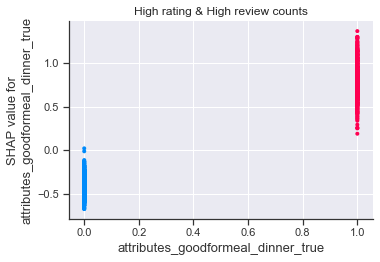

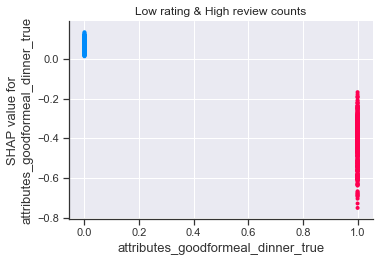

In [88]:
figure0 = plt.figure()
ax0 = figure0.add_subplot(2, 2, 1)
ax0.set_title("High rating & High review counts")
shap.dependence_plot(ind='attributes_goodformeal_dinner_true', interaction_index='attributes_goodformeal_dinner_true',
                     shap_values=shap_values[0], 
                     features=X_test,  
                     display_features=X_test,
                     ax=ax0)


figure1 = plt.figure()
ax1 = figure1.add_subplot(2, 2, 2)
ax1.set_title("Low rating & High review counts")
ax0.set_title("High rating & High review counts")
shap.dependence_plot(ind='attributes_goodformeal_dinner_true', interaction_index='attributes_goodformeal_dinner_true',
                     shap_values=shap_values[3], 
                     features=X_test,  
                     display_features=X_test,
                     ax=ax1)

There are some not very meaningful parameters, which are probably because of the high ratio of missing data in some parameters. Hence we need to interpret these features very carefully, perhaps looking at the original data distribution without imputing can be helpful to have a more comprehensive point of view.

> `Latitude` and `Longitude` (continuous features):

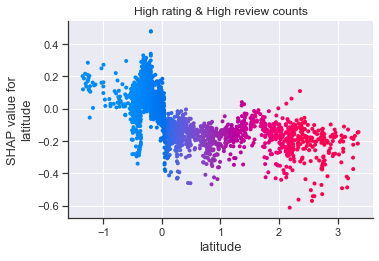

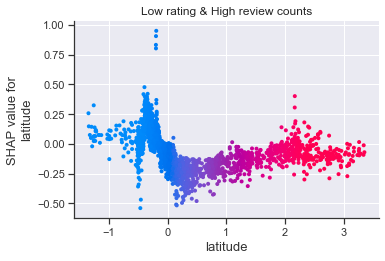

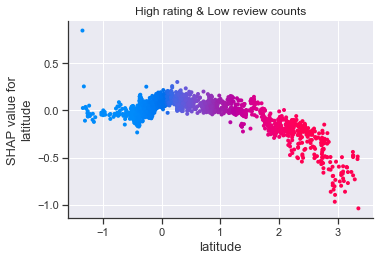

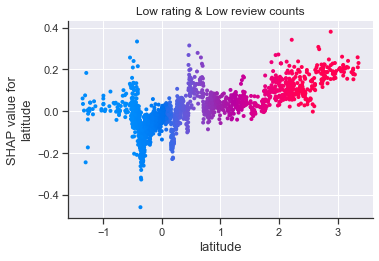

In [89]:
figure0 = plt.figure()
ax0 = figure0.add_subplot(2, 2, 1)
ax0.set_title("High rating & High review counts")
shap.dependence_plot(ind='latitude', interaction_index='latitude',
                     shap_values=shap_values[0], 
                     features=X_test,  
                     display_features=X_test,
                     ax=ax0)


figure1 = plt.figure()
ax1 = figure1.add_subplot(2, 2, 2)
ax1.set_title("Low rating & High review counts")
shap.dependence_plot(ind='latitude', interaction_index='latitude',
                     shap_values=shap_values[1], 
                     features=X_test,  
                     display_features=X_test,
                     ax=ax1)

figure2 = plt.figure()
ax2 = figure2.add_subplot(2, 2, 3)
ax2.set_title("High rating & Low review counts")
shap.dependence_plot(ind='latitude', interaction_index='latitude',
                     shap_values=shap_values[2], 
                     features=X_test,  
                     display_features=X_test,
                     ax=ax2)


figure3 = plt.figure()
ax3 = figure3.add_subplot(2, 2, 4)
ax3.set_title("Low rating & Low review counts")
shap.dependence_plot(ind='latitude', interaction_index='latitude',
                     shap_values=shap_values[3], 
                     features=X_test,  
                     display_features=X_test,
                     ax=ax3)

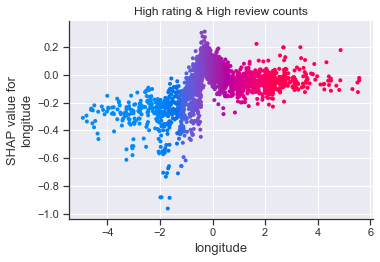

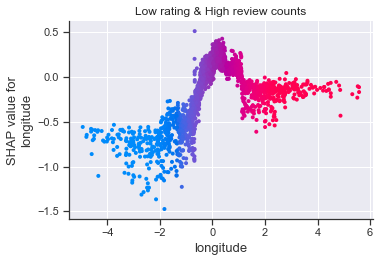

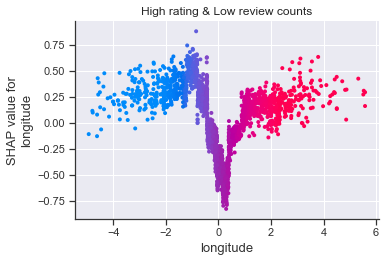

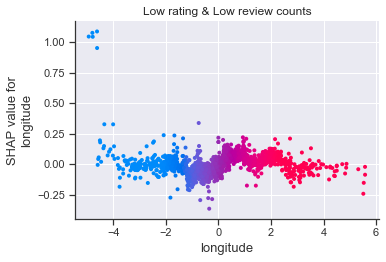

In [83]:
figure0 = plt.figure()
ax0 = figure0.add_subplot(2, 2, 1)
ax0.set_title("High rating & High review counts")
shap.dependence_plot(ind='longitude', interaction_index='longitude',
                     shap_values=shap_values[0], 
                     features=X_test,  
                     display_features=X_test,
                     ax=ax0)


figure1 = plt.figure()
ax1 = figure1.add_subplot(2, 2, 2)
ax1.set_title("Low rating & High review counts")
shap.dependence_plot(ind='longitude', interaction_index='longitude',
                     shap_values=shap_values[1], 
                     features=X_test,  
                     display_features=X_test,
                     ax=ax1)

figure2 = plt.figure()
ax2 = figure2.add_subplot(2, 2, 3)
ax2.set_title("High rating & Low review counts")
shap.dependence_plot(ind='longitude', interaction_index='longitude',
                     shap_values=shap_values[2], 
                     features=X_test,  
                     display_features=X_test,
                     ax=ax2)


figure3 = plt.figure()
ax3 = figure3.add_subplot(2, 2, 4)
ax3.set_title("Low rating & Low review counts")
shap.dependence_plot(ind='longitude', interaction_index='longitude',
                     shap_values=shap_values[3], 
                     features=X_test,  
                     display_features=X_test,
                     ax=ax3)

From the dependence plots for latitude and logitude, we can spot some trends while they are not clear since we did not tranform the geo data points into proximity which would make better sense. We will do that solely in the next section.

<a id='C3.1.5.'></a>
### 1.5. Conclusion

The implementation of both logistic regression and XGBoost seem to improve our model to an acceptable level with respect to f1 score and accuracy. Furthermore, interpretation of XGBoost enable us to gain some valuable points and to spot some potential enhancement of data itself as well. When picking out several features to take a look exclusively, we can understand better how much one single parameter can influence the final result and in which direction(positive or negative), while in next step we look to extract location separately to analyse the role of location(distance) plays in the prediction(since it is hard to observe any trends from our interpretation model).

<a id='C3.2.'></a>
## Part 2: Does geolocation affect the success and popularity of restaurants?

<a id='C3.2.1.'></a>
### 2.1. Data loading and cleaning

Since we are discovering how much the geolocation of a business will affect its success, a large amount of data for the restaurants will be needed in our dataframe for classification and model prediction. Therefore, Toronto has been chosen as the target city for analysis, since it is the second-largest city in the dataset with respect to the amount of restaurant data.

In [57]:
df_business = pd.read_csv("./yelp_dataset/toronto_all_business.csv")
df_checkin = pd.read_csv("./yelp_dataset/toronto_all_checkins.csv")
df_review = pd.read_csv("./yelp_dataset/toronto_all_reviews.csv")
df_tip = pd.read_csv("./yelp_dataset/toronto_all_tips.csv")
df_user = pd.read_csv("./yelp_dataset/toronto_all_users.csv")

In [58]:
df_business['city'].value_counts().sort_values(ascending = False)
df_business_toronto = df_business[df_business['city'] == 'Toronto']

In [59]:
df_business_toronto.dropna(subset = ['categories'], inplace = True)

df_business['city'] = df_business['city'].str.strip().str.capitalize()
df_business_toronto_rest = df_business_toronto[df_business_toronto['categories'].str.contains('Restaurants')]

<a id='C3.2.2.'></a>
### 2.2. Visualization of success scores across Toronto businesses

After cleaning the dataset, we will show a visualization of the restaurant distribution. An initial success score has been introduced here, which uses the restaurant's state, its average review rating and its review count attributes will be the attributes used to calculate a "success" score below:

In [60]:
def successScore(avgRating, reviewCount, isOpen):
    return isOpen * avgRating * reviewCount / 10

df_business_toronto_rest['success score'] = successScore(df_business_toronto_rest.stars, df_business_toronto_rest.review_count, df_business_toronto_rest.is_open)
df_business_toronto_rest = df_business_toronto_rest[df_business_toronto_rest['success score'] > 0]

In order to have a better view of restaurants on the heatmap, we will define the radius and color of each point, depending on their success score, which will help us in identifying better businesses across the map:

In [61]:
def radius_adjust(score):
    if score > 0 and score <= 10:
        return 3
    elif score < 20 and score > 10:
        return 6
    elif score >= 20 and score < 40:
        return 9
    else: 
        return 15

In [62]:
def color_adjust(score):
    # the red is getting darker if the score is higher, and when score > 600, it will be shown as black
    if score > 0 and score <=10:
        return '#ffcccc'  #light red
    elif score < 20 and score >10:
        return '#ff6677'
    elif score >=20 and score <40:
        return '#ff0000'
    else: 
        return '#000000'

In [63]:
lat_toronto = np.median(df_business_toronto_rest['latitude'])
lon_toronto = np.median(df_business_toronto_rest['longitude'])

map_toronto_open_success = folium.Map([lat_toronto, lon_toronto], zoom_start=15) 

for index, row in df_business_toronto_rest.iterrows():
    folium.CircleMarker([row['latitude'], row['longitude']], 
                        radius=12,
                        tooltip = 'Postcode: ' + str(row['postal_code']),
                        color=color_adjust(row['success score']), fill_color=color_adjust(row['success score']), 
                        ).add_to(map_toronto_open_success)

As the plot shows below, a large amount of popular restaurants are located near the coastal side of the city, however there doesn't seem to be an obvious location of conglomerates where there is a specific area only with successful restaurants.

In [64]:
map_toronto_open_success.save('map_restaurant_radius.html')

In [65]:
display(IFrame(src='map_restaurant_radius.html', width=1600, height=800))

___In case the map is not displayed in HTML, we have saved a screenshot below, for convenience and reproducibility:___

<img src="heatmap_restaurants_radius.png">

__In order to have a better understanding of how successful a restaurant is, we will classify restaurants into 4 different types__, which are:

1. high star rating with top review counts, 
2. high star rating with low review counts, 
3. low star rating with top review counts,
4. low star rating with low review counts, 

which has also been presented in the previous section of the report. 

In [66]:
dummy = pd.DataFrame(columns=['popularity'])
top_stars = df_business_toronto_rest.quantile(0.85).stars
top_review_counts = df_business_toronto_rest.quantile(0.85).review_count
df_business_toronto_rest_popular = pd.concat([df_business_toronto_rest, dummy])

In [67]:
df_business_toronto_rest_popular.loc[:, 'popularity'][(df_business_toronto_rest['stars']>=top_stars) & (df_business_toronto_rest['review_count']>=top_review_counts)] = 0
df_business_toronto_rest_popular.loc[:, 'popularity'][(df_business_toronto_rest['stars']<top_stars) & (df_business_toronto_rest['review_count']>=top_review_counts)] = 1
df_business_toronto_rest_popular.loc[:, 'popularity'][(df_business_toronto_rest['stars']>=top_stars) & (df_business_toronto_rest['review_count']<top_review_counts)] = 2
df_business_toronto_rest_popular.loc[:, 'popularity'][(df_business_toronto_rest['stars']<top_stars) & (df_business_toronto_rest['review_count']<top_review_counts)] = 3

In [68]:
df_business_toronto_rest_popular.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,success score,popularity
5,0QjROMVW9ACKjhSEfHqNCQ,Mi Mi Restaurant,688 Gerrard Street E,Toronto,ON,M4M 1Y3,43.666376,-79.348773,4.0,116.0,1.0,"{""RestaurantsTakeOut"": ""True"", ""Alcohol"": ""bee...","Vietnamese, Restaurants","{""Monday"": ""11:00-22:00"", ""Tuesday"": ""11:00-22...",46.4,0
11,8k62wYhDVq1-652YbJi5eg,Tim Hortons,90 Adelaide Street W,Toronto,ON,M5H 3V9,43.649859,-79.382060,3.0,8.0,1.0,"{""OutdoorSeating"": ""False"", ""RestaurantsDelive...","Bagels, Donuts, Food, Cafes, Coffee & Tea, Res...",{},2.4,3


<a id='C3.2.3.'></a>
### 2.3. Interpretable machine learning: KNN classification model

As the popularity will be our target feature, first of all, here we will use K-nearest neighbours, with geolocation acting as our input feature:

In [69]:
Restaurant = df_business_toronto_rest_popular.filter(['latitude','longitude','popularity'], axis=1)
Restaurant_y = df_business_toronto_rest_popular.filter(['popularity'], axis = 1)
Restaurant['latlon'] = list(zip(Restaurant.latitude, Restaurant.longitude))
Restaurant

,latitude,longitude,popularity,latlon
5,43.666376,-79.348773,0,"(43.6663763388, -79.3487726589)"
11,43.649859,-79.382060,3,"(43.6498592, -79.38206020000001)"
14,43.765279,-79.326248,3,"(43.765279, -79.32624799999998)"
15,43.685608,-79.313936,2,"(43.6856078, -79.31393620000001)"
17,43.705843,-79.397841,3,"(43.7058425, -79.3978408)"
...,...,...,...,...
20318,43.700617,-79.396762,2,"(43.7006166, -79.39676180000002)"
20320,43.726656,-79.480365,3,"(43.726656, -79.480365)"
20321,43.657716,-79.402098,0,"(43.6577161, -79.40209820000003)"
20325,43.701807,-79.575135,2,"(43.7018074, -79.5751352)"


In [70]:
Restaurant_y = np.asarray(Restaurant_y['popularity'], dtype="int")

Let us train a KNN using the geolocation attributes only:

In [71]:
Restaurant_x = df_business_toronto_rest_popular.filter(['latitude','longitude'], axis=1)
Restaurant_x.astype('float')

,latitude,longitude
5,43.666376,-79.348773
11,43.649859,-79.382060
14,43.765279,-79.326248
15,43.685608,-79.313936
17,43.705843,-79.397841
...,...,...
20318,43.700617,-79.396762
20320,43.726656,-79.480365
20321,43.657716,-79.402098
20325,43.701807,-79.575135


In [72]:
X_train, X_test, y_train, y_test = train_test_split(Restaurant_x, Restaurant_y, test_size=0.2, random_state=42)
knn = KNeighborsClassifier(n_neighbors = 30)
# Fit the classifier to the data
knn.fit(X_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=30, p=2,
                     weights='uniform')

In [73]:
knn.score(X_test, y_test)

0.5068618481244281

Here, we perform hyperparameter tuning using GridSearchCV, to test from 1 to 30 neighbors:

In [74]:
knn2 = KNeighborsClassifier()
#create a dictionary of all values we want to test for n_neighbors
param_grid = {'n_neighbors': np.arange(1, 50)}
#use gridsearch to test all values for n_neighbors
knn_gscv = GridSearchCV(knn2, param_grid, cv = 5)
#fit model to data
knn_gscv.fit(X_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=None,
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [75]:
knn_gscv.best_score_

0.5307810464454877

As the result of prediction is not so good, we would like to also include the relationship between each restaurant. 

Instead of using longtitude and latitude as input feature for classification, we will use them to calculate the euclidean distance of the 5 Nearest Neighboring restaurants, together with using their popularity, then try again with the Nearest Neighbor algorithm: 

In [76]:
def great_circle_dist(latlon1, latlon2):
    # Uses geopy to calculate distance between coordinates
    
    return geopy.distance.great_circle(latlon1, latlon2).meters

In [77]:
def find_nearest(x):
    # Finds nearest neighbor
    Restaurant['distances'] = Restaurant.latlon.apply(great_circle_dist, args=(x,))
    df_sort =Restaurant.sort_values(by='distances')
    
    return (df_sort.values[1][2], df_sort.values[1][4],df_sort.values[2][2], df_sort.values[2][4],df_sort.values[3][2], df_sort.values[3][4],df_sort.values[4][2], df_sort.values[4][4],df_sort.values[5][2], df_sort.values[5][4])

Restaurant['nearest'] = Restaurant['latlon'].apply(find_nearest)
Restaurant['1nearest_dist'] = Restaurant.nearest.apply(lambda x: x[1])
Restaurant['1popularity'] = Restaurant.nearest.apply(lambda x: x[0])
Restaurant['2nearest_dist'] = Restaurant.nearest.apply(lambda x: x[3])
Restaurant['2popularity'] = Restaurant.nearest.apply(lambda x: x[2])
Restaurant['3nearest_dist'] = Restaurant.nearest.apply(lambda x: x[5])
Restaurant['3popularity'] = Restaurant.nearest.apply(lambda x: x[4])
Restaurant['4nearest_dist'] = Restaurant.nearest.apply(lambda x: x[7])
Restaurant['4popularity'] = Restaurant.nearest.apply(lambda x: x[6])
Restaurant['5nearest_dist'] = Restaurant.nearest.apply(lambda x: x[9])
Restaurant['5popularity'] = Restaurant.nearest.apply(lambda x: x[8])

In [78]:
Restaurant.head(2)

,latitude,longitude,popularity,latlon,distances,nearest,1nearest_dist,1popularity,2nearest_dist,2popularity,3nearest_dist,3popularity,4nearest_dist,4popularity,5nearest_dist,5popularity
5,43.666376,-79.348773,0,"(43.6663763388, -79.3487726589)",3821.274620,"(2, 64.08535162301766, 2, 81.24935193164022, 2...",64.085352,2,81.249352,2,83.837693,2,105.667242,0,119.915603,2
11,43.649859,-79.382060,3,"(43.6498592, -79.38206020000001)",1434.719368,"(0, 63.93174525734467, 2, 66.764553251276, 3, ...",63.931745,0,66.764553,2,72.101529,3,72.101529,3,91.321424,3


In [79]:
Restaurant = Restaurant.drop(columns = ['distances', 'nearest'])

In [80]:
Restaurant_c = Restaurant
Restaurant_x = Restaurant.filter(['latitude','longitude','1nearest_dist','1popularity','2nearest_dist','2popularity','3nearest_dist','3popularity','4nearest_dist','4popularity','5nearest_dist','5popularity'], axis=1)
Restaurant_y = Restaurant_c.filter(['popularity'], axis = 1)

In [81]:
Restaurant_y = np.asarray(Restaurant_y['popularity'], dtype = "int")

Again, we will perform hyperparameter selection using GridSearchCV to test from 1 to 50 neighbors and include the best result:

In [82]:
X_train, X_test, y_train, y_test = train_test_split(Restaurant_x, Restaurant_y, test_size=0.2, random_state=42)

# Fit the classifier to the data
knn2 = KNeighborsClassifier()
#create a dictionary of all values we want to test for n_neighbors
param_grid = {'n_neighbors': np.arange(1, 50)}
#use gridsearch to test all values for n_neighbors
knn_gscv = GridSearchCV(knn2, param_grid, cv=5)
#fit model to data
knn_gscv.fit(X_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=None,
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [83]:
knn_gscv.best_score_

0.5106442709193423

__There is no large difference in result between two KNN models, with only a 2% difference in the accuracy.__

This result makes sense, as the KNN works better with low dimensional input feature matrices. <br>Therefore, we will now use a multi-layer neural network as a more complex prediction model, for our next section:

<a id='C3.2.4.'></a>
### 2.4. Deep Learning model: multilayer neural network

The multilayer neural network we used will be implemented in Keras. 

As we have already split the dataset, we would need to also normalize the data first, so that the backpropagation algorithm will not be biased by different scales of particular variables:

In [84]:
Restaurant_x = Restaurant.filter(['latitude','longitude','popularity','1nearest_dist','1popularity','2nearest_dist','2popularity','3nearest_dist','3popularity','4nearest_dist','4popularity','5nearest_dist','5popularity'], axis=1)
Restaurant_y = Restaurant_c.filter(['popularity'], axis=1)

In [85]:
Restaurant_x = np.asarray(Restaurant_x,dtype = np.float32)
Restaurant_y = np.asarray(Restaurant_y,dtype = np.float32)
num_classes = 13 # because we have 13 input features

In [86]:
# splitting the data
X_train, X_test, y_train, y_test = train_test_split(Restaurant_x, Restaurant_y, test_size = 0.2, random_state = 42)

Performing one-hot-encoding upon target variable:

In [87]:
# process class labels
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

For our activation function selection, we are using 'tanh' for hidden layer, which is a rescaled logistic sigmoid activation function. 

It will output a result within the range of $[-1, 1]$. <br> Since this prediction problem is a multiclass classification challenge, we will be using the 'softmax' activation function as our final output layer activation function.

In [88]:
model = Sequential()

act_f = 'tanh' 
hidden_neurons_n = 64

model.add(Dense(hidden_neurons_n, activation=act_f, input_shape=(13,))) 
model.add(Dense(hidden_neurons_n, activation=act_f))
model.add(Dense(num_classes, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 64)                896       
_________________________________________________________________
dense_1 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_2 (Dense)              (None, 13)                845       
Total params: 5,901
Trainable params: 5,901
Non-trainable params: 0
_________________________________________________________________


We are using RMSprop as the optimization function, and we will not include a fixed learning rate in order not to train it with too many epochs and have an overfitting problem.

In [89]:
optimizer = RMSprop()

model.compile(loss = 'categorical_crossentropy', optimizer = RMSprop(), metrics = ['accuracy'])

batch_size = 12
epochs = 50

history = model.fit(X_train, y_train,
                    batch_size = batch_size,
                    epochs = epochs,
                    verbose = 1, # show training process
                    validation_data = (X_test, y_test))

Train on 4369 samples, validate on 1093 samples
Epoch 1/50
4369/4369 [==============================] - 1s 260us/sample - loss: 1.1189 - accuracy: 0.4962 - val_loss: 1.1239 - val_accuracy: 0.5160
Epoch 2/50
4369/4369 [==============================] - 1s 146us/sample - loss: 1.0477 - accuracy: 0.5207 - val_loss: 1.0766 - val_accuracy: 0.5160
Epoch 3/50
4369/4369 [==============================] - 1s 124us/sample - loss: 0.9581 - accuracy: 0.5518 - val_loss: 0.9630 - val_accuracy: 0.5608
Epoch 4/50
4369/4369 [==============================] - 1s 137us/sample - loss: 0.7980 - accuracy: 0.6432 - val_loss: 0.7024 - val_accuracy: 0.7246
Epoch 5/50
4369/4369 [==============================] - 1s 134us/sample - loss: 0.6511 - accuracy: 0.7276 - val_loss: 0.6857 - val_accuracy: 0.6825
Epoch 6/50
4369/4369 [==============================] - 1s 133us/sample - loss: 0.5531 - accuracy: 0.7661 - val_loss: 0.4758 - val_accuracy: 0.8289
Epoch 7/50
4369/4369 [==============================] - 1s 141us

<a id='C3.2.5.'></a>
### 2.5. Conclusion

As the result from multilayer neural network is above 90% accuracy, it has an obvious improvement over the previous two K-nearest neighbour models. At the same time, it is more reliable, since the KNN only considers the inputs as individual data points, however the Neural Network will also take the relationship between different features into account.

___Overall, we can conclude that the location of the restaurant does play an effective role on whether the restaurant is popular or not.___

<a id='C3.3.'></a>
## Part 3: What makes restaurants close down?

In this part of the analysis, we wish to investigate what business factors make restaurants in Toronto close down their activity. 

The focus is on properties of the restaurants themselves, and does not take into account the general economic situation of the area or country. 

To answer this question, we will examine if we can find some restaurant attributes which can be determinants for whether or not a restaurant has to close down. 

This is done by building classifiers and using their predictions for classifying if a restaurant is closed down or not. By examining the constructed classifier and how their prediction relates to a restaurant's features, it is indirectly determined which features are most relevant for predicting the closure of a restaurants will be forced to close.

We will start by loading in the dataset containing information about all Restaurants in Toronto:

In [90]:
Restaurants = pd.read_csv('yelp_dataset/toronto_restaurant_business.csv', encoding = "utf8")

In [91]:
print("Total number of restaurants in Toronto: {}".format(len(Restaurants)))

Total number of restaurants in Toronto: 8681


<a id='C3.3.1.'></a>
### 3.1. Data preparation and wrangling

First we remove data columns which decribe information which is only specific for the individual restaurant. This include the business ID, the name of the restaurant, address and since we are only intrested in Restaurants in Toronto also city and state.

In [92]:
Restaurants.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,rVBPQdeayMYht4Uv_FOLHg,Gourmet Burger Company,843 Kipling Avenue,Toronto,ON,M8Z 5G9,43.633291,-79.531768,3.0,13,0,"{""RestaurantsPriceRange2"": ""2"", ""RestaurantsAt...","Restaurants, Burgers, Food",{}
1,0QjROMVW9ACKjhSEfHqNCQ,Mi Mi Restaurant,688 Gerrard Street E,Toronto,ON,M4M 1Y3,43.666376,-79.348773,4.0,116,1,"{""RestaurantsTakeOut"": ""True"", ""Alcohol"": ""bee...","Vietnamese, Restaurants","{""Monday"": ""11:00-22:00"", ""Tuesday"": ""11:00-22..."


In [93]:
Restaurants = Restaurants.drop(['name','address','city','state','business_id'],axis = 1)

Both postal code and longitude and latitude provide information about the location, therefore including both features would be redundant. 

While longitude and latitude provide more precise geo-location information, this information is overlapping with the postal code.

In [94]:
print("There are {} different postal codes".format(len(Restaurants.postal_code.unique())))

There are 3176 different postal codes


If postal codes were to be included, it would be neccessary to one-hot encode them. 

With more 3176 different postal codes, this would make the total number of attributes very large compared to the number of samples. This would also mean that the observations for certain postal codes would be very sparse. For this reason the postal code attribute is removed from the data set.

In [95]:
Restaurants = Restaurants.drop(['postal_code'], axis = 1)

The logitude and latitude, however, provide very specific information about the geo-location, and considering that the influence of a restaurant's location has been investigated in a previous analysis, it will not be included here:

In [96]:
Restaurants = Restaurants.drop(['latitude','longitude'], axis = 1)

#### 3.1.1. Wrangling of the restaurant `attributes`:

The listed `attributes` of each restaurant is represented as dictionaries, but in a string format. The first step towards transforming them into a useful format is to change them into a dictionary format:

In [97]:
# Attributes are transformed from string to dictionaries

Restaurants.attributes = Restaurants.attributes.apply(lambda d: eval(d))

Not all attributes are listed for all restaurants, therefore a list of all available attributes is determined:

In [98]:
attributes=set([])

for d in Restaurants.attributes:
    attributes=attributes.union(set(d.keys()))
    
print("There exist the following {} attributes:".format(len(attributes)))

for attribute in attributes:
    print("- {}".format(attribute))

There exist the following 37 attributes:
- DogsAllowed
- Corkage
- DietaryRestrictions
- DriveThru
- WheelchairAccessible
- BYOB
- RestaurantsTakeOut
- ByAppointmentOnly
- AgesAllowed
- WiFi
- Ambience
- CoatCheck
- GoodForMeal
- BusinessParking
- Music
- Alcohol
- RestaurantsTableService
- Smoking
- NoiseLevel
- HappyHour
- OutdoorSeating
- AcceptsInsurance
- BusinessAcceptsCreditCards
- BestNights
- RestaurantsDelivery
- BikeParking
- RestaurantsPriceRange2
- RestaurantsGoodForGroups
- Caters
- HairSpecializesIn
- RestaurantsAttire
- GoodForDancing
- GoodForKids
- BusinessAcceptsBitcoin
- RestaurantsReservations
- HasTV
- RestaurantsCounterService


Each attribute is now represented as individual columns in the dataframe.

In [99]:
print("Percentage of restaurants for which attribute is NaN:")
print("---------------------------------------------------------")

for attribute in attributes:
    Restaurants[attribute]=Restaurants.attributes.apply(lambda a:  a[attribute] if (attribute in a) else np.nan)
    print("{}: {}%".format(attribute,Restaurants[attribute].isna().sum()/len(Restaurants[attribute].isna())*100))
    
Restaurants = Restaurants.drop(['attributes'], axis = 1)

Percentage of restaurants for which attribute is NaN:
---------------------------------------------------------
DogsAllowed: 87.29409054256422%
Corkage: 99.35491302845294%
DietaryRestrictions: 99.86176707752563%
DriveThru: 96.49809929731597%
WheelchairAccessible: 82.67480704987905%
BYOB: 99.066927773298%
RestaurantsTakeOut: 15.631839649809931%
ByAppointmentOnly: 96.72848750143993%
AgesAllowed: 99.9769611795876%
WiFi: 33.19894021426103%
Ambience: 21.518258265176822%
CoatCheck: 95.63414353185117%
GoodForMeal: 47.909227047575165%
BusinessParking: 18.78815804630803%
Music: 92.25895634143532%
Alcohol: 29.24778251353531%
RestaurantsTableService: 66.34028337749108%
Smoking: 95.72629881350075%
NoiseLevel: 34.48911415735515%
HappyHour: 87.67423107936874%
OutdoorSeating: 21.276350650846677%
AcceptsInsurance: 99.9769611795876%
BusinessAcceptsCreditCards: 96.8667204239143%
BestNights: 94.86234304803594%
RestaurantsDelivery: 22.209422877548672%
BikeParking: 39.00472295818454%
RestaurantsPriceRange2

It is clear that far from all attributes are listed for all restaurants. NaN values do not provide information about a restaurant, and can therefore not be included when training the classifier. 

Furthermore, we see that information about certain attributes is not listed for most restaurants. In such cases, it is assumed that a value for NaN cases cannot be reasonably derived. 

Attributes where more than 40% of the restaurants don't have its value listed are therefore removed. This creates a balance that also allows some less-common attributes to be included.

In [100]:
disgarded_attributes = set([])

for attribute in attributes:
    percent_NaN = Restaurants[attribute].isna().sum()/len(Restaurants[attribute].isna())*100
    if percent_NaN >= 40:
        Restaurants = Restaurants.drop([attribute],axis=1)
        disgarded_attributes = disgarded_attributes.union(set([attribute]))
attributes.difference_update(disgarded_attributes)        

# print("Attributes disgarded:")
# print("-----------------------------")
# for a in disgarded_attributes:
#       print(a)         
# print("-----------------------------")
# print("-----------------------------")
print("There are {} remaining attributes.".format(len(attributes)))

There are 15 remaining attributes.


Below, the remaining attributes are shown:

In [101]:
print("Percentage of restaurants for which attribute is NaN:")
print("---------------------------------------------------------")
for attribute in attributes:
    print("{}: {}%".format(attribute,Restaurants[attribute].isna().sum()/len(Restaurants[attribute].isna())*100))

Percentage of restaurants for which attribute is NaN:
---------------------------------------------------------
RestaurantsTakeOut: 15.631839649809931%
WiFi: 33.19894021426103%
Ambience: 21.518258265176822%
BusinessParking: 18.78815804630803%
Alcohol: 29.24778251353531%
NoiseLevel: 34.48911415735515%
OutdoorSeating: 21.276350650846677%
RestaurantsDelivery: 22.209422877548672%
BikeParking: 39.00472295818454%
RestaurantsPriceRange2: 19.32957032599931%
RestaurantsGoodForGroups: 20.94228775486695%
RestaurantsAttire: 26.414007602810734%
GoodForKids: 22.474369312291213%
RestaurantsReservations: 19.68667204239143%
HasTV: 23.77606266559152%


For the 15 remaining attributes, we still need to find a replacement for NaN values:

In [102]:
print("There are {} Restaurants with no NaN listed for attributes".format(len(Restaurants.dropna())))

There are 3730 Restaurants with no NaN listed for attributes


As we can see, dropping all restaurants with NaN values is not an option, since it will drastically limit the size of the dataset.

The examples below show that there is a large difference between what kind of values are listed for each attribute. 

This means that they must all be treated differently and individually, and the same must happen for occurences of NaN values.

In [103]:
Restaurants.Ambience

0       {'romantic': 'False', 'intimate': 'False', 'cl...
1       {'romantic': 'False', 'intimate': 'False', 'cl...
2       {'touristy': 'False', 'hipster': 'False', 'rom...
3       {'touristy': 'False', 'hipster': 'False', 'rom...
4                                                     NaN
                              ...                        
8676    {'romantic': 'False', 'intimate': 'False', 'cl...
8677    {'romantic': 'False', 'intimate': 'False', 'cl...
8678    {'touristy': 'False', 'hipster': 'False', 'rom...
8679    {'romantic': 'False', 'intimate': 'False', 'cl...
8680    {'touristy': 'False', 'hipster': 'False', 'rom...
Name: Ambience, Length: 8681, dtype: object

In [104]:
Restaurants.BikeParking

0         NaN
1        True
2       False
3        True
4        True
        ...  
8676     True
8677    False
8678     True
8679    False
8680     True
Name: BikeParking, Length: 8681, dtype: object

In [105]:
Restaurants.NoiseLevel

0       average
1       average
2           NaN
3          loud
4           NaN
         ...   
8676    average
8677    average
8678    average
8679        NaN
8680      quiet
Name: NoiseLevel, Length: 8681, dtype: object

##### 3.1.1.1. Wrangling of `Ambience` attribute:

In [106]:
Restaurants.Ambience.apply(lambda r: type(r)).unique()

array([<class 'dict'>, <class 'float'>, <class 'str'>], dtype=object)

We can see that not all values are dictionaries or NaN values.

In [107]:
for a in Restaurants.Ambience:
    if type(a)==str:
        print(a)
        break

None


We see that values such as None are also available. These correspond well with NaN. We now take a look at the nested dictionaries:

In [108]:
ambience_keys = set(Restaurants.Ambience[0].keys())
Restaurants.Ambience.apply(lambda d: set(d.keys())==ambience_keys if type(d)==dict else True)

0        True
1        True
2       False
3       False
4        True
        ...  
8676     True
8677     True
8678    False
8679     True
8680    False
Name: Ambience, Length: 8681, dtype: bool

We notice that not all ambience dictionaries contain the same keys. We therefore collect all the unique keys found in the data:

In [109]:
ambience_keys=set([])
for d in Restaurants.Ambience:
    if type(d)==dict:
        ambience_keys=ambience_keys.union(set(d.keys()))
print("The are the following {} keys used to describe ambience:".format(len(ambience_keys)))
for key in ambience_keys:
    print("- {}".format(key))

The are the following 9 keys used to describe ambience:
- upscale
- intimate
- touristy
- hipster
- trendy
- romantic
- casual
- divey
- classy


Each of the ambience properties is now represented by a new column, where NaN and None is represented as False. Here, 0 and 1 are used for categorical encoding of the variable:

In [110]:
for key in ambience_keys:
    Restaurants[key]=Restaurants.Ambience.apply(lambda a:  int(bool(a[key])) if type(a)==dict and (key in a) else 0)

Restaurants = Restaurants.drop(['Ambience'],axis=1)

In [111]:
print("Percent of restaurants which have ambience attribute:")
print("-----------------------------------------------------")
for ambience in ambience_keys:
    HaveAttribute=len(Restaurants[Restaurants[ambience]==1])        
    print("{}: {}%".format(ambience,HaveAttribute/len(Restaurants[ambience])*100))

Percent of restaurants which have ambience attribute:
-----------------------------------------------------
upscale: 77.9172906347195%
intimate: 78.19375647966824%
touristy: 78.19375647966824%
hipster: 75.37150097914986%
trendy: 78.19375647966824%
romantic: 78.19375647966824%
casual: 78.19375647966824%
divey: 32.76120262642553%
classy: 78.19375647966824%


##### 3.1.1.2. Wrangling of `Wifi` attribute:

In [112]:
Restaurants.WiFi.unique()

array(['no', 'free', nan, 'paid', 'None'], dtype=object)

We see that there is an overlap of categories, with no and None meaning the same thing. The values are therefor both set to 'no'. To address the issue of NaN, this is here assumed to be 'no' aswell.

In [113]:
Restaurants.WiFi = Restaurants.WiFi.replace("None","no")
Restaurants.WiFi = Restaurants.WiFi.replace(np.nan,"no")

`Wifi` can now be one-hot encoded:

In [114]:
Restaurants = pd.concat([Restaurants,pd.get_dummies(Restaurants.WiFi,prefix='Wifi_',drop_first=False)],axis=1)
Restaurants = Restaurants.drop(['WiFi'],axis=1)

##### 3.1.1.3. Wrangling of `Noise level` attribute:

In [115]:
Restaurants.NoiseLevel.unique()

array(['average', nan, 'loud', 'quiet', 'very_loud', 'None'], dtype=object)

We again see that _None_ and _nan_ are overlapping. When we have no data available here, we will assume an average noise level:

In [116]:
Restaurants.NoiseLevel = Restaurants.NoiseLevel.replace("None","average")
Restaurants.NoiseLevel = Restaurants.NoiseLevel.replace(np.nan,"average")

In [117]:
Restaurants=pd.concat([Restaurants,pd.get_dummies(Restaurants.NoiseLevel,prefix='NoiseLevel_',drop_first=False)],axis=1)
Restaurants=Restaurants.drop(['NoiseLevel'],axis=1)

##### 3.1.1.4. Wrangling of `Outdoor seating` attribute

In [118]:
Restaurants.OutdoorSeating.unique()

array(['False', 'True', nan, 'None'], dtype=object)

Again, the same pattern can be observed. If nothing is mentioned, we are going to assume that there is no outdoor seating.

In [119]:
Restaurants.OutdoorSeating=Restaurants.OutdoorSeating.replace("None",0)
Restaurants.OutdoorSeating=Restaurants.OutdoorSeating.replace(np.nan,0)
Restaurants.OutdoorSeating=Restaurants.OutdoorSeating.replace('False',0)
Restaurants.OutdoorSeating=Restaurants.OutdoorSeating.replace('True',1)

##### 3.1.1.5. Wrangling of the `Takeout` attribute:

In [120]:
Restaurants.RestaurantsTakeOut.unique()

array(['True', 'False', nan, 'None'], dtype=object)

Same approach are used, as for the previous attributes

In [121]:
Restaurants.RestaurantsTakeOut=Restaurants.RestaurantsTakeOut.replace("None",0)
Restaurants.RestaurantsTakeOut=Restaurants.RestaurantsTakeOut.replace(np.nan,0)
Restaurants.RestaurantsTakeOut=Restaurants.RestaurantsTakeOut.replace('False',0)
Restaurants.RestaurantsTakeOut=Restaurants.RestaurantsTakeOut.replace('True',1)

##### 3.1.1.6. Wrangling of the `RestaurantsDelivery` attribute:

In [122]:
Restaurants.RestaurantsDelivery.unique()

array(['False', 'True', nan, 'None'], dtype=object)

If nothing is listed, it is assumed that delivery is not offered:

In [123]:
Restaurants.RestaurantsDelivery=Restaurants.RestaurantsDelivery.replace("None",0)
Restaurants.RestaurantsDelivery=Restaurants.RestaurantsDelivery.replace(np.nan,0)
Restaurants.RestaurantsDelivery=Restaurants.RestaurantsDelivery.replace('False',0)
Restaurants.RestaurantsDelivery=Restaurants.RestaurantsDelivery.replace('True',1)

##### 3.1.1.7. Wrangling of the `RestaurantsReservations` attribute:

In [124]:
Restaurants.RestaurantsReservations.unique()

array(['False', nan, 'True', 'None'], dtype=object)

In [125]:
Restaurants.RestaurantsReservations=Restaurants.RestaurantsReservations.replace("None",0)
Restaurants.RestaurantsReservations=Restaurants.RestaurantsReservations.replace(np.nan,0)
Restaurants.RestaurantsReservations=Restaurants.RestaurantsReservations.replace('False',0)
Restaurants.RestaurantsReservations=Restaurants.RestaurantsReservations.replace('True',1)

##### 3.1.1.8. Wrangling of the `HasTV` attribute:

In [126]:
Restaurants.HasTV.unique()

array(['False', 'True', nan, 'None'], dtype=object)

In [127]:
Restaurants.HasTV=Restaurants.HasTV.replace("None",0)
Restaurants.HasTV=Restaurants.HasTV.replace(np.nan,0)
Restaurants.HasTV=Restaurants.HasTV.replace('False',0)
Restaurants.HasTV=Restaurants.HasTV.replace('True',1)

##### 3.1.1.9. Wrangling of the price range:

In [128]:
Restaurants.RestaurantsPriceRange2.unique()

array(['2', '1', '3', nan, '4', 'None'], dtype=object)

None and NaN are assumed to be the most common price range:

In [129]:
Restaurants.RestaurantsPriceRange2 = Restaurants.RestaurantsPriceRange2.replace('None',np.nan)
Restaurants.RestaurantsPriceRange2 = Restaurants.RestaurantsPriceRange2.apply(lambda l: float(l) if type(l)==str else l)

In [130]:
common_priceRange = Restaurants.RestaurantsPriceRange2.mode()
Restaurants.RestaurantsPriceRange2 = Restaurants.RestaurantsPriceRange2.replace(np.nan,float(common_priceRange))

##### 3.1.1.10. Wrangling of the `Alcohol` attribute:

In [131]:
Restaurants.Alcohol.unique()

array(['none', 'beer_and_wine', nan, 'full_bar', 'None'], dtype=object)

"None" and "none" are here interpreted to mean that aclohol is not served:

In [132]:
common_alcohol_serving = Restaurants.Alcohol.mode()
print("The most common type of status for alcohol serving is:")
print(common_alcohol_serving)
Restaurants.Alcohol = Restaurants.Alcohol.replace(np.nan,common_alcohol_serving)
Restaurants.Alcohol = Restaurants.Alcohol.replace('none','None')

The most common type of status for alcohol serving is:
0    full_bar
dtype: object


In [133]:
Restaurants = pd.concat([Restaurants,pd.get_dummies(Restaurants.Alcohol,prefix='Alcohol',drop_first=False)],axis=1)
Restaurants = Restaurants.drop(['Alcohol','Alcohol_None'],axis=1)

##### 3.1.1.11. Wrangling of the `BusinessParking` attribute:

In [134]:
Restaurants.BusinessParking

0       {'garage': 'False', 'street': 'False', 'valida...
1       {'garage': 'False', 'street': 'True', 'validat...
2       {'garage': 'False', 'street': 'False', 'valida...
3       {'garage': 'False', 'street': 'False', 'valida...
4       {'garage': 'False', 'street': 'False', 'valida...
                              ...                        
8676    {'garage': 'False', 'street': 'True', 'validat...
8677    {'garage': 'False', 'street': 'False', 'valida...
8678    {'garage': 'False', 'street': 'True', 'validat...
8679                                                  NaN
8680    {'garage': 'False', 'street': 'True', 'validat...
Name: BusinessParking, Length: 8681, dtype: object

In [135]:
parking_keys=set([])
for d in Restaurants.BusinessParking:
    if type(d)==dict:
        parking_keys=parking_keys.union(set(d.keys()))
print("The are the following {} keys used to discribe parking:".format(len(parking_keys)))
print("-------------------------------------------------------")
for key in parking_keys:
    print("- {}".format(key))

The are the following 5 keys used to discribe parking:
-------------------------------------------------------
- lot
- garage
- street
- valet
- validated


In [136]:
for key in parking_keys:
    Restaurants[key] = Restaurants.BusinessParking.apply(lambda a:  int(bool(a[key])) if type(a)==dict and (key in a) else 0)
    
Restaurants = Restaurants.drop(['BusinessParking'],axis=1)

##### 3.1.1.12. Wrangling of the `GoodForKids` attribute:

In [137]:
Restaurants.GoodForKids.unique()

array(['True', nan, 'False', 'None'], dtype=object)

In this case it is assumed that, if None or NaN is present, then the restaurant is not kid friendly.

In [138]:
Restaurants.GoodForKids = Restaurants.GoodForKids.replace("None",0)
Restaurants.GoodForKids = Restaurants.GoodForKids.replace(np.nan,0)
Restaurants.GoodForKids = Restaurants.GoodForKids.replace('False',0)
Restaurants.GoodForKids = Restaurants.GoodForKids.replace('True',1)

##### 3.1.1.13. Wrangling of the `RestaurantAttire` attribute:

In [139]:
Restaurants.RestaurantsAttire.unique()

array(['casual', nan, 'dressy', 'formal', 'None'], dtype=object)

Here we allow for Restaurants to not have a special attire listed:

In [140]:
Restaurants.RestaurantsAttire = Restaurants.RestaurantsAttire.replace(np.nan,'None')

Restaurants = pd.concat([Restaurants,pd.get_dummies(Restaurants.RestaurantsAttire,prefix='Attire',drop_first=False)],axis=1)
Restaurants = Restaurants.drop(['RestaurantsAttire','Attire_None'],axis=1)

##### 3.1.1.15. Wrangling of the `BikeParking` attribute:

In [141]:
Restaurants.BikeParking.unique()

array([nan, 'True', 'False', 'None'], dtype=object)

Here, NaN and None is interpreted to mean that no bike parking is available:

In [142]:
Restaurants.BikeParking = Restaurants.BikeParking.replace("None",0)
Restaurants.BikeParking = Restaurants.BikeParking.replace(np.nan,0)
Restaurants.BikeParking = Restaurants.BikeParking.replace('False',0)
Restaurants.BikeParking = Restaurants.BikeParking.replace('True',1)

##### 3.1.1.16. Wrangling of the `RestaurantsGoodForGroups` attribute:

In [143]:
Restaurants.RestaurantsGoodForGroups.unique()

array(['True', nan, 'False', 'None'], dtype=object)

In [144]:
Restaurants.RestaurantsGoodForGroups = Restaurants.RestaurantsGoodForGroups.replace("None",0)
Restaurants.RestaurantsGoodForGroups = Restaurants.RestaurantsGoodForGroups.replace(np.nan,0)
Restaurants.RestaurantsGoodForGroups = Restaurants.RestaurantsGoodForGroups.replace('False',0)
Restaurants.RestaurantsGoodForGroups = Restaurants.RestaurantsGoodForGroups.replace('True',1)

#### 3.1.2 Wrangling of the dataset restaurant `Categories`:

The restaurants have a number of categories listed, which needs to be transformed. 

We start by taking a look at all mentioned categories:

In [145]:
Restaurants.categories = Restaurants.categories.str.lower().apply(lambda c: c.split(", "))

In [146]:
categories = set([])
for c in Restaurants.categories:
    categories=categories.union(set(c))
    
# print("The are the following {} categories exist:".format(len(categories)))
# print("--------------------------------------------")
# for category in categories:
#     print("- {}".format(category))

We will now one-hot encode if each restaurant belongs to any of the found categories:

In [147]:
for category in categories:
    Restaurants[category] = Restaurants.categories.apply(lambda c:  int(bool(category in c)))
    
Restaurants = Restaurants.drop(['categories'],axis=1)

In [148]:
# print("Number of Restaurants which belong in category:")
# print("---------------------------------------------------------")
# for category in categories:
#     InCategory=len(Restaurants[Restaurants[category]==1])        
#     print("{}: {}".format(category,InCategory))

Since certain categories only have very few restaurants which tackle them, this can allow the category to function as an identifier for those specific kinds of restaurants. 

Categories with 10 or less restaurant representants are not included.

In [149]:
disgarded_categories = set([])
for category in categories:
    InCategory = len(Restaurants[Restaurants[category] == 1]) 
    if InCategory <= 10:
        Restaurants = Restaurants.drop([category], axis = 1)
        disgarded_categories = disgarded_categories.union(set([category]))
categories.difference_update(disgarded_categories)        

# print("Categories disgarded:")
# for a in disgarded_categories:
#       print(a) 
# print("-----------------------------")

print("There are {} remaining categories.".format(len(categories)))

There are 163 remaining categories.


#### 3.1.3. Wrangling the `opening hours` of a restaurant:
The last part of information necessary to be wrangled is concerning the opening hours of the restaurants:

In [150]:
Restaurants.hours

0                                                      {}
1       {"Monday": "11:00-22:00", "Tuesday": "11:00-22...
2                                                      {}
3                                                      {}
4       {"Monday": "0:00-0:00", "Tuesday": "7:30-17:00...
                              ...                        
8676    {"Monday": "12:00-23:00", "Tuesday": "12:00-23...
8677    {"Monday": "11:00-23:00", "Tuesday": "11:00-23...
8678    {"Monday": "11:30-22:00", "Tuesday": "11:30-22...
8679    {"Monday": "11:00-21:00", "Tuesday": "11:00-21...
8680                                                   {}
Name: hours, Length: 8681, dtype: object

In [151]:
print("Is the restaurant's opening hours known: ")
Restaurants.hours.apply(lambda h: h!='{}').value_counts()

Is the restaurant's opening hours known: 


True     6720
False    1961
Name: hours, dtype: int64

The opening hours for a restaurant with unknown value will be considered to be the same as the most common one for the other restaurants.

To get a better overview of a restaurant's opening hours, each day is divided into five time-intervals. This allows some of the time-dependent details to be captured, while abstracting for the finer details, to keep down the number of attributes.<br>

- Early Morning: 0:00-5:59
- Morning: 6:00-9:59.
- Midday: 10:00-16:59.
- Evening: 17:00-21:59.
- Night: 22:00-23:59.

For restaurants which have opening hours that only partially fall within a time-period, the restaurant will be considered as open for business in that time-period.

In [152]:
# transform into dictionary format
Restaurants.hours = Restaurants.hours.apply(lambda h: eval(h))

In [153]:
# Adding opening hours categories to data frame, with default value 0 for closed in all entries

days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
timeIntervals = {"Early Morning":(datetime.time(0,0,0),datetime.time(5,59,0)),
                 "Morning":(datetime.time(6,0,0),datetime.time(9,59,0)),
                 "Midday":(datetime.time(10,0,0),datetime.time(16,59,0)),
                 "Evening":(datetime.time(17,0,0),datetime.time(23,50,0))}
for day in days:
    for time in timeIntervals.keys():
        Restaurants['open_'+day+"_"+time] = 0 #default is a closed restaurant

In [154]:
# If the opening hours are listed, then for each day it is tested if restaurant is open in the different time intervals:

for index, restaurant in Restaurants.iterrows():
    if restaurant.hours != {}:
        for day in days:
            if day in restaurant.hours.keys():
                opening_hours = restaurant.hours[day].split("-")
                open_hour = pd.to_datetime(opening_hours[0]).time()
                close_hour = pd.to_datetime(opening_hours[1]).time()
                for time in timeIntervals.keys():
                    if not (timeIntervals[time][1] < open_hour or close_hour < timeIntervals[time][0]): # opening hours overlap with time interval
                     Restaurants['open_'+day+"_"+time][index] = 1 

For Restaurants where no opening hours are listed, the values are now set to include the most common opening hours:

In [155]:
Restaurants_with_openhours = Restaurants[Restaurants.hours!={}]
for index, restaurant in Restaurants.iterrows():
    if restaurant.hours =={}:
        for day in days:
            for time in timeIntervals.keys():
                Restaurants['open_'+day+"_"+time][index] = Restaurants_with_openhours['open_'+day+"_"+time].mode()

In [156]:
Restaurants = Restaurants.drop(["hours"],axis = 1)

<a id='C3.3.2.'></a>
### 3.2. Standardization of the dataset

After the transformation, there are 229 attributes listed for each restaurant. However, it is clear that the scale of the attributes are very different in terms of range. 

In order to be able to interpret the influence of the attributes based on the constructed classifiers, it is therefore necessary to normalize the data, and we have done so by implementing our own version of a _min-max scaler_:

In [157]:
Restaurants.head(2)

,stars,review_count,is_open,RestaurantsTakeOut,OutdoorSeating,RestaurantsDelivery,BikeParking,RestaurantsPriceRange2,RestaurantsGoodForGroups,GoodForKids,...,open_Friday_Midday,open_Friday_Evening,open_Saturday_Early Morning,open_Saturday_Morning,open_Saturday_Midday,open_Saturday_Evening,open_Sunday_Early Morning,open_Sunday_Morning,open_Sunday_Midday,open_Sunday_Evening
0,3.0,13,0,1,0,0,0,2.0,1,1,...,1,1,0,0,1,1,0,0,1,1
1,4.0,116,1,1,0,0,1,1.0,1,1,...,1,1,0,0,1,1,0,0,1,1


In [158]:
Restaurants_normalized = (Restaurants-Restaurants.min())/(Restaurants.max()-Restaurants.min())
Restaurants_normalized.head(2)

,stars,review_count,is_open,RestaurantsTakeOut,OutdoorSeating,RestaurantsDelivery,BikeParking,RestaurantsPriceRange2,RestaurantsGoodForGroups,GoodForKids,...,open_Friday_Midday,open_Friday_Evening,open_Saturday_Early Morning,open_Saturday_Morning,open_Saturday_Midday,open_Saturday_Evening,open_Sunday_Early Morning,open_Sunday_Morning,open_Sunday_Midday,open_Sunday_Evening
0,0.50,0.003630,0.0,1.0,0.0,0.0,0.0,0.333333,1.0,1.0,...,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0
1,0.75,0.041016,1.0,1.0,0.0,0.0,1.0,0.000000,1.0,1.0,...,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0


<a id='C3.3.3.'></a>
### 3.3. Defining training and test sets for our prediction models

Before the dataset is divided, the target value is seperated from the rest of the attributes. 

As the overall goal is to be able to determine whether a restaurant is closed, the target is created based on the attribute `is_open`, which is transformed into `is_closed`, in order to better make sense for our interpretation of the predictions.

In [159]:
isClosed = Restaurants_normalized.is_open.apply(lambda l: 0 if l==1 else 1)
Restaurants_normalized = Restaurants_normalized.drop(['is_open'],axis=1)

Before defining the training and test sets, let us take a look at how many of the restaurants are closed:

In [160]:
print("Percentage of restaurants which are closed: %.2f%%" % (len(isClosed[isClosed==1])/len(isClosed)*100))

Percentage of restaurants which are closed: 37.06%


While there are more observations of open restaurants than closed ones (with 37% of the restaurants being closed), the dataset is still estimated to be reasonably balanced for our prediction task.

In [161]:
X_train, X_test, y_train, y_test = train_test_split(Restaurants_normalized, isClosed, test_size = 0.2, random_state = 42)

The test set is defined to contain 20 per cent of the available data.

In [162]:
print("Training set")
print("---------------------")
print("Number of train samples: {}".format(len(y_train)))
print("Percent of samples which represent closed Restaurants: %.2f%%" % (len(y_train[y_train==1])/len(y_train)*100))
print()
print("Test set")
print("---------------------")
print("Number of test samples: {}".format(len(y_test)))
print("Percent of samples which represent closed Restaurants: %.2f%%" % (len(y_test[y_test==1])/len(y_test)*100))

Training set
---------------------
Number of train samples: 6944
Percent of samples which represent closed Restaurants: 37.07%

Test set
---------------------
Number of test samples: 1737
Percent of samples which represent closed Restaurants: 37.02%


<a id='C3.3.4.'></a>
### 3.4. Prediction modeling

To predict which restaurants close down, we will build classifier models predicting whether or not a business is closed or open.

#### 3.4.1. Prediction Model: Dummy Classification baseline model

To be able to measure the performance of future classifiers, a baseline dummy model is constructed. 

The following baseline model uses random selection to classify each datapoint:

In [163]:
BaselineClf = DummyClassifier(strategy="uniform") # using random classification
BaselineClf.fit(X_train,y_train)
baselinePred = BaselineClf.predict(X_test)

In [164]:
print("Baseline")
print("---------------------------------------")
print("Accuracy: {}".format(accuracy_score(y_test,baselinePred)))
print("Recall: {}".format(recall_score(y_test,baselinePred)))
print("Precision: {}".format(precision_score(y_test,baselinePred)))
print("F1-score: {}".format(f1_score(y_test,baselinePred)))

Baseline
---------------------------------------
Accuracy: 0.49568221070811747
Recall: 0.5038880248833593
Precision: 0.3677639046538025
F1-score: 0.4251968503937008


As expected, the baseline has an accuracy corresponding to pure random guesses: ___close to 50%___.

#### 3.4.2. Prediction Model: Logistic Regression model

For the model to be useful, it is important that interpretability is high. 

As the first alternative to the baseline model, logistic regression is therefore chosen.

In [165]:
LogisticRegressionClf = LogisticRegression(solver='liblinear') # liblinear, the size of the data set is small enough that the memory saving default is not neccessary.
LogisticRegressionClf.fit(X_train,y_train)
LRPred = LogisticRegressionClf.predict(X_test)

In [166]:
print("Logistic regression classifier:")
print("---------------------------------------")
print("Accuracy: {}".format(accuracy_score(y_test,LRPred)))
print("Recall: {}".format(recall_score(y_test,LRPred)))
print("Precision: {}".format(precision_score(y_test,LRPred)))
print("F1-score: {}".format(f1_score(y_test,LRPred)))

Logistic regression classifier:
---------------------------------------
Accuracy: 0.7432354634427173
Recall: 0.5583203732503889
Precision: 0.6890595009596929
F1-score: 0.6168384879725086


__As expected, the logistic regression  classifier performs better than baseline model, with a test-set accuracy of just over 74%.__

#### 3.4.3. Prediction Model: Decision Tree model

As a next possible approach, a decision tree is used, again allowing easy interpretation of the model.<br>
Decisions trees have a number of parameters which can be adjused. To do this, a validation set is defined, constisting of 20% of the training data:

The tuning of the hyper parameters are based on the following article: [Mithrakumar, M. (11.11.2019) *How to tune a Decision Tree*.](https://towardsdatascience.com/how-to-tune-a-decision-tree-f03721801680)

In [167]:
X_train_tree, X_valid, y_train_tree, y_valid = train_test_split(X_train, y_train, test_size = 0.2, random_state = 43)
print("Number of train samples: {}".format(len(y_train_tree)))
print("Number of validation samples: {}".format(len(y_valid)))

Number of train samples: 5555
Number of validation samples: 1389


In [168]:
TreeClf1 = DecisionTreeClassifier()
TreeClf1.fit(X_train_tree,y_train_tree)
Tree1pred = TreeClf1.predict(X_valid)
Tree1pred_train = TreeClf1.predict(X_train_tree)

In [169]:
print("Decision tree classifier 1:")
print("---------------------------------------")
print("Validation:")
print("Accuracy: {}".format(accuracy_score(y_valid,Tree1pred)))
print("Recall: {}".format(recall_score(y_valid,Tree1pred)))
print("Precision: {}".format(precision_score(y_valid,Tree1pred)))
print("F1-score: {}".format(f1_score(y_valid,Tree1pred)))
print()
print("Train:")
print("Accuracy: {}".format(accuracy_score(y_train_tree,Tree1pred_train)))
print("Recall: {}".format(recall_score(y_train_tree,Tree1pred_train)))
print("Precision: {}".format(precision_score(y_train_tree,Tree1pred_train)))
print("F1-score: {}".format(f1_score(y_train_tree,Tree1pred_train)))

Decision tree classifier 1:
---------------------------------------
Validation:
Accuracy: 0.7213822894168467
Recall: 0.6129666011787819
Precision: 0.6215139442231076
F1-score: 0.6172106824925816

Train:
Accuracy: 0.9994599459945994
Recall: 0.9990314769975787
Precision: 0.999515503875969
F1-score: 0.9992734318236861


We can notice that, both in terms of the accuracy and the F1-score, the tree-based classifier perform worse than the logistic regression model. 

When taking a look at the performance on the training set itself, it appears that the model is overfitting. To address this issue, the minimum number of samples allowed in leaves of the tree has been raised from 1 to 5.

In [170]:
TreeClf2 = DecisionTreeClassifier(min_samples_leaf=5)
TreeClf2.fit(X_train_tree,y_train_tree)
Tree2pred = TreeClf2.predict(X_valid)
Tree2pred_train = TreeClf2.predict(X_train_tree)

In [171]:
print("Decision tree classifier 2:")
print("---------------------------------------")
print("Validation:")
print("Accuracy: {}".format(accuracy_score(y_valid,Tree2pred)))
print("Recall: {}".format(recall_score(y_valid,Tree2pred)))
print("Precision: {}".format(precision_score(y_valid,Tree2pred)))
print("F1-score: {}".format(f1_score(y_valid,Tree2pred)))
print()
print("Train:")
print("Accuracy: {}".format(accuracy_score(y_train_tree,Tree2pred_train)))
print("Recall: {}".format(recall_score(y_train_tree,Tree2pred_train)))
print("Precision: {}".format(precision_score(y_train_tree,Tree2pred_train)))
print("F1-score: {}".format(f1_score(y_train_tree,Tree2pred_train)))

Decision tree classifier 2:
---------------------------------------
Validation:
Accuracy: 0.7357811375089993
Recall: 0.593320235756385
Precision: 0.6536796536796536
F1-score: 0.6220391349124613

Train:
Accuracy: 0.8586858685868587
Recall: 0.7559322033898305
Precision: 0.8474484256243214
F1-score: 0.7990785769132327


In [172]:
print("Depth of decision tree 2 is {}.".format(TreeClf2.get_depth()))

Depth of decision tree 2 is 23.


The smaller difference between training and test accuracy scores indicates that the increase in the minimum number of samples required in leaf nodes has helped in reducing overfitting. 

However, there is still room for improvement. As the next step, we will try to increase the minimum impurity decrease in impurity that must be obtained in order for a split in the tree to be allowed. The default value is 0 and here it has been set to 0.001.

In [173]:
TreeClf3 = DecisionTreeClassifier(min_samples_leaf = 5,min_impurity_decrease = 0.001)
TreeClf3.fit(X_train_tree,y_train_tree)
Tree3pred = TreeClf3.predict(X_valid)
Tree3pred_train = TreeClf3.predict(X_train_tree)

In [174]:
print("Decision tree classifier 3:")
print("---------------------------------------")
print("Validation:")
print("Accuracy: {}".format(accuracy_score(y_valid,Tree3pred)))
print("Recall: {}".format(recall_score(y_valid,Tree3pred)))
print("Precision: {}".format(precision_score(y_valid,Tree3pred)))
print("F1-score: {}".format(f1_score(y_valid,Tree3pred)))
print()
print("Train:")
print("Accuracy: {}".format(accuracy_score(y_train_tree,Tree3pred_train)))
print("Recall: {}".format(recall_score(y_train_tree,Tree3pred_train)))
print("Precision: {}".format(precision_score(y_train_tree,Tree3pred_train)))
print("F1-score: {}".format(f1_score(y_train_tree,Tree3pred_train)))

Decision tree classifier 3:
---------------------------------------
Validation:
Accuracy: 0.7609791216702664
Recall: 0.6031434184675835
Precision: 0.7025171624713958
F1-score: 0.6490486257928119

Train:
Accuracy: 0.7634563456345634
Recall: 0.6329297820823244
Precision: 0.701556629092861
F1-score: 0.665478615071283


With the training and test error being relatively close, the model appears to generalize well. 

The third version overall performs the best on the validation set, and is therefore now tested on the test set:

In [175]:
Tree3pred = TreeClf3.predict(X_test)

In [176]:
print("Decision tree classifer:")
print("---------------------------------------")
print("Test:")
print("Accuracy: {}".format(accuracy_score(y_test,Tree3pred)))
print("Recall: {}".format(recall_score(y_test,Tree3pred)))
print("Precision: {}".format(precision_score(y_test,Tree3pred)))
print("F1-score: {}".format(f1_score(y_test,Tree3pred)))

Decision tree classifer:
---------------------------------------
Test:
Accuracy: 0.7305699481865285
Recall: 0.5769828926905132
Precision: 0.654320987654321
F1-score: 0.6132231404958677


__The tree-based classifier clearly outperforms the baseline model, however the classifier does not perform better than the logistic regression classifier, measured on any of the performance metrics.__ 

When continuing the prediction task below, our main focus will therefore be put onto the logistic regression classifier.

<a id='C3.3.5.'></a>
### 3.5. Interpreting the factors influencing prediction

Having constructed a successful classifer which predicts if a restaurant is closed down or not, we will in this section focus on what influences the classifier's predictions, in order to gain a deeper understanding of what factors are the most important for investors to be aware of in order to avoid their business to close.<br>

To do this, we start by calculating the __odds ratio__ based on the coefficients of the logistic regression classifier:

In [177]:
InterpretationOverview = pd.concat([pd.DataFrame(X_train.columns),pd.DataFrame(np.transpose(np.exp(LogisticRegressionClf.coef_)))], axis = 1)
InterpretationOverview = pd.concat([InterpretationOverview,pd.DataFrame(np.transpose(LogisticRegressionClf.coef_))],axis=1)
InterpretationOverview.columns = ['attribute', 'odds ratio', 'weight']
InterpretationOverview

,attribute,odds ratio,weight
0,stars,0.782288,-0.245532
1,review_count,0.000149,-8.809615
2,RestaurantsTakeOut,1.007263,0.007237
3,OutdoorSeating,1.256173,0.228070
4,RestaurantsDelivery,0.936055,-0.066081
...,...,...,...
223,open_Saturday_Evening,0.656462,-0.420890
224,open_Sunday_Early Morning,1.586239,0.461366
225,open_Sunday_Morning,1.049455,0.048271
226,open_Sunday_Midday,1.149704,0.139505


With 228 different attributes, it will not be easy to get an immediate overview. We therefore start by ordering the attributed based on the odds ratio values:

In [178]:
InterpretationOverview.sort_values(by = ['odds ratio'],ascending = False)

,attribute,odds ratio,weight
36,Attire_formal,4.961547,1.601718
34,Attire_casual,3.775848,1.328625
18,divey,3.180984,1.157190
73,international,2.842133,1.044555
70,music venues,2.780456,1.022615
...,...,...,...
127,breweries,0.267735,-1.317758
105,donuts,0.214846,-1.537836
10,HasTV,0.196224,-1.628499
14,hipster,0.108494,-2.221064


We start by focusing on the five attributes with the highest odds ratio scores, as seen in the table created above:

* **Attire_formal:** Formal attire has the highest odds ratio value, at 4.96. This means that, when all other attributes of a restaurant stay the same, the odds of a restaurant closing increase with a factor of 4.96 when formal attire is required.
* **Attire_casual:** The second highest odds ratio is found for casual attire. For restaurants with a casual attire, the odds of closing is 3.78 higher compared with restaurants where all other attributes are the same.
* **Divey:** For restaurants that are considered "divey" [[1]](https://www.urbandictionary.com/define.php?term=divey), the ratio for closing is 3.18 times higher than for restaurants where all other factors are the same.<br>
* **International:** International restaurants have 2.84 times higher odds for closing in comparison to Restaurants where all other attributes remain the same.<br>
* **Music venues:** For restaurants that are also music venues, the odds of closing are 2.78 times higher.

At the other end of the scale, let us look at the five attributes with the lowest odds ratio:

* **Review count:** has a very low odds ratio, which means that increasing the review count for a business will likely lower the odds of it closing. This indicates that restaurants which have a higher amount of interaction with customers are less likely to close.
* **Hipster:** With an odds ratio of 0.11, restaurants which are considered to have a 'hipster' atmosphere has lower odds for closing. The odds of closing is decreased by a factor of 0.11 compared to Restaurants where all other attributes are the same.
* **HasTV:** Having a TV is the attribute with the third lowest odds ratio, at 0.2. This again indicates that having a TV decreases the odds of a restaurant closing.
* **Donuts:** With an odds ratio of 0.21, it is indicated that restaurants serving donuts have lower odds of closing.
* **Breweries:** Lastly, breweries have an odds ratio of 0.26. This indicates that the odds of closing is lowered by a factor of 0.26 for breweries, compared to restaurants where all other features are the same.

While it is clear that the condition for all other factors to remain the same gives a precise effect to the variability of restaurant attributes, it does still provide some general indications of which factors are important. 

Above, we only looked at the five attributes that, if all things equal, would lead to the biggest increases in the odds of a restaurant closing, as well as the attributes that lower such odds the most. However, a lot of other attributes are still available, and we can always have a look at the rest as well, depending on how much of a detailed overall picture we want investors to have.

Below, we will look at an essential set of other attributes which were not mentioned above, but still are very relevant for our prediction problem:

#### 3.5.1. Interpreting the `opening hours` factor:

When focusing on the opening hours of the restaurants, there is no clear overall pattern in their influence on whether a restaurant closes or not. 

However, a few time-periods stand out: 
* with a high odds ratio of 2.28, restaurants which are open early Friday morning appear to be more likely to end up closing than restaurants where all other factors stay the same 
* at the other end of the scale, being open on early morning on Monday and Tuesday appears to lower the odds of a restaurant having to close, with odds ratios of 0.46 and 0.49 respectively;

In [179]:
InterpretationOverview[InterpretationOverview.attribute.str.contains("open_")]

,attribute,odds ratio,weight
200,open_Monday_Early Morning,0.457457,-0.782071
201,open_Monday_Morning,0.659345,-0.416509
202,open_Monday_Midday,1.167715,0.155049
203,open_Monday_Evening,0.803101,-0.219274
204,open_Tuesday_Early Morning,0.485043,-0.723518
205,open_Tuesday_Morning,0.905623,-0.099132
206,open_Tuesday_Midday,1.228024,0.205407
207,open_Tuesday_Evening,0.979642,-0.020568
208,open_Wednesday_Early Morning,0.526661,-0.641198
209,open_Wednesday_Morning,1.365971,0.311866


#### 3.5.2. Interpreting the `attire` factor:

The next category which we focus on is the use of required attire in a restaurant.

As could be observed earlier, two of the three attire categories were among the attributes with one of the five highest odds ratio values. 

Here it can be observed that restaurants with a dressy attire also have a high odds ratio:

In [180]:
InterpretationOverview = InterpretationOverview.drop(InterpretationOverview[InterpretationOverview.attribute.str.contains("open_")].index)
InterpretationOverview[InterpretationOverview.attribute.str.contains("Attire")]

,attribute,odds ratio,weight
34,Attire_casual,3.775848,1.328625
35,Attire_dressy,2.366117,0.861250
36,Attire_formal,4.961547,1.601718


#### 3.5.3. Interpreting the `ambience` factor:

"Divey" ambiance was already noted earlier to have very high odds ratio, indicating that restaurants considered to have such an ambiance are more likely to close compared with restaurants where all other attributes are the same. 

As for the rest of the possible ambiences, `hipster` stands out: with an odds ratio of 0.11, it is indicated that restaurants considered to have a "hipster" ambiance have lower odds for closing.

In [181]:
InterpretationOverview = InterpretationOverview.drop(InterpretationOverview[InterpretationOverview.attribute.str.contains("Attire")].index)
InterpretationOverview[InterpretationOverview.attribute.isin(['classy','upscale','trendy','hipster','romantic','intimate','divey','touristy','casual'])]

,attribute,odds ratio,weight
11,upscale,0.863006,-0.147333
12,intimate,1.248999,0.222342
13,touristy,1.248999,0.222342
14,hipster,0.108494,-2.221064
15,trendy,1.248999,0.222342
16,romantic,1.248999,0.222342
17,casual,1.248999,0.222342
18,divey,3.180984,1.157190
19,classy,1.248999,0.222342


#### 3.5.4. Interpreting the `parking` factor:

With all attributes describing all types of car parking having odds ratio values very close to 1, there is no indication of having certain parking options available will change the odds of a restaurant having to close. 

One thing that does stand out is that, with a odds ratio of 0.5, it is indicated that having biking available will decrease the odds of a restaurant having to close.

In [182]:
InterpretationOverview = InterpretationOverview.drop(InterpretationOverview[InterpretationOverview.attribute.isin(['classy','upscale','trendy','hipster','romantic','intimate','divey','touristy','casual'])].index)
InterpretationOverview[(InterpretationOverview.attribute.isin(parking_keys)) | (InterpretationOverview.attribute=='BikeParking')]

,attribute,odds ratio,weight
5,BikeParking,0.505477,-0.682253
29,lot,1.037596,0.036907
30,garage,1.037596,0.036907
31,street,1.037596,0.036907
32,valet,1.037596,0.036907
33,validated,1.037596,0.036907


#### 3.5.5. Interpreting the `WiFi` factor:

All attributes describing the WiFi option for the restaurant is below a little below 1. When at the same time, it is not possible to have neither free, nor paid internet, this overall doesn't indicate that the wifi options are important for whether or not a restaurant has to close.

In [183]:
InterpretationOverview = InterpretationOverview.drop(InterpretationOverview[(InterpretationOverview.attribute.isin(parking_keys)) | (InterpretationOverview.attribute.str=='BikeParking')].index)
InterpretationOverview[InterpretationOverview.attribute.str.contains('Wifi_')]

,attribute,odds ratio,weight
20,Wifi__free,0.839031,-0.175508
21,Wifi__no,0.935431,-0.066748
22,Wifi__paid,0.758629,-0.276243


#### 3.5.6. Interpreting the `takeout` and `delivery` factors:

With odds ratios very close to 1 there is not indication of Restaurants offering takeaway or delivery are more or less likely to close than other similar Restaurants.

In [184]:
InterpretationOverview = InterpretationOverview.drop(InterpretationOverview[InterpretationOverview.attribute.str.contains('Wifi_')].index)
InterpretationOverview[InterpretationOverview.attribute.isin(['RestaurantsDelivery','RestaurantsTakeOut'])]

,attribute,odds ratio,weight
2,RestaurantsTakeOut,1.007263,0.007237
4,RestaurantsDelivery,0.936055,-0.066081


#### 3.5.7. Interpreting the `Noise level` factor:

Based on the odds ratios for attributes describing the noise levels, noise levels by themself do not appear to be very important for the odds of a restaurant having to close:

In [185]:
InterpretationOverview = InterpretationOverview.drop(InterpretationOverview[InterpretationOverview.attribute.isin(['RestaurantsDelivery','RestaurantsTakeOut'])].index)
InterpretationOverview[InterpretationOverview.attribute.str.contains('NoiseLevel')]

,attribute,odds ratio,weight
23,NoiseLevel__average,0.826705,-0.190308
24,NoiseLevel__loud,0.712829,-0.338513
25,NoiseLevel__quiet,1.344420,0.295963
26,NoiseLevel__very_loud,0.751533,-0.285641


#### 3.5.8. Interpreting the `Alcohol` factor:

Restaurants which have a full bar appear to have slightly higher odds for closing, compared to a similar restaurant which does not have a full bar:

In [186]:
InterpretationOverview = InterpretationOverview.drop(InterpretationOverview[InterpretationOverview.attribute.str.contains('NoiseLevel')].index)
InterpretationOverview[InterpretationOverview.attribute.str.contains('Alcohol')]

,attribute,odds ratio,weight
27,Alcohol_beer_and_wine,0.998579,-0.001422
28,Alcohol_full_bar,1.430656,0.358133


#### 3.5.9. Interpreting the `GoodForGroups` and `GoodForKids` factors:

Being a restaurant considered good for groups or good for kids does not by itself appear to have a large influence on the closure of a business:

In [187]:
InterpretationOverview = InterpretationOverview.drop(InterpretationOverview[InterpretationOverview.attribute.str.contains('Alcohol')].index)
InterpretationOverview[InterpretationOverview.attribute.isin(['RestaurantsGoodForGroups','GoodForKids'])]

,attribute,odds ratio,weight
7,RestaurantsGoodForGroups,1.439599,0.364365
8,GoodForKids,0.977804,-0.022446


#### 3.5.10. Interpreting the `PriceRange`, `OutdoorSeating` and `Reservations` factors:

When taking a look at the last three attributes which where originally listed as attributes of restaurants, it can be observed that restaurants which allow for reservations appear to have higher odds for closing:

In [188]:
InterpretationOverview=InterpretationOverview.drop(InterpretationOverview[InterpretationOverview.attribute.isin(['RestaurantsGoodForGroups','GoodForKids'])].index)
InterpretationOverview[InterpretationOverview.attribute.isin(['RestaurantsPriceRange2','OutdoorSeating','RestaurantsReservations'])]

,attribute,odds ratio,weight
3,OutdoorSeating,1.256173,0.228070
6,RestaurantsPriceRange2,0.819725,-0.198787
9,RestaurantsReservations,1.412855,0.345613


#### 3.5.11. Interpreting the `review_count` and `stars` rating factors:

Earlier, we saw already that a high review count gives the lowest odds ratio of all the attributes. 

However when looking at the odds ratio of the star rating, we see that the odds of a restaurant closing also appear to be lowered when the number of stars are increased. 

While this is not surprising, it is not a parameter which can be directly taken into account when trying to avoid closure, since it is independent of a businesses direct efforts.

In [189]:
InterpretationOverview = InterpretationOverview.drop(InterpretationOverview[InterpretationOverview.attribute.isin(['RestaurantsPriceRange2','OutdoorSeating','RestaurantsReservations'])].index)
InterpretationOverview[InterpretationOverview.attribute.isin(['stars','review_count'])]

,attribute,odds ratio,weight
0,stars,0.782288,-0.245532
1,review_count,0.000149,-8.809615


#### 3.5.12. Interpreting the restaurant categories as factors:

In [190]:
InterpretationOverview = InterpretationOverview.drop(InterpretationOverview[InterpretationOverview.attribute.isin(['stars','review_count','HasTV','BikeParking'])].index)
print("{} attributes still remain in the dataset.".format(len(InterpretationOverview)))

163 attributes still remain in the dataset.


We have yet to look into 164 attributes representing different categories for restaurants. To allow for a better overview of the remaining diverse dataset, with these factors remaining, we are here going to take a look at the attributes with the 20 highest and 20 lowest odds ratio scores.<br>

For the highest scores, there appears to be no overall trend in the general categories with which a restaurant appears to be more likely to close. Out of the categories with very high odds  we have: ice cream & frozen yogurt, waffles, peruvian and lounge restaurants can be noted. If the business belongs to any of these categories, it is indicated to increase the odds of a restaurant having to close if all other factors remain the same.

In [191]:
InterpretationOverview = InterpretationOverview.sort_values(by="odds ratio",ascending=False)
InterpretationOverview[:20]

,attribute,odds ratio,weight
73,international,2.842133,1.044555
70,music venues,2.780456,1.022615
74,ice cream & frozen yogurt,2.569471,0.943700
88,waffles,2.526237,0.926731
184,peruvian,2.516727,0.922959
55,lounges,2.256915,0.813999
169,cheese shops,2.109254,0.746334
132,irish,2.007509,0.696895
43,hookah bars,1.951337,0.668515
159,arcades,1.915038,0.649737


Next, we take a look at the categories with the 20 lowest odds ratio values.

As we have already seen earlier, breweries and donut shops have very low odds ratio scores, indicating that belonging to one of those categories will lower the odds of a restaurant being closed. Also, fast food, filipino and imported food appear to be lowering the odds of a restaurant closing.

In [192]:
InterpretationOverview.iloc[-20:]

,attribute,odds ratio,weight
38,bars,0.561284,-0.577528
96,pizza,0.554911,-0.588948
50,hakka,0.553298,-0.591858
187,kebab,0.546759,-0.603747
146,coffee roasteries,0.532661,-0.629871
145,beer bar,0.524510,-0.645291
48,local services,0.504114,-0.684952
62,kosher,0.472354,-0.750026
143,beauty & spas,0.462191,-0.771777
142,portuguese,0.438704,-0.823930


<a id='C3.3.6.'></a>
### 3.6. Conclusion

In this final part of the investor analysis, two classifiers were constructed based on logistic regression and on decision trees. As both improved prediction performance over the dummy baseline model (which used a random choice for classification), it was shown that there were underlying factors which are influencing whether or not a restaurant has to close.

While the performance of the two constructed classifiers was close, the highest performance was achieved for the model based on logistic regression. 

The subsequent analysis of the logistic regression model highlighted the complexity of factors influencing whether or not a restaurant can remain open. <br> Based on the odds ratio of each attribute in the model, a number of factors was indicated to have either a positive or negative influence on the chances of restaurant closing.